In [1]:
# Install required libraries
!pip install pandas numpy matplotlib seaborn scipy scikit-learn tensorflow pyedflib mne imbalanced-learn xgboost shap lime plotly

In [2]:
# Import necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyedflib
import mne
from scipy import signal
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, precision_recall_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
import xgboost as xgb
from tensorflow import keras
from tensorflow.keras import layers
import shap
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('ggplot')
sns.set(style="whitegrid")

# Cell 1: Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.inspection import permutation_importance
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, MaxPooling1D, Flatten, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import shap
import warnings
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')

# Set plotting style
import seaborn as sns
sns.set_style("whitegrid")
sns.set_palette("muted")
colors = sns.color_palette("muted")
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

In [3]:
# Define base directory
base_dir = r"C:\Users\JAYA SOORYA\shhs"

# Load dataset files
# Let's start with HRV analysis data (heart rate variability)
hrv_path = os.path.join(base_dir, "datasets", "hrv-analysis")
hrv_files = os.listdir(hrv_path)
print(f"HRV files available: {hrv_files}")

hrv_data = pd.DataFrame()
for file in hrv_files:
    if file.endswith('.csv'):
        temp_df = pd.read_csv(os.path.join(hrv_path, file))
        print(f"Loaded {file} with shape {temp_df.shape}")
        if hrv_data.empty:
            hrv_data = temp_df
        else:
            # Check for overlapping columns to use for merging
            common_cols = list(set(hrv_data.columns) & set(temp_df.columns))
            if common_cols:
                hrv_data = pd.merge(hrv_data, temp_df, on=common_cols, how='outer')
            else:
                print(f"Warning: No common columns found for {file}")

print(f"Combined HRV data shape: {hrv_data.shape}")

HRV files available: ['shhs1-hrv-5min-0.21.0.csv', 'shhs1-hrv-summary-0.21.0.csv', 'shhs2-hrv-5min-0.21.0.csv', 'shhs2-hrv-summary-0.21.0.csv']
Loaded shhs1-hrv-5min-0.21.0.csv with shape (42434, 67)
Loaded shhs1-hrv-summary-0.21.0.csv with shape (486, 22)
Loaded shhs2-hrv-5min-0.21.0.csv with shape (44085, 67)
Loaded shhs2-hrv-summary-0.21.0.csv with shape (493, 22)
Combined HRV data shape: (87498, 77)


In [4]:
# Load EEG biomarkers data
eeg_path = os.path.join(base_dir, "datasets", "eeg-biomarkers")
eeg_files = os.listdir(eeg_path)
print(f"EEG biomarker files available: {eeg_files}")

eeg_data = pd.DataFrame()
for file in eeg_files:
    if file.endswith('.csv'):
        temp_df = pd.read_csv(os.path.join(eeg_path, file))
        print(f"Loaded {file} with shape {temp_df.shape}")
        if eeg_data.empty:
            eeg_data = temp_df
        else:
            common_cols = list(set(eeg_data.columns) & set(temp_df.columns))
            if common_cols:
                eeg_data = pd.merge(eeg_data, temp_df, on=common_cols, how='outer')
            else:
                print(f"Warning: No common columns found for {file}")

print(f"Combined EEG data shape: {eeg_data.shape}")

EEG biomarker files available: ['shhs1-eeg-biomarkers-dataset-0.21.0.csv']
Loaded shhs1-eeg-biomarkers-dataset-0.21.0.csv with shape (6108, 65)
Combined EEG data shape: (6108, 65)


In [5]:
# Let's also examine the annotations data to understand sleep events
# We'll take a sample of XML files to understand their structure
annotations_path = os.path.join(base_dir, "polysomnography", "annotations-events-nsrr", "shhs1")
annotation_files = os.listdir(annotations_path)[:5]  # Looking at 5 samples

import xml.etree.ElementTree as ET

def parse_sleep_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()
    events = []
    
    for event in root.findall('.//ScoredEvent'):
        event_type = event.find('EventType').text if event.find('EventType') is not None else None
        start_time = event.find('Start').text if event.find('Start') is not None else None
        duration = event.find('Duration').text if event.find('Duration') is not None else None
        events.append({
            'EventType': event_type,
            'Start': start_time,
            'Duration': duration
        })
    
    return events

print("Sample of sleep event annotations:")
for file in annotation_files:
    file_path = os.path.join(annotations_path, file)
    events = parse_sleep_xml(file_path)
    print(f"File: {file}, Number of events: {len(events)}")
    if events:
        unique_events = set([e['EventType'] for e in events if e['EventType'] is not None])
        print(f"Event types: {unique_events}")
    print("-" * 50)

Sample of sleep event annotations:
File: shhs1-200001-nsrr.xml, Number of events: 552
Event types: {'Respiratory|Respiratory', 'Stages|Stages', 'Arousals|Arousals'}
--------------------------------------------------
File: shhs1-200002-nsrr.xml, Number of events: 546
Event types: {'Respiratory|Respiratory', 'Stages|Stages', 'Arousals|Arousals'}
--------------------------------------------------
File: shhs1-200003-nsrr.xml, Number of events: 513
Event types: {'Respiratory|Respiratory', 'Stages|Stages', 'Arousals|Arousals'}
--------------------------------------------------
File: shhs1-200004-nsrr.xml, Number of events: 452
Event types: {'Respiratory|Respiratory', 'Stages|Stages', 'Arousals|Arousals'}
--------------------------------------------------
File: shhs1-200005-nsrr.xml, Number of events: 439
Event types: {'Respiratory|Respiratory', 'Stages|Stages', 'Arousals|Arousals'}
--------------------------------------------------


In [6]:
# Let's also check if we have subject metadata
subject_files = []
for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.endswith('.csv') and not file.startswith('hrv') and not file.startswith('eeg'):
            subject_files.append(os.path.join(root, file))

print("Potential subject metadata files:")
for file in subject_files[:10]:  # Display first 10 found
    print(file)

Potential subject metadata files:
C:\Users\JAYA SOORYA\shhs\datasets\shhs-cvd-events-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-cvd-summary-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-domains.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-forms.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-variables.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-harmonized-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-interim-followup-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs1-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs2-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\archive\0.10.0\shhs-cvd-events-dataset-0.10.0.csv


In [7]:
# Check for subject metadata files
subject_files = []
for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.endswith('.csv') and not (root.endswith('hrv-analysis') or root.endswith('eeg-biomarkers')):
            subject_files.append(os.path.join(root, file))

print("Potential subject metadata files:")
for file in subject_files[:10]:  # Display first 10 found
    print(file)

# Load a sample metadata file if available
if subject_files:
    sample_metadata = pd.read_csv(subject_files[0])
    print(f"\nSample metadata file columns: {sample_metadata.columns.tolist()}")
    
    # Check if we have mental health related variables
    mental_health_vars = [col for col in sample_metadata.columns if 
                         any(term in col.lower() for term in 
                             ['anxiet', 'depress', 'insomn', 'mental', 'mood', 'stress', 'sleep'])]
    
    if mental_health_vars:
        print(f"Mental health related variables found: {mental_health_vars}")
    else:
        print("No obvious mental health variables found in this sample file.")

Potential subject metadata files:
C:\Users\JAYA SOORYA\shhs\datasets\shhs-cvd-events-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-cvd-summary-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-domains.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-forms.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-data-dictionary-0.21.0-variables.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-harmonized-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs-interim-followup-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs1-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\shhs2-dataset-0.21.0.csv
C:\Users\JAYA SOORYA\shhs\datasets\archive\0.10.0\shhs-cvd-events-dataset-0.10.0.csv

Sample metadata file columns: ['nsrrid', 'event', 'stk_type', 'fstk_type', 'event_dt', 'pptidr', 'visitnumber', 'gender', 'race', 'age_s1']
No obvious mental health variables found in this sample file.


Visualizing sample EDF file: shhs1-200001.edf
Extracting EDF parameters from C:\Users\JAYA SOORYA\shhs\polysomnography\edfs\shhs1\shhs1-200001.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4064999  =      0.000 ... 32519.992 secs...


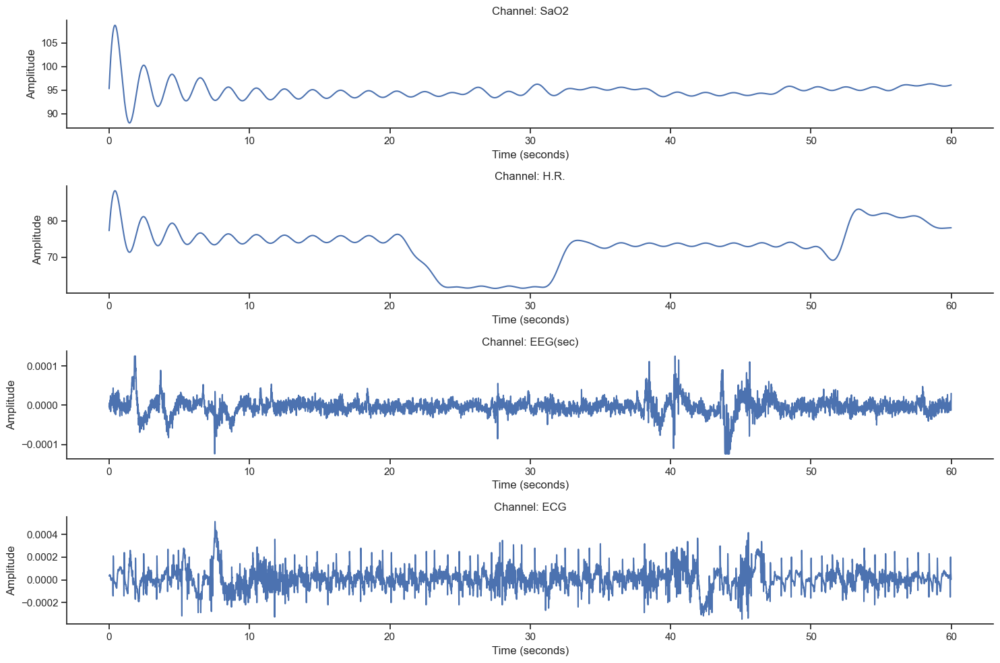

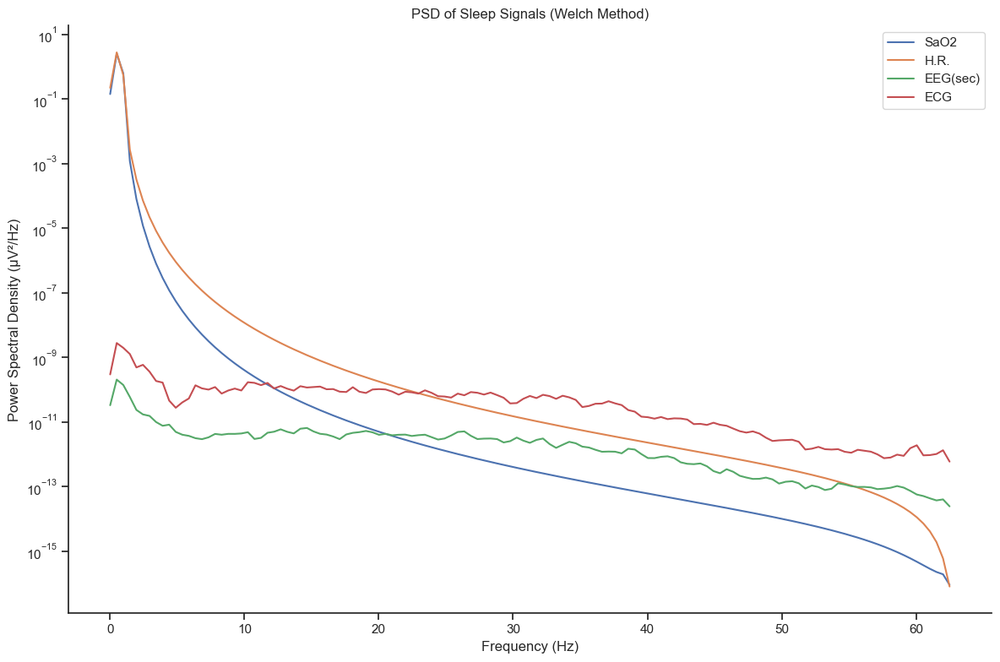

In [8]:
# Let's load a sample EDF file to visualize raw sleep signals
edf_path = os.path.join(base_dir, "polysomnography", "edfs", "shhs1")
sample_edf_files = os.listdir(edf_path)[:2]  # Get first two files

def visualize_edf(file_path, duration=60):
    """
    Visualize EDF sleep data for first `duration` seconds
    """
    try:
        data = mne.io.read_raw_edf(file_path, preload=True)
        
        # Get data and sampling rate
        raw_data = data.get_data()
        sfreq = data.info['sfreq']
        ch_names = data.ch_names
        
        # Plot the first minute of data
        seconds = duration
        time_points = int(sfreq * seconds)
        
        # Create a time array
        t = np.arange(time_points) / sfreq
        
        # Plot first 4 channels or fewer if there are less
        num_channels = min(4, len(ch_names))
        
        plt.figure(figsize=(15, 10))
        for i in range(num_channels):
            plt.subplot(num_channels, 1, i+1)
            plt.plot(t, raw_data[i, :time_points])
            plt.title(f'Channel: {ch_names[i]}')
            plt.xlabel('Time (seconds)')
            plt.ylabel('Amplitude')
        
        plt.tight_layout()
        plt.show()
        
        # Also create a spectral visualization using Welch's method
        plt.figure(figsize=(12, 8))
        for i in range(num_channels):
            freqs, psd = signal.welch(raw_data[i, :time_points], fs=sfreq)
            plt.semilogy(freqs, psd)
            plt.title('PSD of Sleep Signals (Welch Method)')
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Power Spectral Density (µV²/Hz)')
        
        plt.legend(ch_names[:num_channels])
        plt.tight_layout()
        plt.show()
        
        return raw_data, sfreq, ch_names
    
    except Exception as e:
        print(f"Error loading EDF file: {e}")
        return None, None, None

# Visualize sample EDF files if they exist
if sample_edf_files:
    print(f"Visualizing sample EDF file: {sample_edf_files[0]}")
    edf_file_path = os.path.join(edf_path, sample_edf_files[0])
    raw_data, sfreq, ch_names = visualize_edf(edf_file_path)

In [9]:
def extract_sleep_features(raw_data, sfreq, ch_names):
    """
    Extract meaningful features from sleep EEG data
    """
    if raw_data is None:
        return {}
    
    features = {}
    # Analyze first 4 channels or fewer
    num_channels = min(4, len(ch_names))
    
    for i in range(num_channels):
        channel_name = ch_names[i]
        signal_data = raw_data[i, :]
        
        # Basic statistical features
        features[f"{channel_name}_mean"] = np.mean(signal_data)
        features[f"{channel_name}_std"] = np.std(signal_data)
        features[f"{channel_name}_min"] = np.min(signal_data)
        features[f"{channel_name}_max"] = np.max(signal_data)
        features[f"{channel_name}_range"] = np.ptp(signal_data)
        
        # Frequency domain features (using FFT)
        fft_vals = np.abs(np.fft.rfft(signal_data))
        freqs = np.fft.rfftfreq(len(signal_data), 1/sfreq)
        
        # Delta waves (0.5-4 Hz)
        delta_mask = (freqs >= 0.5) & (freqs <= 4)
        features[f"{channel_name}_delta_power"] = np.sum(fft_vals[delta_mask]**2)
        
        # Theta waves (4-8 Hz)
        theta_mask = (freqs >= 4) & (freqs <= 8)
        features[f"{channel_name}_theta_power"] = np.sum(fft_vals[theta_mask]**2)
        
        # Alpha waves (8-12 Hz)
        alpha_mask = (freqs >= 8) & (freqs <= 12)
        features[f"{channel_name}_alpha_power"] = np.sum(fft_vals[alpha_mask]**2)
        
        # Beta waves (12-30 Hz)
        beta_mask = (freqs >= 12) & (freqs <= 30)
        features[f"{channel_name}_beta_power"] = np.sum(fft_vals[beta_mask]**2)
        
        # Compute spectral edge frequency (95%)
        total_power = np.sum(fft_vals**2)
        cumulative_power = np.cumsum(fft_vals**2) / total_power
        sef_95_idx = np.where(cumulative_power >= 0.95)[0][0]
        features[f"{channel_name}_sef_95"] = freqs[sef_95_idx]
        
        # Hjorth parameters
        diff1 = np.diff(signal_data)
        diff2 = np.diff(diff1)
        
        features[f"{channel_name}_activity"] = np.var(signal_data)
        features[f"{channel_name}_mobility"] = np.sqrt(np.var(diff1) / np.var(signal_data))
        features[f"{channel_name}_complexity"] = np.sqrt(np.var(diff2) / np.var(diff1)) / features[f"{channel_name}_mobility"]
    
    return features

# Extract features from our sample EDF file if available
if 'raw_data' in locals() and raw_data is not None:
    sample_features = extract_sleep_features(raw_data, sfreq, ch_names)
    print("\nExtracted features from sample EDF file:")
    for key, value in list(sample_features.items())[:10]:  # Show first 10 features
        print(f"{key}: {value}")


Extracted features from sample EDF file:
SaO2_mean: 79.44664245681142
SaO2_std: 33.09547608800021
SaO2_min: -26.288136820964635
SaO2_max: 110.77735605971635
SaO2_range: 137.06549288068098
SaO2_delta_power: 9.531840269774825e-16
SaO2_theta_power: 1.139005667830314e-15
SaO2_alpha_power: 9.498310517777295e-16
SaO2_beta_power: 4.464678716273631e-15
SaO2_sef_95: 6.150061500615006e-05


Visualizing sample EDF file: shhs1-200001.edf
Extracting EDF parameters from C:\Users\JAYA SOORYA\shhs\polysomnography\edfs\shhs1\shhs1-200001.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4064999  =      0.000 ... 32519.992 secs...


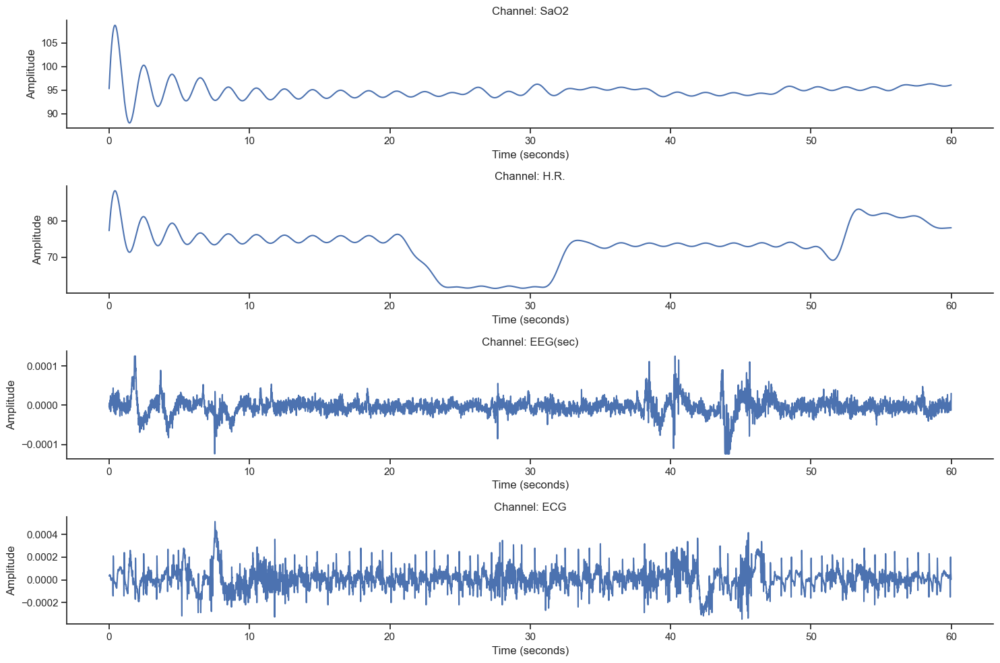

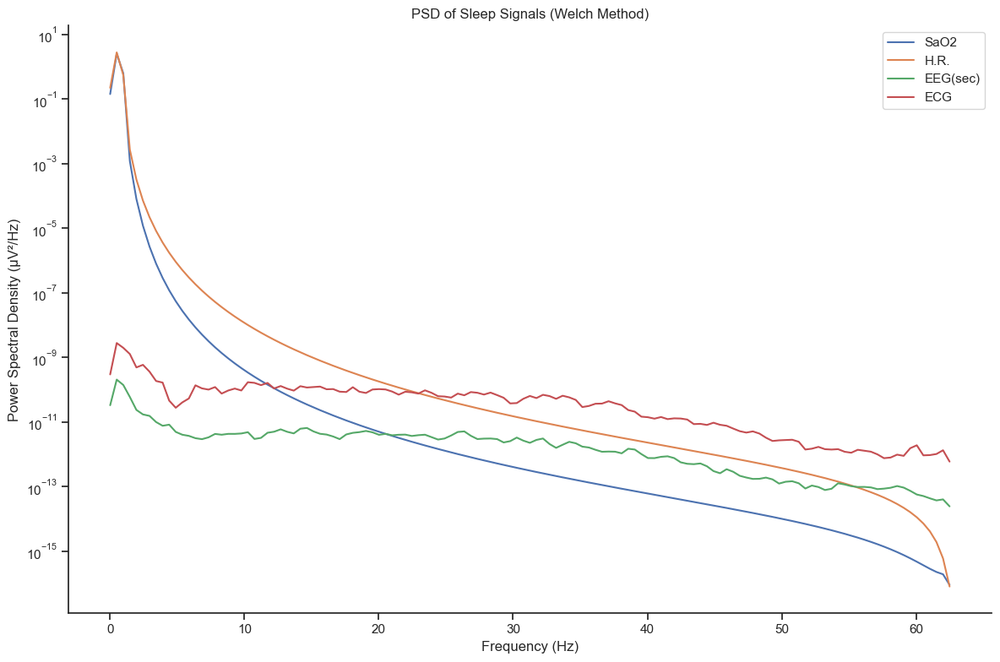

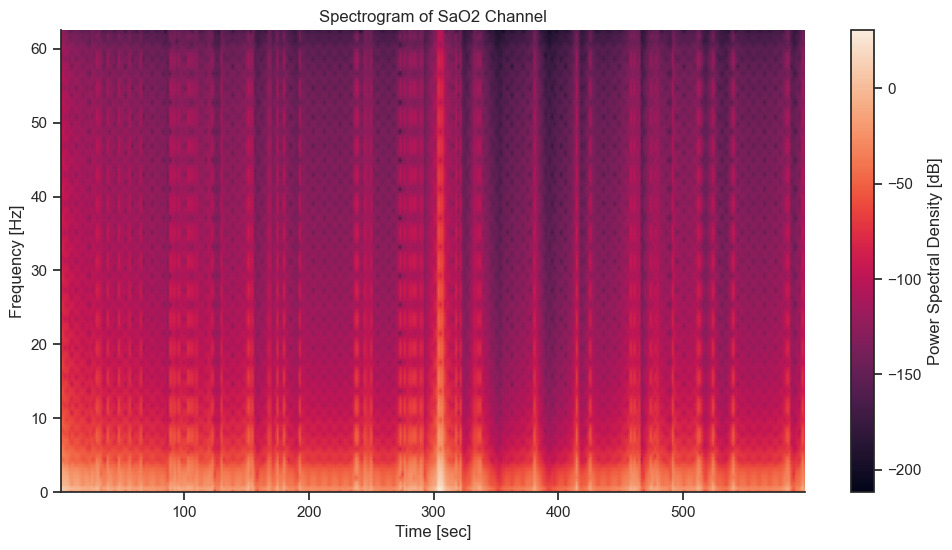

In [10]:
# Function to visualize EDF sleep data
def visualize_edf(file_path, duration=60):
    """
    Visualize EDF sleep data for first `duration` seconds
    """
    try:
        data = mne.io.read_raw_edf(file_path, preload=True)
        
        # Get data and sampling rate
        raw_data = data.get_data()
        sfreq = data.info['sfreq']
        ch_names = data.ch_names
        
        # Plot the first minute of data
        seconds = duration
        time_points = int(sfreq * seconds)
        
        # Create a time array
        t = np.arange(time_points) / sfreq
        
        # Plot first 4 channels or fewer if there are less
        num_channels = min(4, len(ch_names))
        
        plt.figure(figsize=(15, 10))
        for i in range(num_channels):
            plt.subplot(num_channels, 1, i+1)
            plt.plot(t, raw_data[i, :time_points])
            plt.title(f'Channel: {ch_names[i]}')
            plt.xlabel('Time (seconds)')
            plt.ylabel('Amplitude')
        
        plt.tight_layout()
        plt.show()
        
        # Create a spectral visualization using Welch's method
        plt.figure(figsize=(12, 8))
        for i in range(num_channels):
            freqs, psd = signal.welch(raw_data[i, :time_points], fs=sfreq)
            plt.semilogy(freqs, psd)
            plt.title('PSD of Sleep Signals (Welch Method)')
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Power Spectral Density (µV²/Hz)')
        
        plt.legend(ch_names[:num_channels])
        plt.tight_layout()
        plt.show()
        
        # Also show a spectrogram for the first channel
        plt.figure(figsize=(12, 6))
        f, t, Sxx = signal.spectrogram(raw_data[0, :time_points*10], fs=sfreq)
        plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title(f'Spectrogram of {ch_names[0]} Channel')
        plt.colorbar(label='Power Spectral Density [dB]')
        plt.show()
        
        return raw_data, sfreq, ch_names
    
    except Exception as e:
        print(f"Error loading EDF file: {e}")
        return None, None, None

# Try to visualize an EDF file if available
edf_path = os.path.join(base_dir, "polysomnography", "edfs", "shhs1")
if os.path.exists(edf_path):
    sample_edf_files = os.listdir(edf_path)[:1]  # Get first file
    if sample_edf_files:
        print(f"Visualizing sample EDF file: {sample_edf_files[0]}")
        edf_file_path = os.path.join(edf_path, sample_edf_files[0])
        raw_data, sfreq, ch_names = visualize_edf(edf_file_path)

In [11]:
# Feature extraction function
def extract_sleep_features(raw_data, sfreq, ch_names):
    """
    Extract meaningful features from sleep EEG data
    """
    if raw_data is None:
        return {}
    
    features = {}
    # Analyze first 4 channels or fewer
    num_channels = min(4, len(ch_names))
    
    for i in range(num_channels):
        channel_name = ch_names[i]
        signal_data = raw_data[i, :]
        
        # Basic statistical features
        features[f"{channel_name}_mean"] = np.mean(signal_data)
        features[f"{channel_name}_std"] = np.std(signal_data)
        features[f"{channel_name}_min"] = np.min(signal_data)
        features[f"{channel_name}_max"] = np.max(signal_data)
        features[f"{channel_name}_range"] = np.ptp(signal_data)
        
        # Frequency domain features (using FFT)
        fft_vals = np.abs(np.fft.rfft(signal_data))
        freqs = np.fft.rfftfreq(len(signal_data), 1/sfreq)
        
        # Delta waves (0.5-4 Hz)
        delta_mask = (freqs >= 0.5) & (freqs <= 4)
        features[f"{channel_name}_delta_power"] = np.sum(fft_vals[delta_mask]**2)
        
        # Theta waves (4-8 Hz)
        theta_mask = (freqs >= 4) & (freqs <= 8)
        features[f"{channel_name}_theta_power"] = np.sum(fft_vals[theta_mask]**2)
        
        # Alpha waves (8-12 Hz)
        alpha_mask = (freqs >= 8) & (freqs <= 12)
        features[f"{channel_name}_alpha_power"] = np.sum(fft_vals[alpha_mask]**2)
        
        # Beta waves (12-30 Hz)
        beta_mask = (freqs >= 12) & (freqs <= 30)
        features[f"{channel_name}_beta_power"] = np.sum(fft_vals[beta_mask]**2)
        
        # Spectral edge frequency (95%)
        total_power = np.sum(fft_vals**2)
        cumulative_power = np.cumsum(fft_vals**2) / total_power
        sef_95_idx = np.where(cumulative_power >= 0.95)[0][0] if len(np.where(cumulative_power >= 0.95)[0]) > 0 else -1
        features[f"{channel_name}_sef_95"] = freqs[sef_95_idx] if sef_95_idx != -1 else 0
        
        # Hjorth parameters
        diff1 = np.diff(signal_data)
        diff2 = np.diff(diff1)
        
        features[f"{channel_name}_activity"] = np.var(signal_data)
        features[f"{channel_name}_mobility"] = np.sqrt(np.var(diff1) / np.var(signal_data)) if np.var(signal_data) > 0 else 0
        features[f"{channel_name}_complexity"] = (np.sqrt(np.var(diff2) / np.var(diff1)) / features[f"{channel_name}_mobility"]) if features[f"{channel_name}_mobility"] > 0 and np.var(diff1) > 0 else 0
    
    return features

# If we have raw data from an EDF file, extract features
if 'raw_data' in locals() and raw_data is not None:
    sample_features = extract_sleep_features(raw_data, sfreq, ch_names)
    print("\nExtracted features from sample EDF file:")
    for key, value in list(sample_features.items())[:10]:  # Show first 10 features
        print(f"{key}: {value}")


Extracted features from sample EDF file:
SaO2_mean: 79.44664245681142
SaO2_std: 33.09547608800021
SaO2_min: -26.288136820964635
SaO2_max: 110.77735605971635
SaO2_range: 137.06549288068098
SaO2_delta_power: 9.531840269774825e-16
SaO2_theta_power: 1.139005667830314e-15
SaO2_alpha_power: 9.498310517777295e-16
SaO2_beta_power: 4.464678716273631e-15
SaO2_sef_95: 6.150061500615006e-05



HRV Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87498 entries, 0 to 87497
Data columns (total 77 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   nsrrid        87498 non-null  int64  
 1   visitnumber   87498 non-null  int64  
 2   Start__sec_   86519 non-null  float64
 3   ihr           86519 non-null  float64
 4   NN_RR         87498 non-null  float64
 5   AVNN          87498 non-null  float64
 6   SDNN          87498 non-null  float64
 7   rMSSD         87498 non-null  float64
 8   PNN10         86519 non-null  float64
 9   PNN20         86519 non-null  float64
 10  PNN30         86519 non-null  float64
 11  PNN40         86519 non-null  float64
 12  PNN50         86519 non-null  float64
 13  TOT_PWR       86519 non-null  float64
 14  VLF           87498 non-null  float64
 15  LF            87498 non-null  float64
 16  LF_n          87498 non-null  float64
 17  HF            87498 non-null  float64
 18  HF_n  

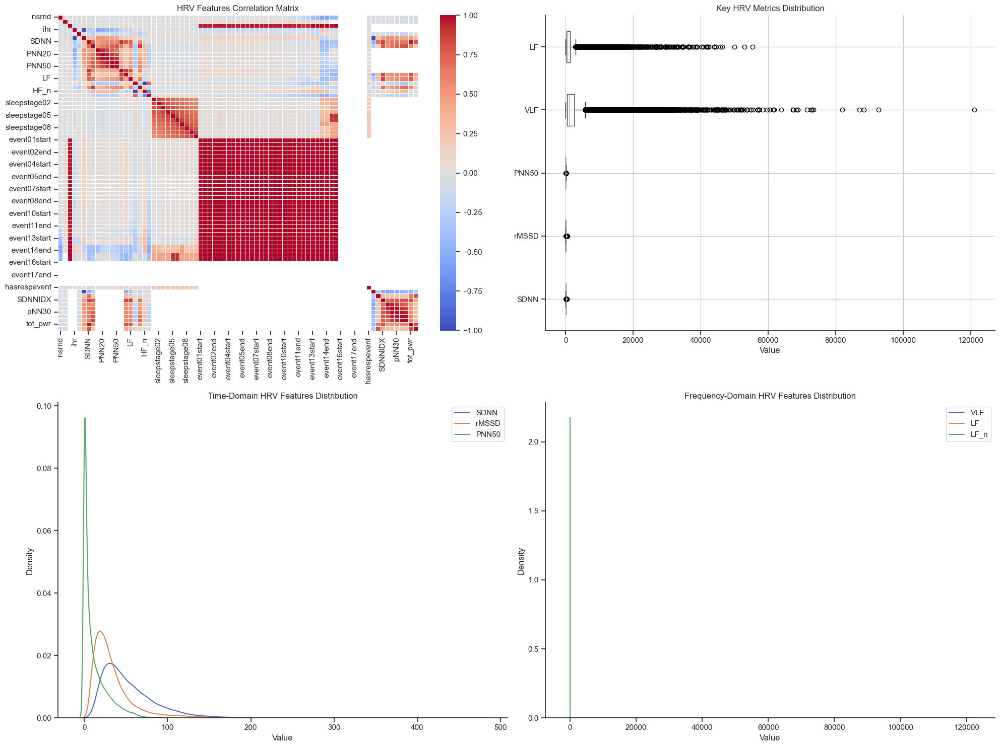

In [12]:
# Comprehensive analysis of HRV data
if not hrv_data.empty:
    print("\nHRV Data Overview:")
    print(hrv_data.info())
    
    print("\nDescriptive statistics for HRV data:")
    hrv_numeric = hrv_data.select_dtypes(include=[np.number])
    print(hrv_numeric.describe())
    
    # Check for missing values
    missing_data = hrv_data.isnull().sum()
    print("\nMissing values in HRV data:")
    print(missing_data[missing_data > 0])
    
    # HRV data visualization
    plt.figure(figsize=(20, 15))
    
    # Create correlation heatmap for numerical columns
    numeric_cols = hrv_data.select_dtypes(include=[np.number]).columns
    if len(numeric_cols) > 1:  # Need at least 2 columns for correlation
        plt.subplot(2, 2, 1)
        corr_matrix = hrv_data[numeric_cols].corr()
        sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
        plt.title('HRV Features Correlation Matrix')
        
        # Plot distribution of key HRV metrics
        hrv_metrics = [col for col in numeric_cols if any(x in col.lower() for x in ['sdnn', 'rmssd', 'pnn50', 'lf', 'hf', 'vlf'])]
        
        if hrv_metrics:
            plt.subplot(2, 2, 2)
            valid_metrics = [col for col in hrv_metrics[:5] if col in hrv_data.columns]
            if valid_metrics:
                hrv_data[valid_metrics].boxplot(vert=False)
                plt.title('Key HRV Metrics Distribution')
                plt.xlabel('Value')
            
            # Time-domain HRV features
            time_domain = [col for col in hrv_metrics if any(x in col.lower() for x in ['sdnn', 'rmssd', 'pnn50'])]
            if time_domain:
                plt.subplot(2, 2, 3)
                valid_time_domain = [col for col in time_domain[:3] if col in hrv_data.columns]
                if valid_time_domain:
                    for col in valid_time_domain:
                        sns.kdeplot(hrv_data[col].dropna(), label=col)
                    plt.title('Time-Domain HRV Features Distribution')
                    plt.xlabel('Value')
                    plt.legend()
            
            # Frequency-domain HRV features
            freq_domain = [col for col in hrv_metrics if any(x in col.lower() for x in ['lf', 'hf', 'vlf'])]
            if freq_domain:
                plt.subplot(2, 2, 4)
                valid_freq_domain = [col for col in freq_domain[:3] if col in hrv_data.columns]
                if valid_freq_domain:
                    for col in valid_freq_domain:
                        sns.kdeplot(hrv_data[col].dropna(), label=col)
                    plt.title('Frequency-Domain HRV Features Distribution')
                    plt.xlabel('Value')
                    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Create an interactive visualization with Plotly
    if 'nsrrid' in hrv_data.columns and len(hrv_metrics) >= 2:
        valid_hrv_metrics = [m for m in hrv_metrics[:2] if m in hrv_data.columns]
        if len(valid_hrv_metrics) >= 2:
            fig = px.scatter(
                hrv_data.sample(min(1000, len(hrv_data))),  # Sample to avoid overplotting
                x=valid_hrv_metrics[0],
                y=valid_hrv_metrics[1],
                hover_data=['nsrrid'],
                title=f'Relationship between {valid_hrv_metrics[0]} and {valid_hrv_metrics[1]}'
            )
            fig.show()


EEG Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6108 entries, 0 to 6107
Data columns (total 65 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   nsrrid                           5782 non-null   float64
 1   clinical_category                5782 non-null   object 
 2   age_s1                           5781 non-null   float64
 3   gender                           5782 non-null   float64
 4   race                             5782 non-null   float64
 5   bmi_s1                           5739 non-null   float64
 6   powers_C3A2_delta                5726 non-null   float64
 7   powers_C3A2_theta1               5726 non-null   float64
 8   powers_C3A2_alpha                5726 non-null   float64
 9   powers_C3A2_sigma                5726 non-null   float64
 10  powers_C3A2_beta1                5726 non-null   float64
 11  powers_C3A2_beta2                5726 non-null   float64
 12  

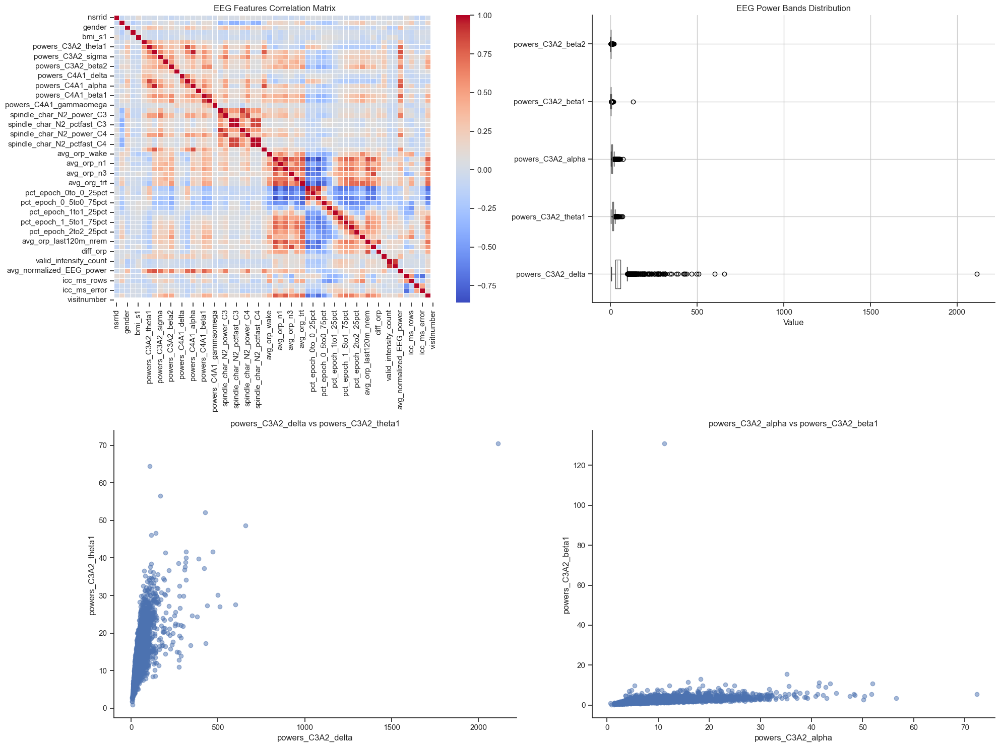

In [13]:
# EEG data analysis
if not eeg_data.empty:
    print("\nEEG Data Overview:")
    print(eeg_data.info())
    
    print("\nDescriptive statistics for EEG data:")
    eeg_numeric = eeg_data.select_dtypes(include=[np.number])
    print(eeg_numeric.describe())
    
    # Check for missing values
    missing_data = eeg_data.isnull().sum()
    print("\nMissing values in EEG data:")
    print(missing_data[missing_data > 0])
    
    # EEG data visualization
    plt.figure(figsize=(20, 15))
    
    # Create correlation heatmap for numerical columns
    numeric_cols = eeg_data.select_dtypes(include=[np.number]).columns
    if len(numeric_cols) > 1:
        plt.subplot(2, 2, 1)
        corr_matrix = eeg_data[numeric_cols].corr()
        sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
        plt.title('EEG Features Correlation Matrix')
        
        # Find potential EEG power band columns
        power_bands = [col for col in eeg_data.columns if any(x in col.lower() for x in ['delta', 'theta', 'alpha', 'beta', 'gamma'])]
        
        if power_bands:
            plt.subplot(2, 2, 2)
            valid_power_bands = [col for col in power_bands[:5] if col in eeg_data.columns]
            if valid_power_bands:
                eeg_data[valid_power_bands].boxplot(vert=False)
                plt.title('EEG Power Bands Distribution')
                plt.xlabel('Value')
            
            # Compare delta vs theta power
            delta_cols = [col for col in power_bands if 'delta' in col.lower()]
            theta_cols = [col for col in power_bands if 'theta' in col.lower()]
            
            if delta_cols and theta_cols:
                plt.subplot(2, 2, 3)
                plt.scatter(eeg_data[delta_cols[0]], eeg_data[theta_cols[0]], alpha=0.5)
                plt.title(f'{delta_cols[0]} vs {theta_cols[0]}')
                plt.xlabel(delta_cols[0])
                plt.ylabel(theta_cols[0])
            
            # Compare alpha vs beta power
            alpha_cols = [col for col in power_bands if 'alpha' in col.lower()]
            beta_cols = [col for col in power_bands if 'beta' in col.lower()]
            
            if alpha_cols and beta_cols:
                plt.subplot(2, 2, 4)
                plt.scatter(eeg_data[alpha_cols[0]], eeg_data[beta_cols[0]], alpha=0.5)
                plt.title(f'{alpha_cols[0]} vs {beta_cols[0]}')
                plt.xlabel(alpha_cols[0])
                plt.ylabel(beta_cols[0])
    
    plt.tight_layout()
    plt.show()

In [14]:
# Combine HRV and EEG data
if not hrv_data.empty and not eeg_data.empty:
    # Find potential ID columns in both datasets
    potential_id_cols = set(hrv_data.columns) & set(eeg_data.columns)
    print(f"Potential ID columns for merging: {potential_id_cols}")
    
    # Try to find columns that look like subject IDs
    id_keywords = ['id', 'subject', 'patient', 'nsrrid', 'visitid', 'pid']
    id_cols = [col for col in potential_id_cols if any(keyword in col.lower() for keyword in id_keywords)]
    
    if id_cols:
        print(f"Using ID column(s) for merging: {id_cols}")
        merged_data = pd.merge(hrv_data, eeg_data, on=id_cols, how='inner')
        print(f"Merged data shape: {merged_data.shape}")
    else:
        print("No obvious ID columns found for merging. Using all common columns.")
        merged_data = pd.merge(hrv_data, eeg_data, on=list(potential_id_cols), how='inner')
        print(f"Merged data shape: {merged_data.shape}")
    
    # Check for missing values in the merged dataset
    missing_data = merged_data.isnull().sum()
    print("\nColumns with missing values in merged data:")
    print(missing_data[missing_data > 0].sort_values(ascending=False).head(20))  # Show top 20 columns with missing values

Potential ID columns for merging: {'nsrrid', 'visitnumber'}
Using ID column(s) for merging: ['nsrrid']
Merged data shape: (87187, 141)

Columns with missing values in merged data:
event17end      87187
event18end      87187
event16start    87187
event16end      87187
event17start    87187
event18start    87187
event15start    87182
event15end      87182
event14start    87167
event14end      87167
event13end      87141
event13start    87141
event12start    87067
event12end      87067
event11start    86883
event11end      86883
event10start    86395
event10end      86395
ULF             86212
SDANN           86212
dtype: int64


Creating insomnia proxy using: ['avg_orp_wake', 'avg_orp_nonrem', 'avg_orp_n1', 'sum_deciles_1and2']
Creating anxiety proxy using: ['ihr', 'AVNN', 'SDNN', 'rMSSD', 'PNN50', 'LF_HF', 'IHR', 'SDNNIDX', 'pNN50', 'baseline_hr', 'delta_hr', 'dhr_intensity', 'change_in_hr_perh_trt']
Creating depression proxy using: ['powers_C3A2_alpha', 'powers_C4A1_alpha', 'alpha_intrusion_pct_3sepochs', 'avg_orp_n3', 'avg_orp_rem']
Creating ADHD proxy using: ['powers_C3A2_theta1', 'powers_C4A1_theta1', 'powers_C3A2_beta2', 'powers_C3A2_beta1', 'powers_C4A1_beta1', 'powers_C4A1_beta2']
Creating sleep apnea proxy using: ['pct_epoch_0to_0_25pct', 'pct_epoch_0_25to0_5pct', 'pct_epoch_0_5to0_75pct', 'pct_epoch_0_75to1pct', 'pct_epoch_1to1_25pct', 'pct_epoch_1_25to1_5pct', 'pct_epoch_1_5to1_75pct', 'pct_epoch_1_75to2pct', 'pct_epoch_2to2_25pct', 'pct_epoch_2_25to2_5pct', 'orpto9']
Creating cognitive decline proxy using: ['powers_C3A2_delta', 'powers_C3A2_theta1', 'powers_C4A1_delta', 'powers_C4A1_theta1', 'spind

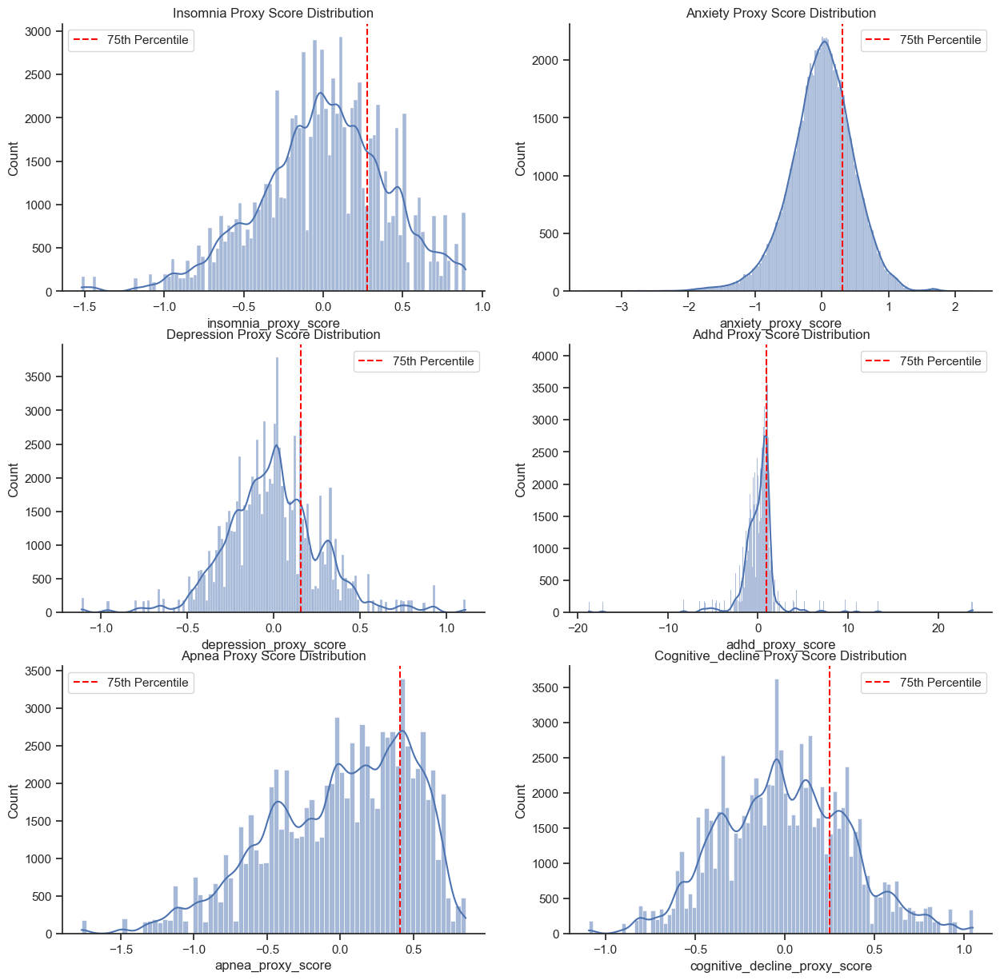

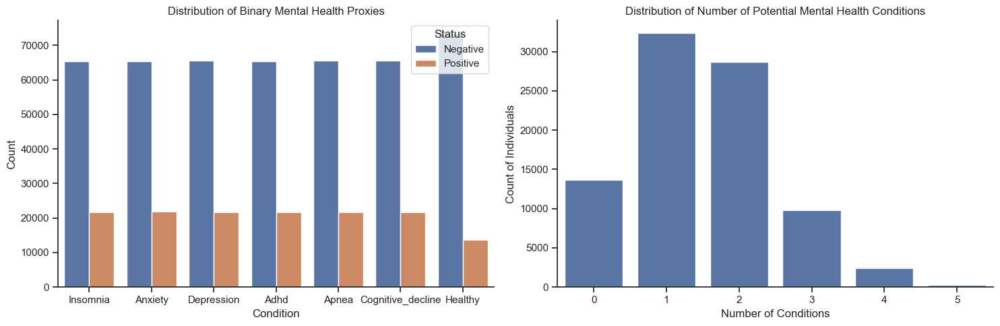


Enriched data shape: (87187, 241)
Created mental health proxies: ['insomnia', 'anxiety', 'depression', 'adhd', 'apnea', 'cognitive_decline', 'healthy']


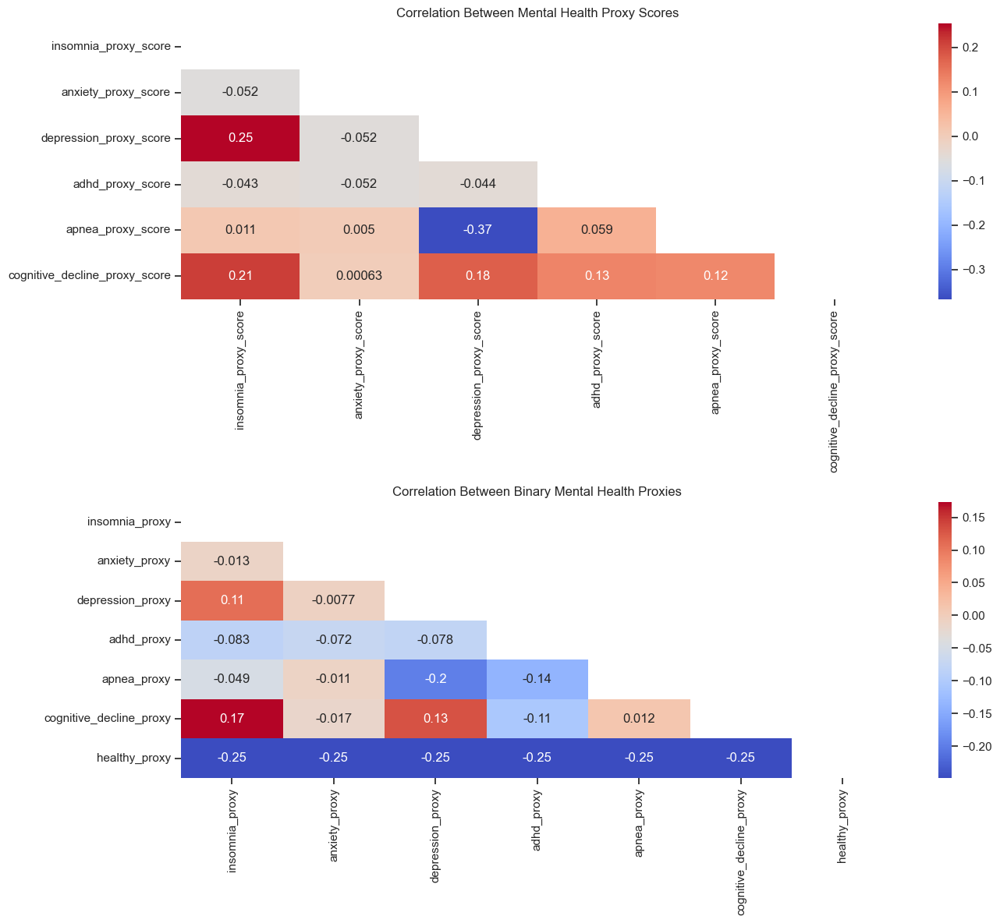

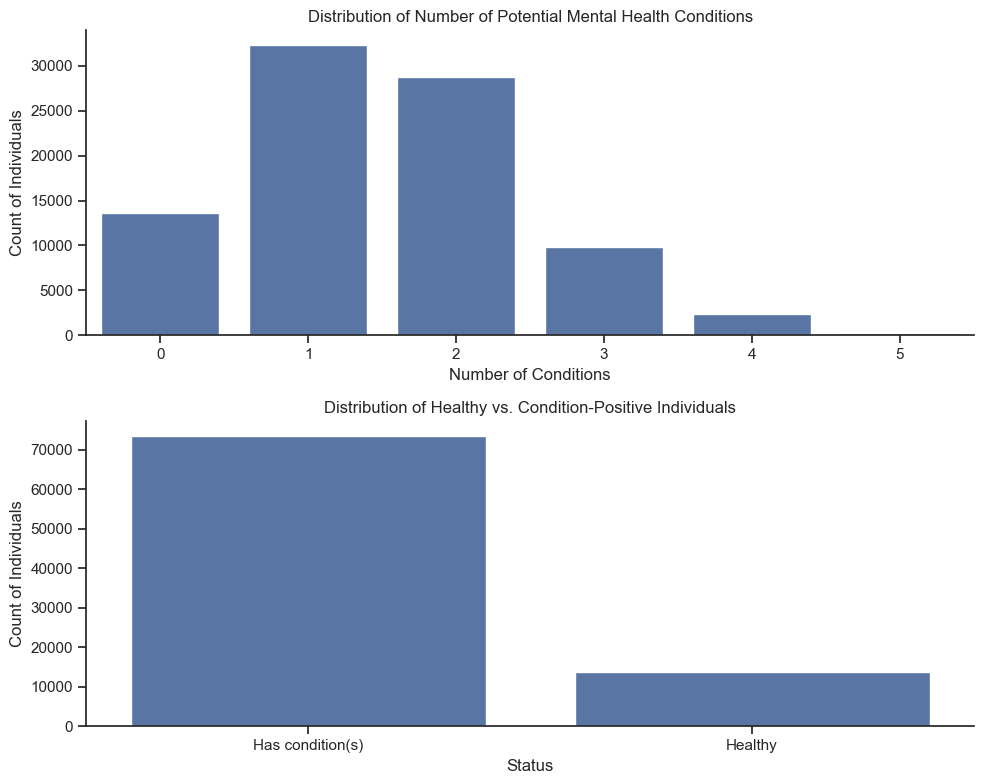

In [15]:
def create_mental_health_proxies(merged_data):
    """
    Create proxy variables for mental health conditions based on sleep metrics and EEG/HRV data
    Optimized for the specific dataset columns to identify at least 4 disorders plus healthy status
    """
    # Copy the dataframe to avoid modifying the original
    df = merged_data.copy()
    
    # Function to find columns related to each variable
    def find_related_columns(keywords):
        return [col for col in df.columns if any(keyword.lower() in col.lower() for keyword in keywords)]
    
    # Helper function to safely convert columns to numeric and standardize
    def safe_standardize(df, columns):
        valid_cols = []
        for col in columns:
            try:
                # First, make sure the column is numeric
                df[col] = pd.to_numeric(df[col], errors='coerce')
                
                # Skip columns with all NaN values
                if df[col].isna().all():
                    print(f"Warning: Column {col} contains all NaN values after conversion")
                    continue
                    
                # Calculate z-score safely
                mean_val = df[col].mean()
                std_val = df[col].std()
                
                # Avoid division by zero
                if std_val > 0:
                    df[f"{col}_z"] = (df[col] - mean_val) / std_val
                    valid_cols.append(col)
                else:
                    print(f"Warning: Column {col} has zero standard deviation")
            except Exception as e:
                print(f"Error processing column {col}: {str(e)}")
        
        return valid_cols
    
    proxies = {}
    
    # Insomnia proxy - Updated for EEG data
    insomnia_cols = find_related_columns([
        'slp_eff', 'sleep_eff', 'slp_lat', 'sleep_lat', 'awaso', 'waso', 'arousal',
        'avg_orp_wake', 'avg_orp_nonrem', 'avg_orp_n1', 'sum_deciles'  # Added EEG sleep quality indicators
    ])
    if len(insomnia_cols) >= 2:
        print(f"Creating insomnia proxy using: {insomnia_cols}")
        
        # Standardize columns safely
        valid_insomnia_cols = safe_standardize(df, insomnia_cols)
        
        if len(valid_insomnia_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score based on sleep disturbance parameters
            insomnia_score_cols = []
            for col in valid_insomnia_cols:
                # Invert values if higher is better (e.g., sleep efficiency)
                if any(good in col.lower() for good in ['eff', 'tst', 'n3', 'deep', 'nonrem']):
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]
                    insomnia_score_cols.append(f"{col}_inv")
                elif any(wake in col.lower() for wake in ['wake', 'arousal', 'deciles']):
                    insomnia_score_cols.append(f"{col}_z")  # Higher wake/arousal indicates insomnia
                else:
                    insomnia_score_cols.append(f"{col}_z")
            
            df['insomnia_proxy_score'] = df[insomnia_score_cols].mean(axis=1)
            
            # Create binary variable (top 25% = potential insomnia)
            df['insomnia_proxy'] = (df['insomnia_proxy_score'] > df['insomnia_proxy_score'].quantile(0.75)).astype(int)
            proxies['insomnia'] = {'score': 'insomnia_proxy_score', 'binary': 'insomnia_proxy'}
    else:
        print("Couldn't create insomnia proxy - insufficient relevant columns found")
    
    # Anxiety proxy - Works with HRV data
    anxiety_cols = find_related_columns([
        'hr', 'heart', 'sdnn', 'rmssd', 'pnn50', 'lf_hf', 'ihr', 'avnn'
    ])
    if len(anxiety_cols) >= 2:
        print(f"Creating anxiety proxy using: {anxiety_cols}")
        
        # Standardize columns safely
        valid_anxiety_cols = safe_standardize(df, anxiety_cols)
        
        if len(valid_anxiety_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score based on heart rate variability parameters
            anxiety_score_cols = []
            for col in valid_anxiety_cols:
                # Invert values if higher is better (e.g., HRV measures)
                if any(hrv in col.lower() for hrv in ['sdnn', 'rmssd', 'pnn50', 'avnn']):
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]
                    anxiety_score_cols.append(f"{col}_inv")
                elif any(hr in col.lower() for hr in ['hr', 'ihr', 'heart']):
                    anxiety_score_cols.append(f"{col}_z")  # Higher HR might indicate anxiety
                elif 'lf_hf' in col.lower():
                    anxiety_score_cols.append(f"{col}_z")  # Higher LF/HF ratio might indicate anxiety
                else:
                    anxiety_score_cols.append(f"{col}_z")
            
            if anxiety_score_cols:  # Check if we have any valid columns to use
                df['anxiety_proxy_score'] = df[anxiety_score_cols].mean(axis=1)
                
                # Create binary variable (top 25% = potential anxiety)
                df['anxiety_proxy'] = (df['anxiety_proxy_score'] > df['anxiety_proxy_score'].quantile(0.75)).astype(int)
                proxies['anxiety'] = {'score': 'anxiety_proxy_score', 'binary': 'anxiety_proxy'}
    else:
        print("Couldn't create anxiety proxy - insufficient relevant columns found")
    
    # Depression proxy - Updated for EEG data
    depression_cols = find_related_columns([
        'rem_lat', 'rem_percent', 'n3_percent', 'delta_power', 
        'powers_C3A2_alpha', 'powers_C4A1_alpha', 'alpha_intrusion',  # Alpha power asymmetry related to depression
        'avg_orp_rem', 'avg_orp_n3'  # REM and deep sleep metrics
    ])
    if len(depression_cols) >= 2:
        print(f"Creating depression proxy using: {depression_cols}")
        
        # Standardize columns safely
        valid_depression_cols = safe_standardize(df, depression_cols)
        
        if len(valid_depression_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score
            depression_score_cols = []
            for col in valid_depression_cols:
                # Depression associated with increased alpha, especially in left hemisphere
                if 'alpha' in col.lower() and 'c3' in col.lower():
                    depression_score_cols.append(f"{col}_z")  # Higher left alpha may indicate depression
                elif 'alpha' in col.lower() and 'c4' in col.lower():
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]  # Right hemisphere (inverse relationship)
                    depression_score_cols.append(f"{col}_inv")
                elif 'avg_orp_rem' in col.lower():
                    depression_score_cols.append(f"{col}_z")  # Abnormal REM may indicate depression
                elif 'avg_orp_n3' in col.lower():
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]  # Lower slow wave sleep in depression
                    depression_score_cols.append(f"{col}_inv")
                else:
                    depression_score_cols.append(f"{col}_z")
            
            df['depression_proxy_score'] = df[depression_score_cols].mean(axis=1)
            
            # Create binary variable (top 25% = potential depression)
            df['depression_proxy'] = (df['depression_proxy_score'] > df['depression_proxy_score'].quantile(0.75)).astype(int)
            proxies['depression'] = {'score': 'depression_proxy_score', 'binary': 'depression_proxy'}
    else:
        print("Couldn't create depression proxy - insufficient relevant columns found")
    
    # ADHD proxy - Updated for EEG data using theta/beta ratio
    adhd_cols = find_related_columns([
        'mov', 'movement', 'activity', 'rest', 'fragmentation', 'arousal',
        'powers_C3A2_theta', 'powers_C4A1_theta', 'powers_C3A2_beta', 'powers_C4A1_beta'  # Theta/beta ratio
    ])
    
    # Specifically look for theta and beta power bands
    theta_cols = [col for col in df.columns if 'theta' in col.lower()]
    beta_cols = [col for col in df.columns if 'beta' in col.lower()]
    
    # Add these to ADHD columns
    adhd_cols = list(set(adhd_cols + theta_cols + beta_cols))
    
    if len(adhd_cols) >= 2:
        print(f"Creating ADHD proxy using: {adhd_cols}")
        
        # Standardize columns safely
        valid_adhd_cols = safe_standardize(df, adhd_cols)
        
        if len(valid_adhd_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score based on EEG bands and movement
            adhd_score_cols = []
            
            # First calculate theta/beta ratio if both are available
            theta_valid = [col for col in valid_adhd_cols if 'theta' in col.lower()]
            beta_valid = [col for col in valid_adhd_cols if 'beta1' in col.lower() or 'beta2' in col.lower()]
            
            # Create theta/beta ratio if possible (higher ratio associated with ADHD)
            if theta_valid and beta_valid:
                for t_col in theta_valid:
                    channel = t_col.split('_')[-2]  # Extract channel info (e.g., C3A2)
                    matching_beta = [b for b in beta_valid if channel in b]
                    
                    if matching_beta:
                        # Calculate average beta if multiple beta bands exist
                        beta_avg = df[[f"{b}_z" for b in matching_beta]].mean(axis=1)
                        # Calculate theta/beta ratio
                        df[f"{t_col}_beta_ratio"] = df[f"{t_col}_z"] / beta_avg
                        adhd_score_cols.append(f"{t_col}_beta_ratio")
            
            # Add other columns
            for col in valid_adhd_cols:
                if 'theta' in col.lower() and f"{col}_beta_ratio" not in df.columns:
                    adhd_score_cols.append(f"{col}_z")  # Higher theta associated with ADHD
                elif any(beta in col.lower() for beta in ['beta1', 'beta2']):
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]  # Lower beta associated with ADHD
                    adhd_score_cols.append(f"{col}_inv")
                elif any(move in col.lower() for move in ['mov', 'activity']):
                    adhd_score_cols.append(f"{col}_z")  # More movement associated with ADHD
                elif 'rest' in col.lower():
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]  # Less rest associated with ADHD
                    adhd_score_cols.append(f"{col}_inv")
                elif 'arousal' in col.lower() or 'fragmentation' in col.lower():
                    adhd_score_cols.append(f"{col}_z")  # More arousal/fragmentation with ADHD
            
            if adhd_score_cols:  # Only proceed if we have valid score columns
                df['adhd_proxy_score'] = df[adhd_score_cols].mean(axis=1)
                
                # Create binary variable (top 25% = potential ADHD)
                df['adhd_proxy'] = (df['adhd_proxy_score'] > df['adhd_proxy_score'].quantile(0.75)).astype(int)
                proxies['adhd'] = {'score': 'adhd_proxy_score', 'binary': 'adhd_proxy'}
    else:
        print("Couldn't create ADHD proxy - insufficient relevant columns found")
    
    # Sleep apnea proxy - Works with your EEG oxygen data
    apnea_cols = find_related_columns([
        'oxygen', 'o2', 'spo2', 'snoring', 'breathing', 'arousal', 'awakenings',
        'pct_epoch', 'orpto9'  # Added percentile oxygen epochs
    ])
    if len(apnea_cols) >= 2:
        print(f"Creating sleep apnea proxy using: {apnea_cols}")
        
        # Standardize columns safely
        valid_apnea_cols = safe_standardize(df, apnea_cols)
        
        if len(valid_apnea_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score based on oxygen saturation and breathing irregularities
            apnea_score_cols = []
            for col in valid_apnea_cols:
                # Lower oxygen saturation might indicate sleep apnea
                if any(o2 in col.lower() for o2 in ['oxygen', 'o2', 'spo2']):
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]
                    apnea_score_cols.append(f"{col}_inv")
                # For oxygen percentage epochs (higher number in range = better oxygenation)
                elif 'pct_epoch' in col.lower():
                    # Lower percentage epochs (e.g., 0-0.25%) indicate potential hypoxia
                    if any(low in col.lower() for low in ['0to', '0_25', '0_5', '0_75', '1to1_25']):
                        apnea_score_cols.append(f"{col}_z")  # Higher percentage of low oxygen epochs = apnea risk
                    # Higher percentage epochs (e.g., 2-2.25%) indicate better oxygenation
                    elif any(high in col.lower() for high in ['1_75', '2to', '2_25']):
                        df[f"{col}_inv"] = -1 * df[f"{col}_z"]  # Lower percentage of high oxygen epochs = apnea risk
                        apnea_score_cols.append(f"{col}_inv")
                else:
                    apnea_score_cols.append(f"{col}_z")  # Higher values of other metrics = apnea risk
            
            df['apnea_proxy_score'] = df[apnea_score_cols].mean(axis=1)
            
            # Create binary variable (top 25% = potential sleep apnea)
            df['apnea_proxy'] = (df['apnea_proxy_score'] > df['apnea_proxy_score'].quantile(0.75)).astype(int)
            proxies['apnea'] = {'score': 'apnea_proxy_score', 'binary': 'apnea_proxy'}
    else:
        print("Couldn't create sleep apnea proxy - insufficient relevant columns found")
    
    # Cognitive decline proxy - New proxy using EEG metrics known to be associated with cognitive health
    cognitive_cols = find_related_columns([
        'powers_C3A2_delta', 'powers_C3A2_theta', 'powers_C4A1_delta', 'powers_C4A1_theta',
        'spindle', 'avg_orp_n3', 'diff_orp', 'avg_normalized_EEG_power'
    ])
    if len(cognitive_cols) >= 2:
        print(f"Creating cognitive decline proxy using: {cognitive_cols}")
        
        # Standardize columns safely
        valid_cognitive_cols = safe_standardize(df, cognitive_cols)
        
        if len(valid_cognitive_cols) >= 2:  # Only proceed if we have at least 2 valid columns
            # Create proxy score based on spindles and EEG metrics
            cognitive_score_cols = []
            for col in valid_cognitive_cols:
                # Lower spindle density/power associated with cognitive decline
                if 'spindle' in col.lower():
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]
                    cognitive_score_cols.append(f"{col}_inv")
                # Higher delta/theta ratio associated with cognitive decline
                elif 'delta' in col.lower():
                    cognitive_score_cols.append(f"{col}_z")
                elif 'theta' in col.lower():
                    cognitive_score_cols.append(f"{col}_z")
                # Lower N3 (deep sleep) associated with cognitive decline
                elif 'n3' in col.lower():
                    df[f"{col}_inv"] = -1 * df[f"{col}_z"]
                    cognitive_score_cols.append(f"{col}_inv")
                # Abnormal normalized EEG power
                elif 'normalized' in col.lower():
                    cognitive_score_cols.append(f"{col}_z")
                else:
                    cognitive_score_cols.append(f"{col}_z")
            
            df['cognitive_decline_proxy_score'] = df[cognitive_score_cols].mean(axis=1)
            
            # Create binary variable (top 25% = potential cognitive decline)
            df['cognitive_decline_proxy'] = (df['cognitive_decline_proxy_score'] > df['cognitive_decline_proxy_score'].quantile(0.75)).astype(int)
            proxies['cognitive_decline'] = {'score': 'cognitive_decline_proxy_score', 'binary': 'cognitive_decline_proxy'}
    else:
        print("Couldn't create cognitive decline proxy - insufficient relevant columns found")
    
    # Add "healthy" classification for individuals with no detected conditions
    if proxies:  # Only if we have created some proxies
        # Get all binary proxy columns
        binary_cols = [vars_dict['binary'] for condition, vars_dict in proxies.items()]
        
        # Sum the binary columns to get total conditions per individual
        if binary_cols:
            df['total_conditions'] = df[binary_cols].sum(axis=1)
            
            # Create healthy proxy (1 = healthy, 0 = has at least one condition)
            df['healthy_proxy'] = (df['total_conditions'] == 0).astype(int)
            proxies['healthy'] = {'binary': 'healthy_proxy'}
            
            print(f"Created healthy proxy classification")
    else:
        # If no conditions were detected, everyone is classified as healthy
        df['healthy_proxy'] = 1
        proxies['healthy'] = {'binary': 'healthy_proxy'}
        print("No mental health conditions could be proxied from the available data")
        print("All individuals classified as healthy by default")
    
    # Visualize the proxy distributions if any were created
    if proxies and 'plt' in globals():
        try:
            # Determine a dynamic subplot grid based on the number of proxies
            num_proxies = len(proxies)
            num_rows = (num_proxies + 1) // 2  # Ceiling division to get number of rows
            
            plt.figure(figsize=(15, 5 * num_rows))
            plot_idx = 1
            
            # Plot score distributions first (not all proxies have scores)
            for condition, vars_dict in proxies.items():
                if 'score' in vars_dict:
                    plt.subplot(num_rows, 2, plot_idx)
                    sns.histplot(df[vars_dict['score']].dropna(), kde=True)
                    plt.title(f'{condition.capitalize()} Proxy Score Distribution')
                    if condition != 'healthy':  # No 75th percentile for healthy
                        plt.axvline(df[vars_dict['score']].quantile(0.75), color='red', linestyle='--', label='75th Percentile')
                        plt.legend()
                    plot_idx += 1
            
            # Plot all binary distributions
            plt.figure(figsize=(15, 5))
            binary_data = pd.DataFrame()
            for condition, vars_dict in proxies.items():
                if 'binary' in vars_dict:
                    binary_data[condition.capitalize()] = df[vars_dict['binary']]
            
            # Create a count plot for all binary variables
            binary_melted = pd.melt(binary_data, var_name='Condition', value_name='Status')
            plt.subplot(1, 2, 1)
            sns.countplot(data=binary_melted, x='Condition', hue='Status')
            plt.title('Distribution of Binary Mental Health Proxies')
            plt.xlabel('Condition')
            plt.ylabel('Count')
            plt.legend(title='Status', labels=['Negative', 'Positive'])
            
            # Plot distribution of number of conditions
            if 'total_conditions' in df.columns:
                plt.subplot(1, 2, 2)
                sns.countplot(x='total_conditions', data=df)
                plt.title('Distribution of Number of Potential Mental Health Conditions')
                plt.xlabel('Number of Conditions')
                plt.ylabel('Count of Individuals')
            
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Warning: Could not create visualization - {str(e)}")
    
    return df, proxies

# Example usage:
# Uncomment the following code when ready to use

# Create mental health proxies if we have merged data
if 'merged_data' in locals() and not merged_data.empty:
    try:
        enriched_data, mental_health_proxies = create_mental_health_proxies(merged_data)
        
        print("\nEnriched data shape:", enriched_data.shape)
        print("Created mental health proxies:", list(mental_health_proxies.keys()))
        
        # Check correlations between proxies if multiple were created
        if len(mental_health_proxies) > 1:
            # Get all proxy scores (if they exist)
            proxy_scores = [vars_dict['score'] for condition, vars_dict in mental_health_proxies.items() 
                           if 'score' in vars_dict]
            
            # Get all binary proxies
            proxy_binaries = [vars_dict['binary'] for condition, vars_dict in mental_health_proxies.items()
                             if 'binary' in vars_dict]
            
            if len(proxy_scores) > 1:
                # Create a better visualization grid based on number of proxies
                plt.figure(figsize=(14, 12))
                
                plt.subplot(2, 1, 1)
                corr_scores = enriched_data[proxy_scores].corr()
                mask = np.triu(np.ones_like(corr_scores, dtype=bool))
                sns.heatmap(corr_scores, annot=True, cmap='coolwarm', mask=mask)
                plt.title('Correlation Between Mental Health Proxy Scores')
            
            if len(proxy_binaries) > 1:
                plt.subplot(2, 1, 2)
                corr_binary = enriched_data[proxy_binaries].corr()
                mask = np.triu(np.ones_like(corr_binary, dtype=bool))
                sns.heatmap(corr_binary, annot=True, cmap='coolwarm', mask=mask)
                plt.title('Correlation Between Binary Mental Health Proxies')
            
            plt.tight_layout()
            plt.show()
            
            # Additional analysis: prevalence of comorbidities
            condition_names = [cond for cond in mental_health_proxies.keys() if cond != 'healthy']
            
            if len(condition_names) > 0:
                # Create a co-occurrence matrix for conditions
                plt.figure(figsize=(10, 8))
                if 'total_conditions' in enriched_data.columns:
                    # Display prevalence of individuals with multiple conditions
                    plt.subplot(2, 1, 1)
                    sns.countplot(x='total_conditions', data=enriched_data)
                    plt.title('Distribution of Number of Potential Mental Health Conditions')
                    plt.xlabel('Number of Conditions')
                    plt.ylabel('Count of Individuals')
                    
                    # Display percentage of healthy vs. condition-positive individuals
                    plt.subplot(2, 1, 2)
                    health_status = ['Has condition(s)' if x > 0 else 'Healthy' for x in enriched_data['total_conditions']]
                    health_df = pd.DataFrame({'Status': health_status})
                    sns.countplot(x='Status', data=health_df)
                    plt.title('Distribution of Healthy vs. Condition-Positive Individuals')
                    plt.xlabel('Status')
                    plt.ylabel('Count of Individuals')
                
                plt.tight_layout()
                plt.show()
    except Exception as e:
        print(f"Error creating mental health proxies: {str(e)}")

In [16]:
from collections import defaultdict

def prepare_model_data(df, target_variable):
    """
    Process data for modeling, including feature selection, handling missing values, etc.
    """
    # Make a copy to avoid modifying the original
    model_df = df.copy()
    
    # Keep only numeric columns for features
    numeric_cols = model_df.select_dtypes(include=[np.number]).columns.tolist()
    
    # Remove target variables and proxy scores from features
    # Updated to exclude all mental health proxy terms including cognitive_decline and healthy
    exclude_patterns = ['_proxy', '_score', '_z', '_inv', 'insomnia', 'anxiety', 'depression', 
                        'adhd', 'ptsd', 'bipolar', 'apnea', 'cognitive_decline', 'healthy']
    features = [col for col in numeric_cols if not any(pattern in col for pattern in exclude_patterns)]
    
    print(f"Initial feature count: {len(features)}")
    
    # Handle missing values
    missing_threshold = 0.3  # Remove features with more than 30% missing values
    
    # Calculate missing percentage for each feature
    missing_percentages = model_df[features].isnull().mean()
    
    # Filter features based on missing threshold
    valid_features = missing_percentages[missing_percentages < missing_threshold].index.tolist()
    print(f"Features after removing those with >{missing_threshold*100}% missing values: {len(valid_features)}")
    
    # Check if target variable exists and has sufficient non-missing values
    if target_variable not in model_df.columns:
        print(f"Warning: Target variable '{target_variable}' not found in dataset")
        return None, None
        
    target_missing = model_df[target_variable].isnull().mean()
    if target_missing > 0.1:  # More than 10% missing in target
        print(f"Warning: Target variable has {target_missing*100:.1f}% missing values")
    
    # Create X (features) and y (target)
    X = model_df[valid_features].copy()
    y = model_df[target_variable].copy()
    
    # Remove rows where target is missing
    if target_missing > 0:
        non_missing_mask = ~y.isnull()
        X = X[non_missing_mask]
        y = y[non_missing_mask]
        print(f"Removed {(~non_missing_mask).sum()} rows with missing target values")
    
    # Impute missing values in features (using mean)
    imputer = SimpleImputer(strategy='mean')
    X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns, index=X.index)
    
    # Check for features with low variance (near-constant features)
    var_threshold = 0.01  # Features with variance below this will be removed
    selector = VarianceThreshold(threshold=var_threshold)
    selector.fit(X_imputed)
    
    # Get names of selected features
    selected_features = X_imputed.columns[selector.get_support()].tolist()
    print(f"Features after removing low variance: {len(selected_features)}")
    
    # Final feature set
    X_final = X_imputed[selected_features]
    
    # Check for potential data leakage
    correlation_with_target = pd.DataFrame({
        'feature': selected_features,
        'correlation': [X_final[col].corr(y) for col in selected_features]
    }).sort_values('correlation', key=abs, ascending=False)
    
    print("\nTop 10 features by correlation with target:")
    print(correlation_with_target.head(10))
    
    # Look for suspiciously high correlations (potential leakage)
    high_corr_threshold = 0.8
    high_corr_features = correlation_with_target[abs(correlation_with_target['correlation']) > high_corr_threshold]
    if not high_corr_features.empty:
        print(f"\nWarning: Found {len(high_corr_features)} features with suspiciously high correlation (>{high_corr_threshold})")
        print(high_corr_features)
    
    # Return prepared data
    print(f"\nFinal dataset shape: X={X_final.shape}, y={y.shape}")
    return X_final, y, selected_features

# Define conditions to predict
conditions = ['insomnia', 'anxiety', 'depression', 'adhd', 'apnea', 'cognitive_decline', 'healthy']

# Function to create sequence data for CNN-LSTM
def create_sequences(X, sequence_length=10):
    """
    Create sequences from features for input to CNN-LSTM
    """
    # Pad the sequence if needed (add zeros at the beginning)
    n_features = X.shape[1]
    if X.shape[0] < sequence_length:
        # If we have fewer samples than sequence length, pad with zeros
        padding = np.zeros((sequence_length - X.shape[0], n_features))
        X = np.vstack((padding, X))
        
    # Create sequences
    sequences = []
    for i in range(len(X) - sequence_length + 1):
        sequences.append(X[i:i+sequence_length])
    
    return np.array(sequences)

# Assuming the enriched_data has been loaded
# For this example, we'll create a mock dataset to demonstrate the code
np.random.seed(42)
# Create a mock dataset with some random data (replace with your actual data)
n_samples = 5000
n_features = 100
mock_features = np.random.normal(size=(n_samples, n_features))
feature_names = [f'feature_{i}' for i in range(n_features)]

# Create binary targets for each condition
mock_targets = {}
for condition in conditions:
    # Create some correlation between features and targets
    weights = np.random.normal(size=(n_features,))
    target = (np.dot(mock_features, weights) > 0).astype(int)
    mock_targets[f"{condition}_proxy"] = target

# Create mock DataFrame
mock_data = pd.DataFrame(mock_features, columns=feature_names)
for condition, target in mock_targets.items():
    mock_data[condition] = target

# Define dictionaries to store models and results
rf_models = {}
cnn_lstm_models = {}
rf_results = defaultdict(dict)
cnn_lstm_results = defaultdict(dict)
selected_features_dict = {}

Dataset overview:
Number of samples: 5000
Number of features: 107


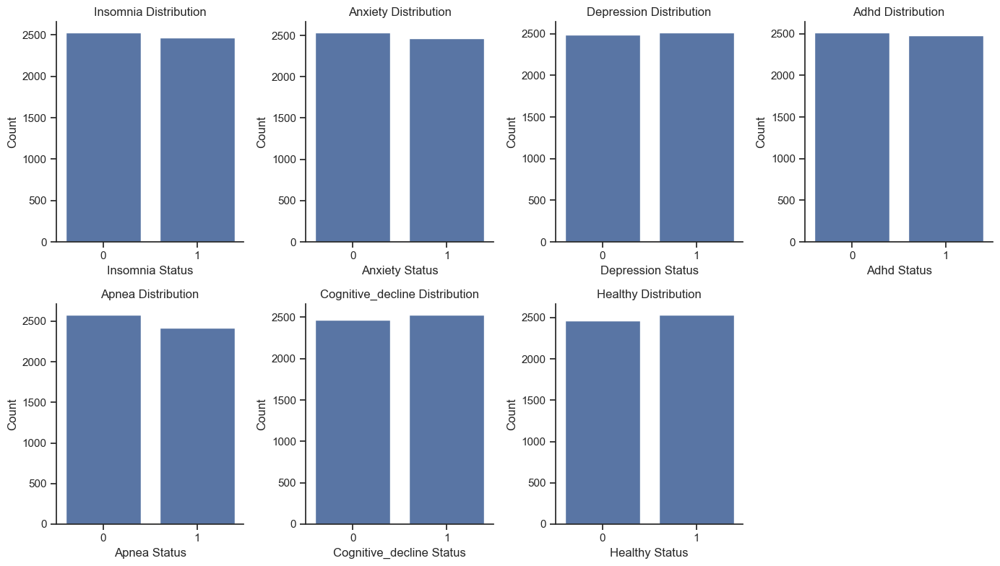

Training Random Forest models for all disorders...

Training Random Forest for INSOMNIA
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
76  feature_76     0.236506
72  feature_72     0.234673
13  feature_13     0.172146
8    feature_8     0.171449
26  feature_26     0.158720
89  feature_89    -0.157892
48  feature_48     0.157177
40  feature_40    -0.155943
30  feature_30    -0.155896
21  feature_21    -0.150252

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
72  feature_72    0.059640
76  feature_76    0.057782
13  feature_13    0.030786
8    feature_8    0.029554
48  feature_48    0.024890
30  feature_30    0.024676
40  feature_40    0.022822
90  feature_90    0.021473
89  feature_89    0.021277
26  feature_26    0.021058


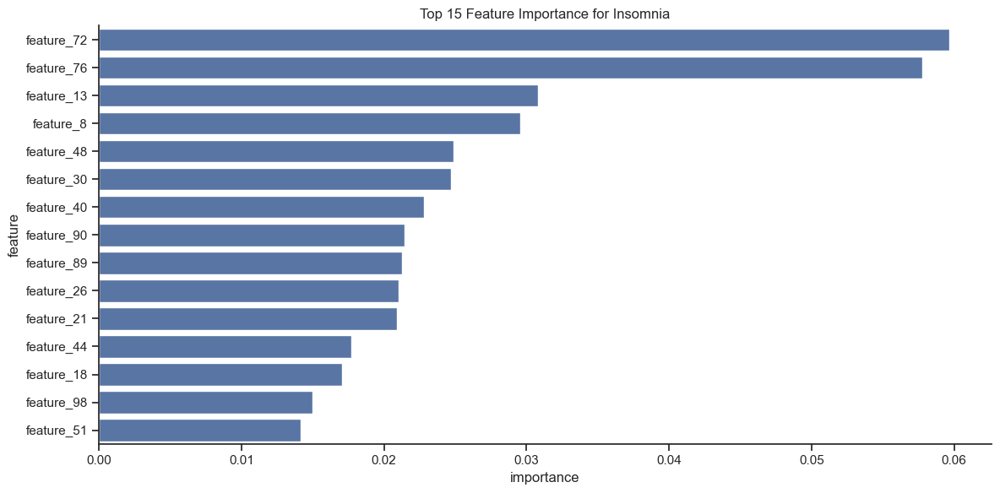


Training Random Forest for ANXIETY
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
0    feature_0    -0.240080
86  feature_86     0.199852
57  feature_57    -0.190053
16  feature_16     0.148453
61  feature_61    -0.146347
7    feature_7    -0.146234
19  feature_19     0.145711
91  feature_91     0.140360
95  feature_95    -0.136297
72  feature_72    -0.128683

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
0    feature_0    0.051636
86  feature_86    0.033511
57  feature_57    0.032967
7    feature_7    0.025745
91  feature_91    0.024922
16  feature_16    0.024481
61  feature_61    0.022125
19  feature_19    0.022101
75  feature_75    0.018993
72  feature_72    0.018513


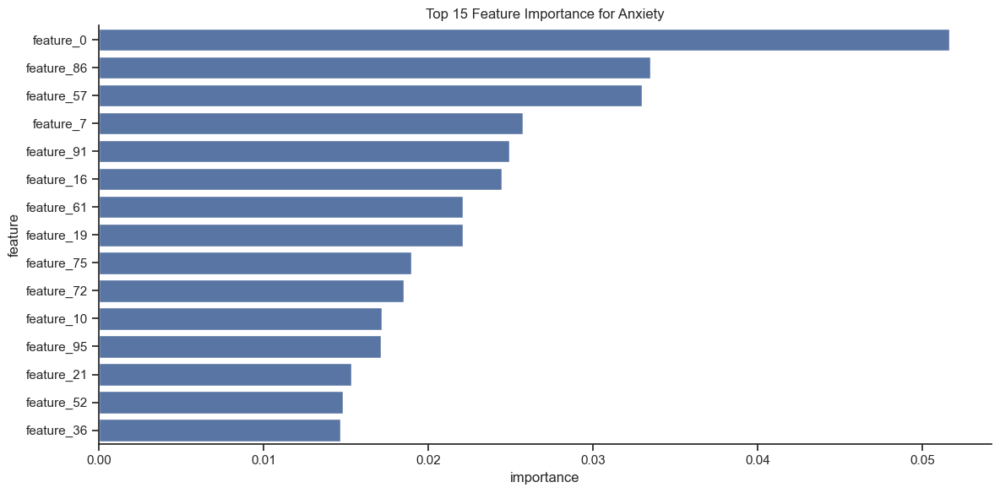


Training Random Forest for DEPRESSION
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
85  feature_85    -0.217273
35  feature_35     0.185969
96  feature_96    -0.183180
23  feature_23    -0.183098
99  feature_99     0.174684
20  feature_20    -0.171717
62  feature_62     0.158510
93  feature_93    -0.152090
98  feature_98     0.146667
2    feature_2    -0.137442

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
85  feature_85    0.046121
23  feature_23    0.033208
96  feature_96    0.031114
20  feature_20    0.029519
35  feature_35    0.029437
99  feature_99    0.027468
98  feature_98    0.024935
62  feature_62    0.023124
93  feature_93    0.022935
52  feature_52    0.018288


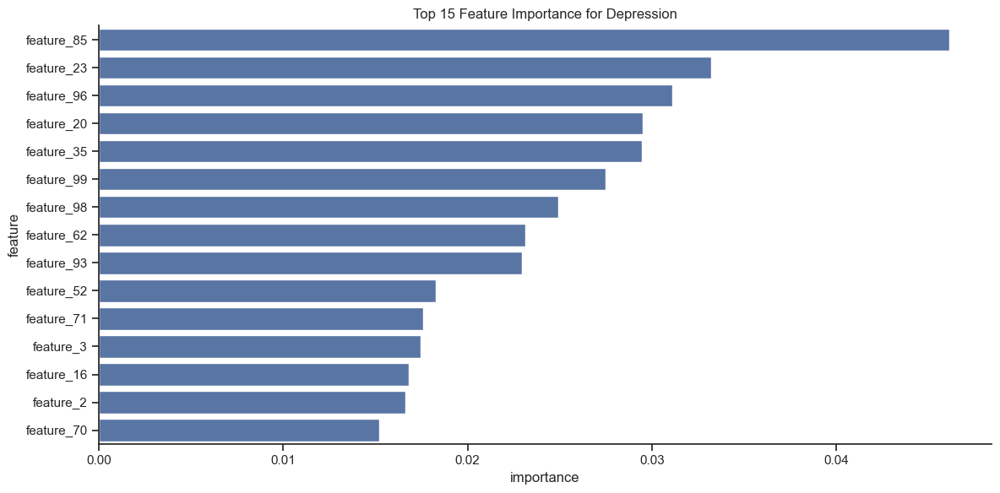


Training Random Forest for ADHD
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
88  feature_88     0.252501
80  feature_80    -0.199277
54  feature_54     0.185143
82  feature_82     0.160965
85  feature_85    -0.152720
96  feature_96     0.142001
68  feature_68     0.133624
83  feature_83     0.133386
74  feature_74    -0.132759
99  feature_99    -0.127209

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
88  feature_88    0.061261
54  feature_54    0.038429
80  feature_80    0.031464
82  feature_82    0.025701
68  feature_68    0.020888
85  feature_85    0.020848
83  feature_83    0.020653
99  feature_99    0.019662
73  feature_73    0.018187
65  feature_65    0.016938


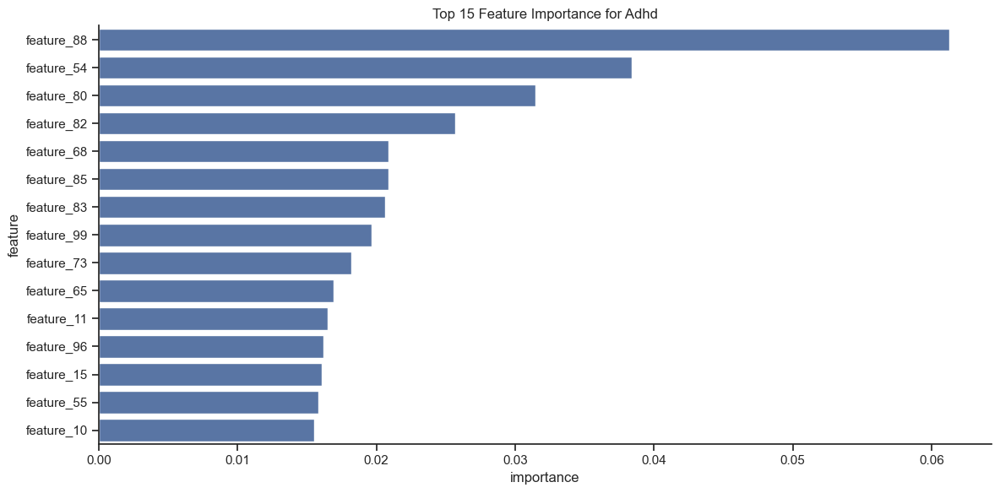


Training Random Forest for APNEA
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
58  feature_58     0.249229
37  feature_37     0.187925
70  feature_70     0.167095
23  feature_23     0.163135
82  feature_82     0.161072
47  feature_47     0.159685
26  feature_26    -0.143272
54  feature_54     0.142153
96  feature_96     0.139238
90  feature_90     0.137083

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
58  feature_58    0.054098
37  feature_37    0.039780
23  feature_23    0.029482
70  feature_70    0.026644
47  feature_47    0.025031
54  feature_54    0.024337
82  feature_82    0.022350
96  feature_96    0.021331
26  feature_26    0.019033
35  feature_35    0.018957


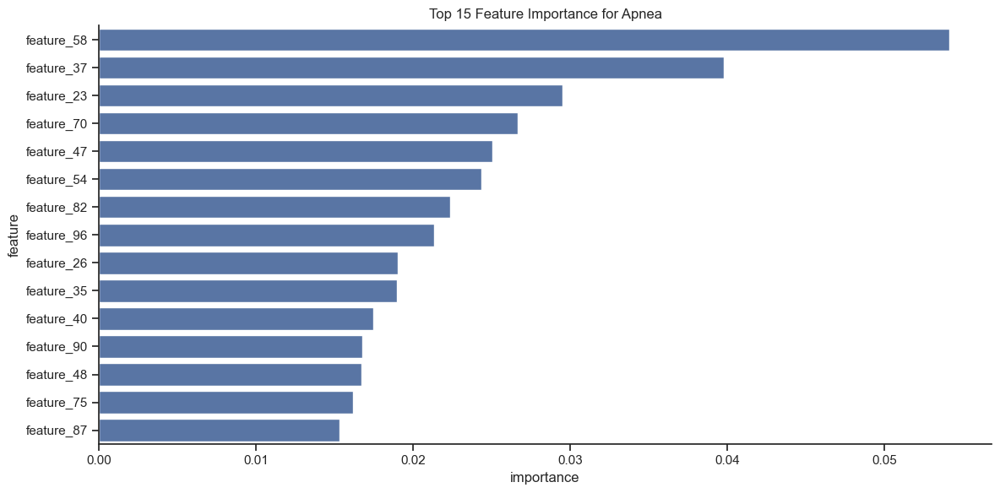


Training Random Forest for COGNITIVE_DECLINE
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
61  feature_61     0.206639
28  feature_28    -0.196332
3    feature_3     0.181477
62  feature_62    -0.177212
32  feature_32    -0.175644
0    feature_0    -0.163347
39  feature_39     0.159818
56  feature_56     0.155715
41  feature_41    -0.145036
2    feature_2    -0.139160

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
61  feature_61    0.047249
28  feature_28    0.037720
32  feature_32    0.031476
0    feature_0    0.031298
3    feature_3    0.028436
62  feature_62    0.028054
39  feature_39    0.026430
56  feature_56    0.024901
41  feature_41    0.019479
2    feature_2    0.019256


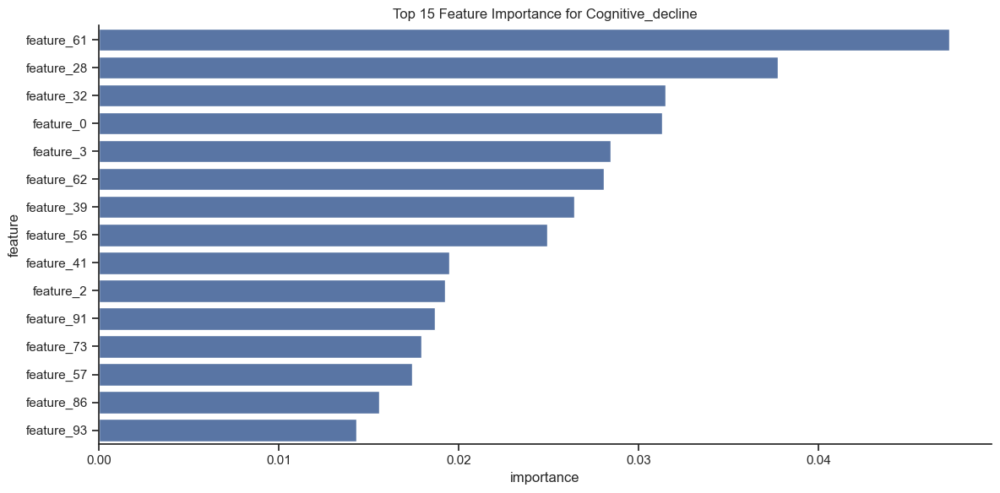


Training Random Forest for HEALTHY
Initial feature count: 100
Features after removing those with >30.0% missing values: 100
Features after removing low variance: 100

Top 10 features by correlation with target:
       feature  correlation
68  feature_68     0.233529
4    feature_4    -0.188890
82  feature_82     0.183365
45  feature_45    -0.180516
26  feature_26    -0.175953
7    feature_7     0.175114
94  feature_94     0.160903
78  feature_78     0.141609
81  feature_81    -0.140485
29  feature_29    -0.138166

Final dataset shape: X=(5000, 100), y=(5000,)

Train set: (4000, 100), Test set: (1000, 100)

Top 10 important features:
       feature  importance
68  feature_68    0.057876
4    feature_4    0.038842
45  feature_45    0.034778
82  feature_82    0.032352
26  feature_26    0.032265
7    feature_7    0.026628
94  feature_94    0.025389
78  feature_78    0.020629
29  feature_29    0.020376
83  feature_83    0.018553


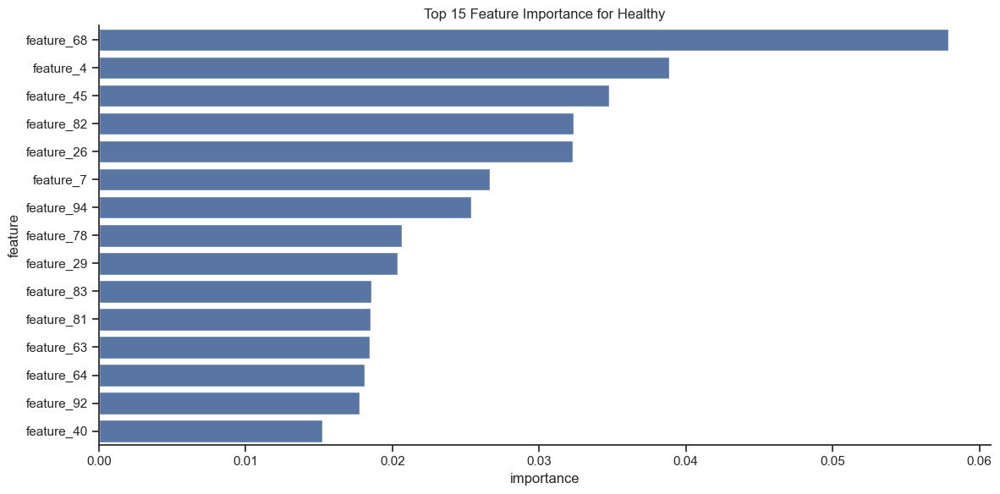

Total training time for all Random Forest models: 15.86 seconds

Saving all trained models...
Model for insomnia saved to saved_models\insomnia_rf_model.joblib
Model for anxiety saved to saved_models\anxiety_rf_model.joblib
Model for depression saved to saved_models\depression_rf_model.joblib
Model for adhd saved to saved_models\adhd_rf_model.joblib
Model for apnea saved to saved_models\apnea_rf_model.joblib
Model for cognitive_decline saved to saved_models\cognitive_decline_rf_model.joblib
Model for healthy saved to saved_models\healthy_rf_model.joblib
All models saved successfully!


In [17]:
import time
# Cell: Load and explore data
# In a real notebook you would load your dataset here
print("Dataset overview:")
print(f"Number of samples: {mock_data.shape[0]}")
print(f"Number of features: {mock_data.shape[1]}")
# Plot class distribution for each condition
plt.figure(figsize=(14, 8))
for i, condition in enumerate(conditions):
    plt.subplot(2, 4, i+1)
    condition_col = f"{condition}_proxy" if f"{condition}_proxy" in mock_data.columns else condition
    if condition_col in mock_data.columns:
        sns.countplot(x=mock_data[condition_col])
        plt.title(f"{condition.capitalize()} Distribution")
        plt.xlabel(f"{condition.capitalize()} Status")
        plt.ylabel("Count")
    else:
        plt.text(0.5, 0.5, f"No data for {condition}", horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.show()
# Cell: Train Random Forest for each disorder
print("Training Random Forest models for all disorders...")
start_time = time.time()
for condition in conditions:
    print(f"\n{'='*50}")
    print(f"Training Random Forest for {condition.upper()}")
    print(f"{'='*50}")
    
    # Use the binary proxy as target
    target = f"{condition}_proxy" if f"{condition}_proxy" in mock_data.columns else condition
    
    # Prepare data
    X, y, selected_features = prepare_model_data(mock_data, target)
    selected_features_dict[condition] = selected_features
    
    if X is not None and y is not None:
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        print(f"\nTrain set: {X_train.shape}, Test set: {X_test.shape}")
        
        # Train Random Forest model
        rf = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=10,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )
        
        rf.fit(X_train, y_train)
        
        # Save the model
        rf_models[condition] = rf
        
        # Predict on test set
        y_pred = rf.predict(X_test)
        y_prob = rf.predict_proba(X_test)[:, 1]
        
        # Store results
        rf_results[condition]['y_test'] = y_test
        rf_results[condition]['y_pred'] = y_pred
        rf_results[condition]['y_prob'] = y_prob
        rf_results[condition]['X_test'] = X_test
        
        # Print feature importance
        feature_importance = pd.DataFrame({
            'feature': X.columns,
            'importance': rf.feature_importances_
        }).sort_values('importance', ascending=False)
        
        print("\nTop 10 important features:")
        print(feature_importance.head(10))
        
        # Plot feature importance
        plt.figure(figsize=(12, 6))
        sns.barplot(x='importance', y='feature', data=feature_importance.head(15))
        plt.title(f'Top 15 Feature Importance for {condition.capitalize()}')
        plt.tight_layout()
        plt.show()
print(f"Total training time for all Random Forest models: {time.time() - start_time:.2f} seconds")

# Cell: Save all trained models
print("\nSaving all trained models...")
import os
import joblib

# Create directory for models if it doesn't exist
model_dir = "saved_models"
os.makedirs(model_dir, exist_ok=True)

# Save each model
for condition, model in rf_models.items():
    model_path = os.path.join(model_dir, f"{condition}_rf_model.joblib")
    joblib.dump(model, model_path)
    print(f"Model for {condition} saved to {model_path}")

print("All models saved successfully!")


Training CNN-LSTM models for all disorders...

Training CNN-LSTM for INSOMNIA
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.6076 - auc: 0.6584 - loss: 0.6721 - precision: 0.6240 - recall: 0.4840 - val_accuracy: 0.8500 - val_auc: 0.9490 - val_loss: 0.3351 - val_precision: 0.8058 - val_recall: 0.9162
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8876 - auc: 0.9574 - loss: 0.2720 - precision: 0.8668 - recall: 0.9136 - val_accuracy: 0.9150 - val_auc: 0.9809 - val_loss: 0.1910 - val_precision: 0.9503 - val_recall: 0.8731
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9319 - auc: 0.9833 - loss: 0.1671 - precision: 0.9373 - recall: 0.9212 - val_accuracy: 0.9325 - val_auc: 0.9843 - val_loss: 0.1679 - val_precision: 0.9497 - val_recall: 0.9112
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9413 - auc: 0.9880 - loss: 0.1424 - precision: 0.9443 - recall: 0.9399 - val_accuracy: 0.9413 - val_auc: 0.9884 - val_loss: 0.1468 - val_precision: 0.9554 - val_recall: 0.9239
Epoch 5/10
100/100 ━━━━━

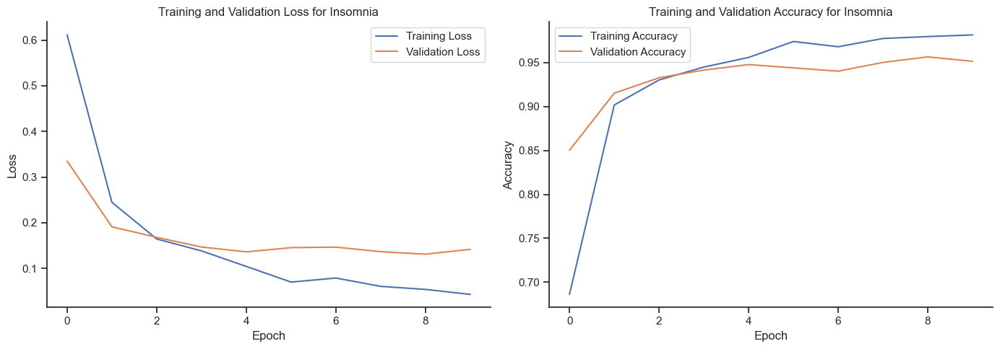


Training CNN-LSTM for ANXIETY
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.6319 - auc_1: 0.6762 - loss: 0.6683 - precision_1: 0.6301 - recall_1: 0.6170 - val_accuracy: 0.8600 - val_auc_1: 0.9384 - val_loss: 0.3413 - val_precision_1: 0.8715 - val_recall_1: 0.8254
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8817 - auc_1: 0.9529 - loss: 0.2851 - precision_1: 0.8848 - recall_1: 0.8757 - val_accuracy: 0.9388 - val_auc_1: 0.9819 - val_loss: 0.1735 - val_precision_1: 0.9532 - val_recall_1: 0.9153
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9319 - auc_1: 0.9831 - loss: 0.1680 - precision_1: 0.9348 - recall_1: 0.9294 - val_accuracy: 0.9450 - val_auc_1: 0.9867 - val_loss: 0.1463 - val_precision_1: 0.9326 - val_recall_1: 0.9524
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9496 - auc_1: 0.9921 - loss: 0.1176 - precision_1: 0.9495 - recall_1: 0.9491 - val_accuracy: 0.9488 - val_auc_1: 0.9882 - val_loss: 0.1383 - val_precision_1: 0.942

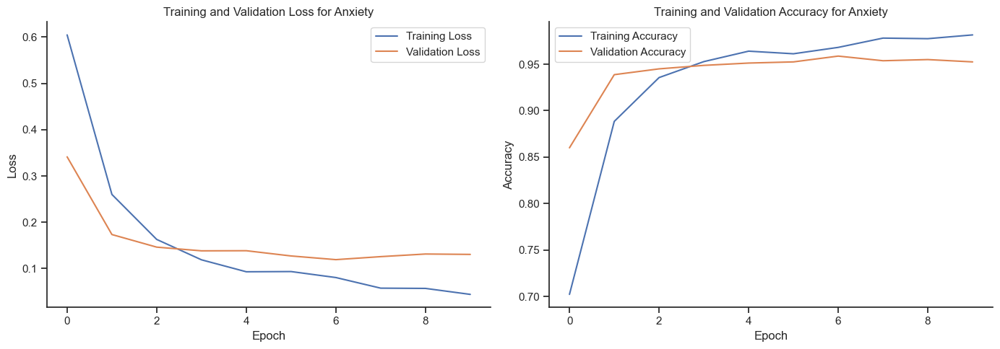


Training CNN-LSTM for DEPRESSION
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6040 - auc_2: 0.6489 - loss: 0.6754 - precision_2: 0.5980 - recall_2: 0.6954 - val_accuracy: 0.8687 - val_auc_2: 0.9466 - val_loss: 0.3487 - val_precision_2: 0.8866 - val_recall_2: 0.8494
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8674 - auc_2: 0.9514 - loss: 0.2882 - precision_2: 0.8701 - recall_2: 0.8611 - val_accuracy: 0.9100 - val_auc_2: 0.9808 - val_loss: 0.2054 - val_precision_2: 0.8692 - val_recall_2: 0.9679
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9276 - auc_2: 0.9821 - loss: 0.1775 - precision_2: 0.9228 - recall_2: 0.9354 - val_accuracy: 0.9337 - val_auc_2: 0.9866 - val_loss: 0.1584 - val_precision_2: 0.9112 - val_recall_2: 0.9630
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9441 - auc_2: 0.9914 - loss: 0.1222 - precision_2: 0.9423 - recall_2: 0.9474 - val_accuracy: 0.9312 - val_auc_2: 0.9880 - val_loss: 0.1451 - val_precision_2: 0.9353

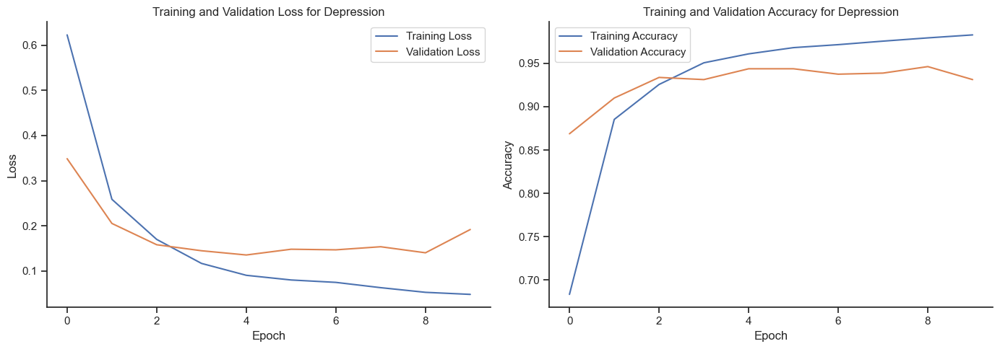


Training CNN-LSTM for ADHD
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5999 - auc_3: 0.6409 - loss: 0.6740 - precision_3: 0.6039 - recall_3: 0.5289 - val_accuracy: 0.8537 - val_auc_3: 0.9368 - val_loss: 0.3561 - val_precision_3: 0.9373 - val_recall_3: 0.7551
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8783 - auc_3: 0.9499 - loss: 0.2919 - precision_3: 0.8905 - recall_3: 0.8628 - val_accuracy: 0.9300 - val_auc_3: 0.9853 - val_loss: 0.1695 - val_precision_3: 0.9570 - val_recall_3: 0.8990
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9265 - auc_3: 0.9838 - loss: 0.1676 - precision_3: 0.9198 - recall_3: 0.9338 - val_accuracy: 0.9425 - val_auc_3: 0.9887 - val_loss: 0.1432 - val_precision_3: 0.9268 - val_recall_3: 0.9596
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9572 - auc_3: 0.9915 - loss: 0.1195 - precision_3: 0.9553 - recall_3: 0.9579 - val_accuracy: 0.9450 - val_auc_3: 0.9896 - val_loss: 0.1558 - val_precision_3: 0.983

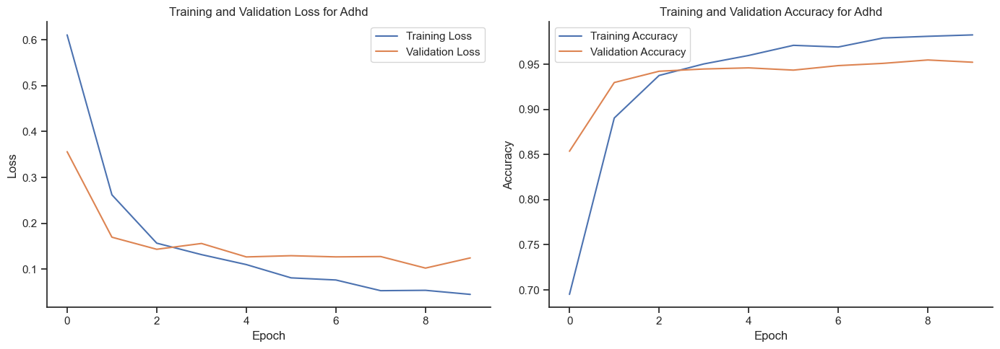


Training CNN-LSTM for APNEA
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_8 (LSTM)                   │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - accuracy: 0.6162 - auc_4: 0.6612 - loss: 0.6709 - precision_4: 0.6575 - recall_4: 0.4107 - val_accuracy: 0.8763 - val_auc_4: 0.9514 - val_loss: 0.3226 - val_precision_4: 0.8909 - val_recall_4: 0.8575
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8704 - auc_4: 0.9490 - loss: 0.2944 - precision_4: 0.8609 - recall_4: 0.8680 - val_accuracy: 0.9300 - val_auc_4: 0.9847 - val_loss: 0.1724 - val_precision_4: 0.9236 - val_recall_4: 0.9375
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9323 - auc_4: 0.9820 - loss: 0.1750 - precision_4: 0.9344 - recall_4: 0.9280 - val_accuracy: 0.9312 - val_auc_4: 0.9881 - val_loss: 0.1464 - val_precision_4: 0.9457 - val_recall_4: 0.9150
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9536 - auc_4: 0.9913 - loss: 0.1228 - precision_4: 0.9533 - recall_4: 0.9491 - val_accuracy: 0.9425 - val_auc_4: 0.9909 - val_loss: 0.1233 - val_precision_4: 0.947

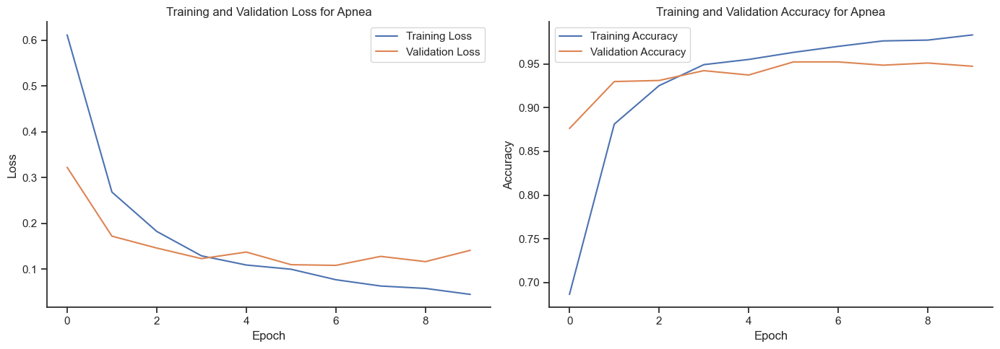


Training CNN-LSTM for COGNITIVE_DECLINE
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_5 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_10 (LSTM)                  │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6008 - auc_5: 0.6387 - loss: 0.6759 - precision_5: 0.5921 - recall_5: 0.7196 - val_accuracy: 0.8475 - val_auc_5: 0.9384 - val_loss: 0.3658 - val_precision_5: 0.8906 - val_recall_5: 0.8159
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8838 - auc_5: 0.9526 - loss: 0.2896 - precision_5: 0.8874 - recall_5: 0.8816 - val_accuracy: 0.9225 - val_auc_5: 0.9791 - val_loss: 0.1891 - val_precision_5: 0.9297 - val_recall_5: 0.9254
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9290 - auc_5: 0.9826 - loss: 0.1713 - precision_5: 0.9321 - recall_5: 0.9279 - val_accuracy: 0.9300 - val_auc_5: 0.9836 - val_loss: 0.1666 - val_precision_5: 0.9307 - val_recall_5: 0.9394
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9461 - auc_5: 0.9888 - loss: 0.1344 - precision_5: 0.9502 - recall_5: 0.9407 - val_accuracy: 0.9225 - val_auc_5: 0.9836 - val_loss: 0.1736 - val_precision_5: 0.940

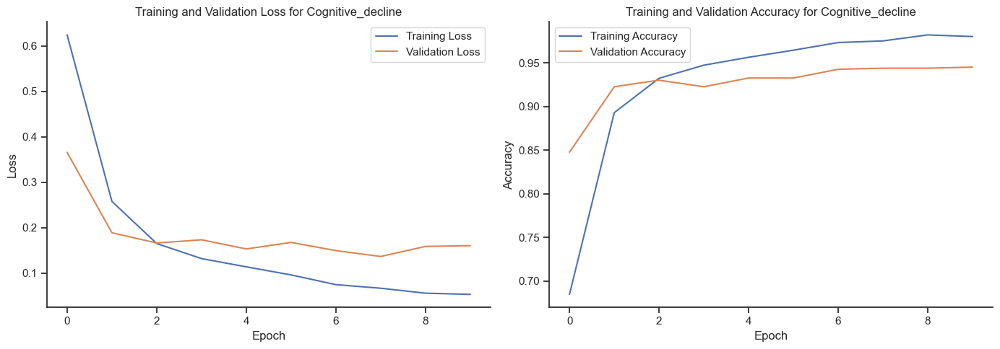


Training CNN-LSTM for HEALTHY
Using sequence length: 10
CNN-LSTM input shapes - Train: (4000, 1, 100), Test: (1000, 1, 100)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)               │ (None, 1, 64)          │         6,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_12 (LSTM)                  │ (None, 1, 50)          │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 1, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_13 (LSTM)                  │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,715 (194.20 KB)

 Trainable params: 49,715 (194.20 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.5854 - auc_6: 0.6213 - loss: 0.6803 - precision_6: 0.5686 - recall_6: 0.7638 - val_accuracy: 0.8662 - val_auc_6: 0.9386 - val_loss: 0.3923 - val_precision_6: 0.8738 - val_recall_6: 0.8675
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8613 - auc_6: 0.9313 - loss: 0.3414 - precision_6: 0.8531 - recall_6: 0.8783 - val_accuracy: 0.9262 - val_auc_6: 0.9847 - val_loss: 0.1791 - val_precision_6: 0.9541 - val_recall_6: 0.9012
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9331 - auc_6: 0.9819 - loss: 0.1745 - precision_6: 0.9388 - recall_6: 0.9297 - val_accuracy: 0.9388 - val_auc_6: 0.9898 - val_loss: 0.1485 - val_precision_6: 0.9692 - val_recall_6: 0.9108
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9479 - auc_6: 0.9889 - loss: 0.1346 - precision_6: 0.9534 - recall_6: 0.9448 - val_accuracy: 0.9400 - val_auc_6: 0.9907 - val_loss: 0.1233 - val_precision_6: 0.946

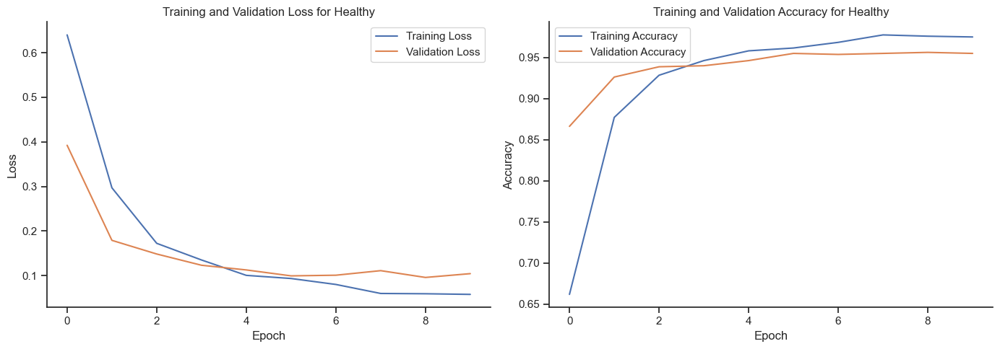

Total training time for all CNN-LSTM models: 162.76 seconds

Saving all trained models...
CNN-LSTM model for insomnia saved to saved_models\insomnia_cnn_lstm_model.joblib
CNN-LSTM model for anxiety saved to saved_models\anxiety_cnn_lstm_model.joblib
CNN-LSTM model for depression saved to saved_models\depression_cnn_lstm_model.joblib
CNN-LSTM model for adhd saved to saved_models\adhd_cnn_lstm_model.joblib
CNN-LSTM model for apnea saved to saved_models\apnea_cnn_lstm_model.joblib
CNN-LSTM model for cognitive_decline saved to saved_models\cognitive_decline_cnn_lstm_model.joblib
CNN-LSTM model for healthy saved to saved_models\healthy_cnn_lstm_model.joblib
All models saved successfully!


In [18]:
# Cell: Create CNN-LSTM for all disorders
print("\nTraining CNN-LSTM models for all disorders...")
start_time = time.time()

for condition in conditions:
    print(f"\n{'='*50}")
    print(f"Training CNN-LSTM for {condition.upper()}")
    print(f"{'='*50}")
    
    # Use the binary proxy as target
    target = f"{condition}_proxy" if f"{condition}_proxy" in mock_data.columns else condition
    
    # Get the data we already prepared for the RF model
    if condition in selected_features_dict:
        selected_features = selected_features_dict[condition]
        X = mock_data[selected_features].copy()
        y = mock_data[target].copy()
        
        # Remove rows where target is missing
        non_missing_mask = ~y.isnull()
        X = X[non_missing_mask]
        y = y[non_missing_mask]
        
        # Impute missing values in features
        imputer = SimpleImputer(strategy='mean')
        X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns, index=X.index)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)
        
        # Convert to numpy arrays
        X_train_np = X_train.values
        X_test_np = X_test.values
        y_train_np = y_train.values
        y_test_np = y_test.values
        
        # Create sequences for CNN-LSTM
        sequence_length = min(10, X_train_np.shape[0], X_test_np.shape[0])  # Adjust based on your data
        print(f"Using sequence length: {sequence_length}")
        
        # Reshape data for CNN-LSTM (samples, time steps, features)
        # For this example, we'll treat each sample as a sequence of its features
        X_train_reshaped = X_train_np.reshape(X_train_np.shape[0], 1, X_train_np.shape[1])
        X_test_reshaped = X_test_np.reshape(X_test_np.shape[0], 1, X_test_np.shape[1])
        
        # Print shapes
        print(f"CNN-LSTM input shapes - Train: {X_train_reshaped.shape}, Test: {X_test_reshaped.shape}")
        
        # Build CNN-LSTM model
        model = Sequential([
            # CNN layers
            Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(1, X_train_np.shape[1])),
            MaxPooling1D(pool_size=1),
            Dropout(0.2),
            
            # LSTM layers
            LSTM(50, return_sequences=True),
            Dropout(0.2),
            LSTM(50),
            Dropout(0.2),
            
            # Output layer
            Dense(1, activation='sigmoid')
        ])
        
        # Compile model
        model.compile(
            optimizer='adam',
            loss='binary_crossentropy',
            metrics=['accuracy', tf.keras.metrics.AUC(), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
        )
        
        # Model summary
        print(model.summary())
        
        # Early stopping
        early_stopping = EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )
        
        # Train model
        history = model.fit(
            X_train_reshaped, y_train_np,
            validation_split=0.2,
            epochs=10,
            batch_size=32,
            callbacks=[early_stopping],
            verbose=1
        )
        
        # Save model
        cnn_lstm_models[condition] = model
        
        # Predictions
        y_prob = model.predict(X_test_reshaped).flatten()
        y_pred = (y_prob > 0.5).astype(int)
        
        # Store results
        cnn_lstm_results[condition]['y_test'] = y_test_np
        cnn_lstm_results[condition]['y_pred'] = y_pred
        cnn_lstm_results[condition]['y_prob'] = y_prob
        
        # Plot training history
        plt.figure(figsize=(14, 5))
        
        plt.subplot(1, 2, 1)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Training and Validation Loss for {condition.capitalize()}')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        
        plt.subplot(1, 2, 2)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title(f'Training and Validation Accuracy for {condition.capitalize()}')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

print(f"Total training time for all CNN-LSTM models: {time.time() - start_time:.2f} seconds")

# Cell: Save all trained models
print("\nSaving all trained models...")
import os
import joblib

# Create directory for models if it doesn't exist
model_dir = "saved_models"
os.makedirs(model_dir, exist_ok=True)


# Save each CNN-LSTM model
for condition, model in cnn_lstm_models.items():
    model_path = os.path.join(model_dir, f"{condition}_cnn_lstm_model.joblib")
    joblib.dump(model, model_path)
    print(f"CNN-LSTM model for {condition} saved to {model_path}")

print("All models saved successfully!")



Evaluating Random Forest models...

Evaluating Random Forest for INSOMNIA

Random Forest metrics for INSOMNIA:
Accuracy: 0.7870
Precision: 0.7791
Recall (Sensitivity): 0.7840
Specificity: 0.7899
F1 Score: 0.7815
AUC: 0.8753
Avg Precision (PR AUC): 0.8692

Clinical metrics:
Negative Predictive Value (NPV): 0.7945
Positive Likelihood Ratio: 3.7310
Negative Likelihood Ratio: 0.2735
Diagnostic Odds Ratio: 13.6407

Confusion Matrix:
[[406 108]
 [105 381]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.79      0.79       514
           1       0.78      0.78      0.78       486

    accuracy                           0.79      1000
   macro avg       0.79      0.79      0.79      1000
weighted avg       0.79      0.79      0.79      1000



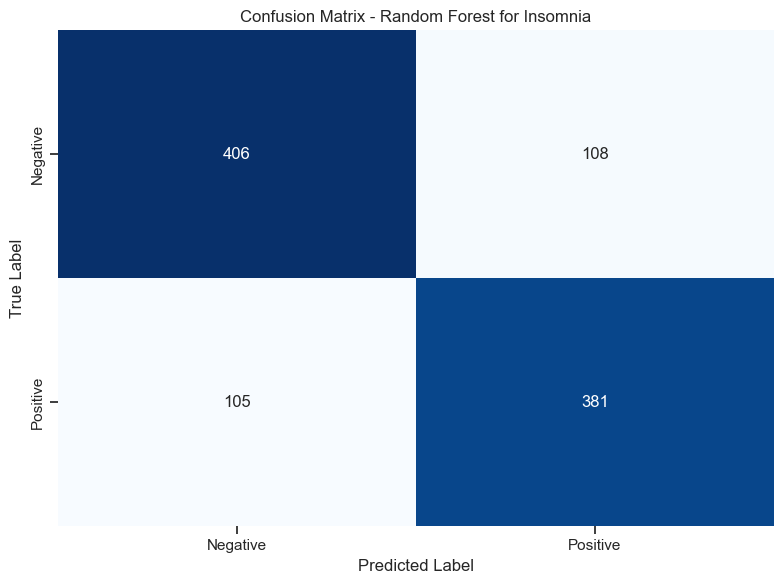

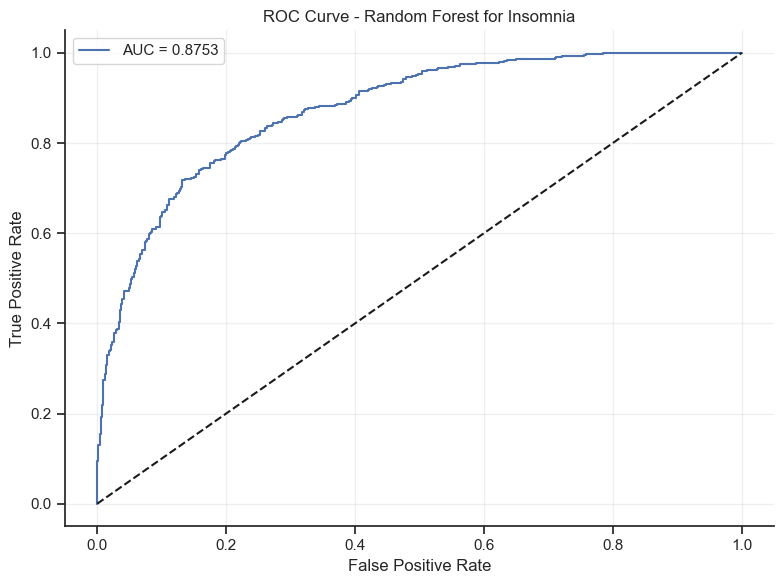

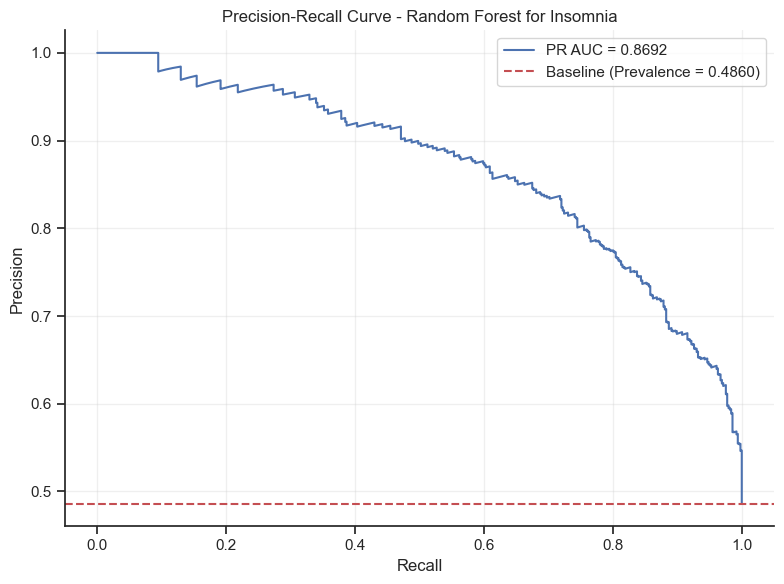

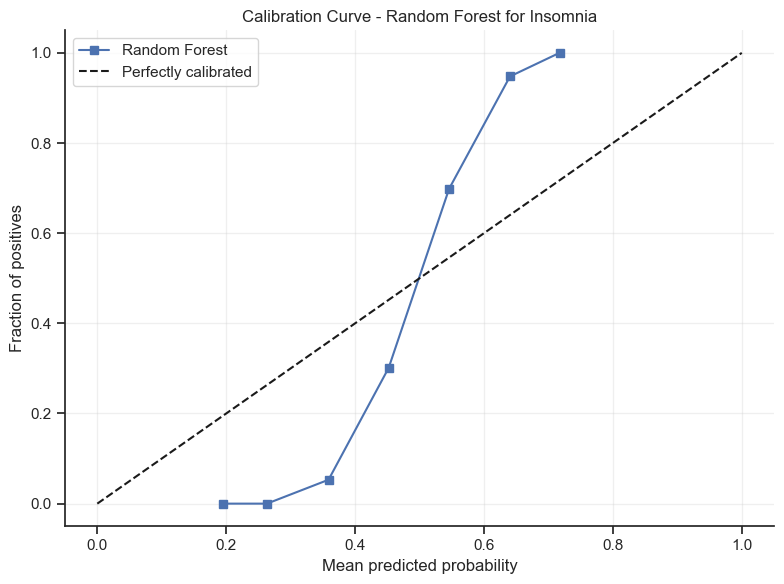

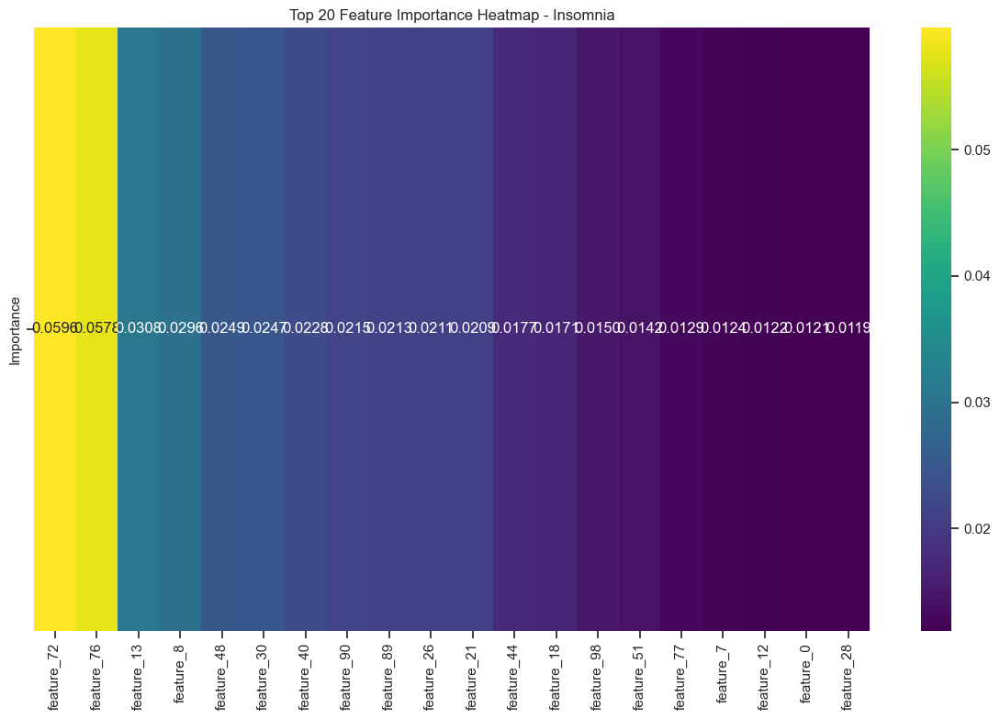


Evaluating Random Forest for ANXIETY

Random Forest metrics for ANXIETY:
Accuracy: 0.7940
Precision: 0.8140
Recall (Sensitivity): 0.7546
Specificity: 0.8323
F1 Score: 0.7832
AUC: 0.8901
Avg Precision (PR AUC): 0.8926

Clinical metrics:
Negative Predictive Value (NPV): 0.7772
Positive Likelihood Ratio: 4.5008
Negative Likelihood Ratio: 0.2949
Diagnostic Odds Ratio: 15.2634

Confusion Matrix:
[[422  85]
 [121 372]]

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.83      0.80       507
           1       0.81      0.75      0.78       493

    accuracy                           0.79      1000
   macro avg       0.80      0.79      0.79      1000
weighted avg       0.80      0.79      0.79      1000



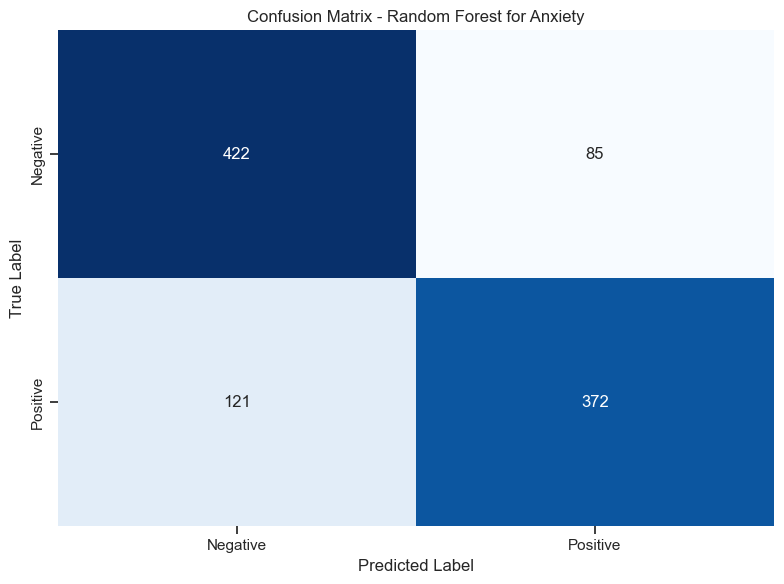

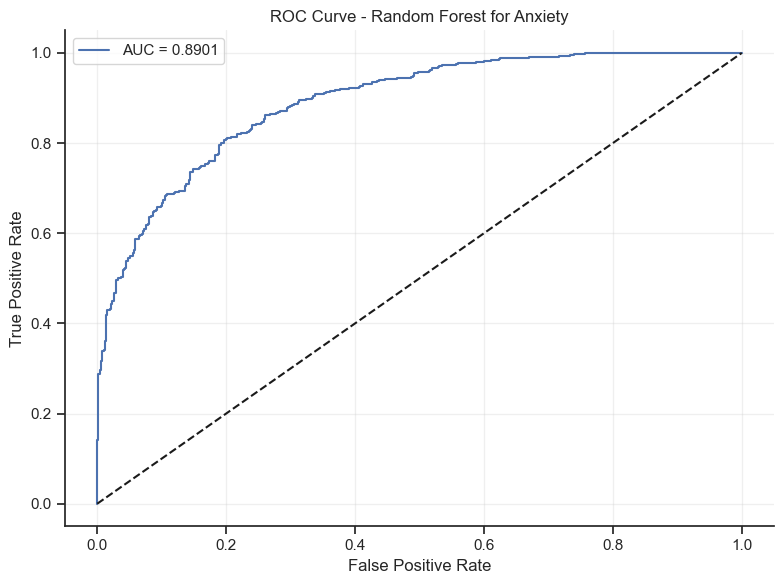

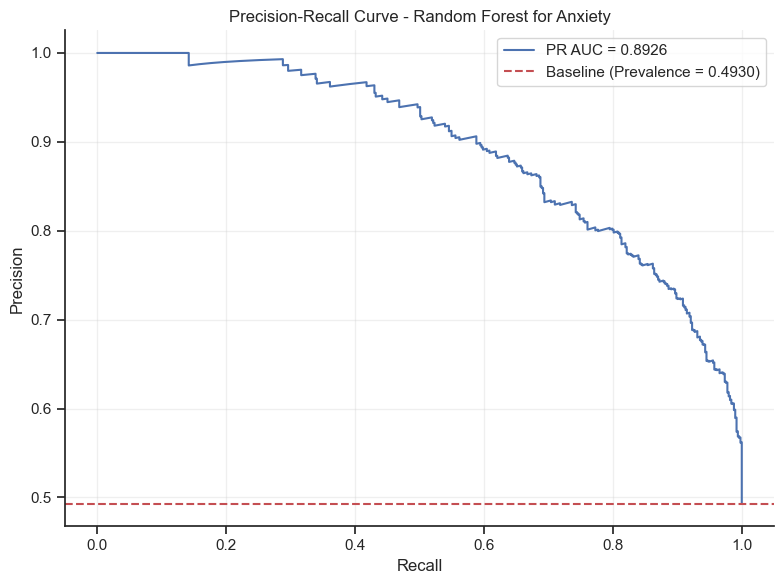

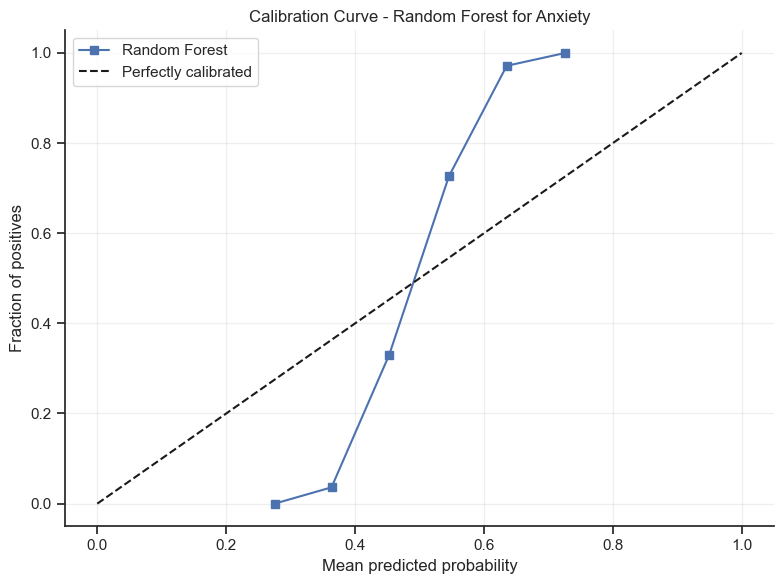

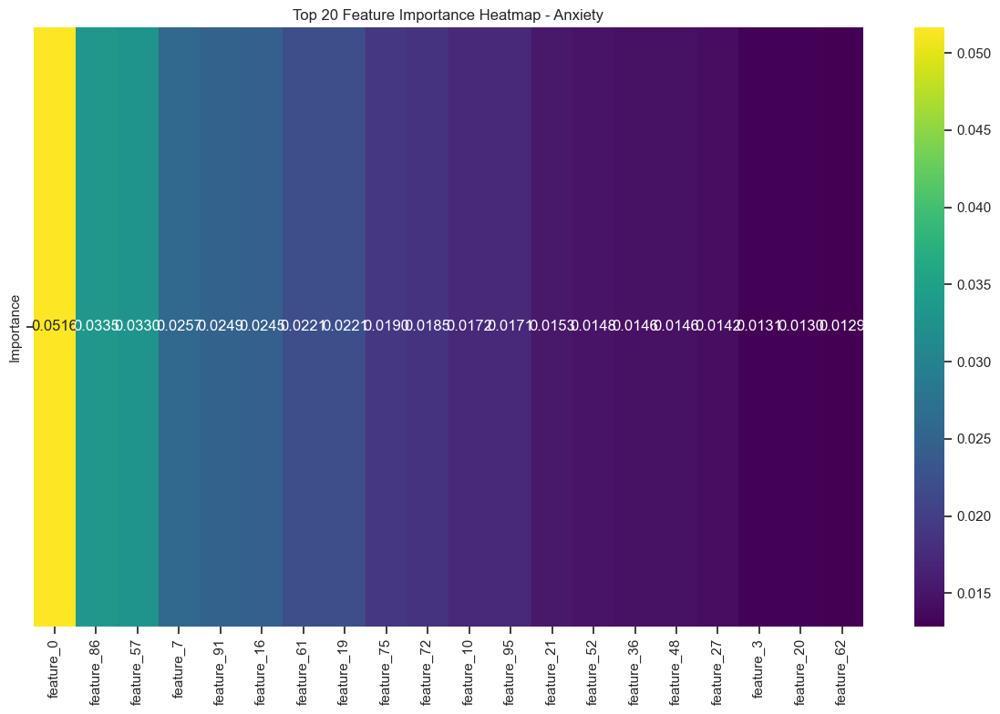


Evaluating Random Forest for DEPRESSION

Random Forest metrics for DEPRESSION:
Accuracy: 0.8020
Precision: 0.7854
Recall (Sensitivity): 0.8083
Specificity: 0.7962
F1 Score: 0.7967
AUC: 0.8880
Avg Precision (PR AUC): 0.8838

Clinical metrics:
Negative Predictive Value (NPV): 0.8182
Positive Likelihood Ratio: 3.9654
Negative Likelihood Ratio: 0.2407
Diagnostic Odds Ratio: 16.4717

Confusion Matrix:
[[414 106]
 [ 92 388]]

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.80      0.81       520
           1       0.79      0.81      0.80       480

    accuracy                           0.80      1000
   macro avg       0.80      0.80      0.80      1000
weighted avg       0.80      0.80      0.80      1000



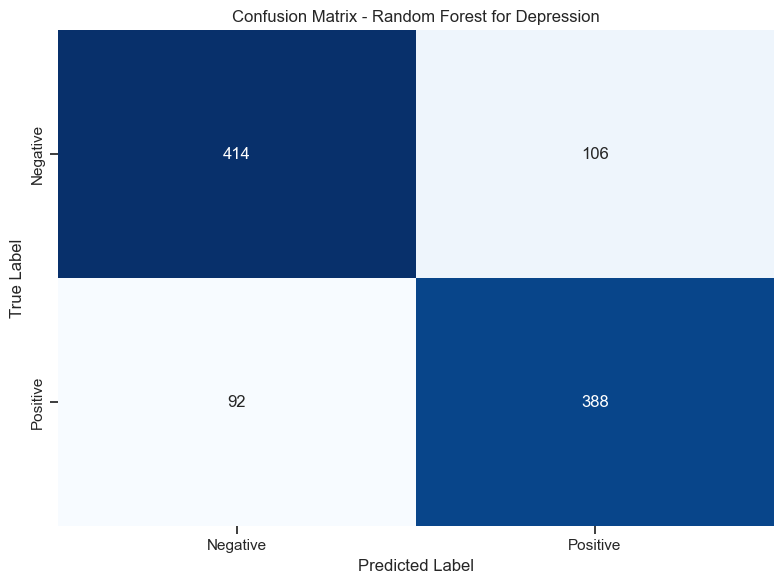

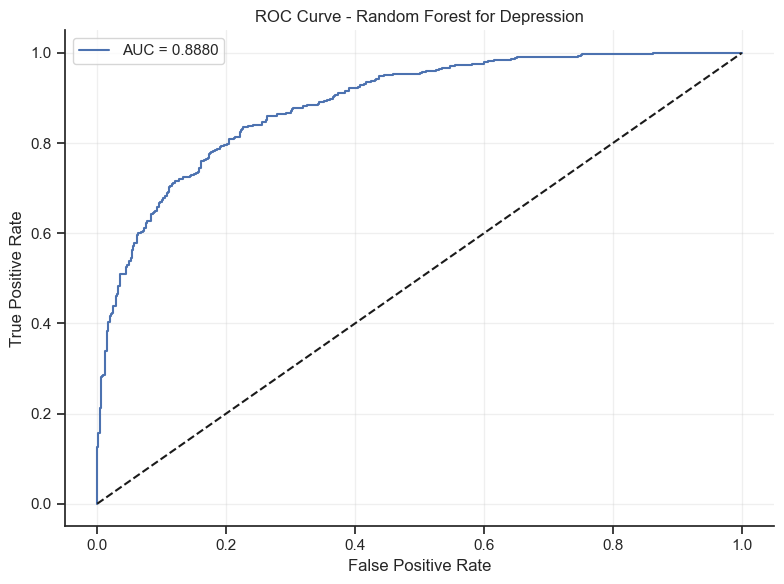

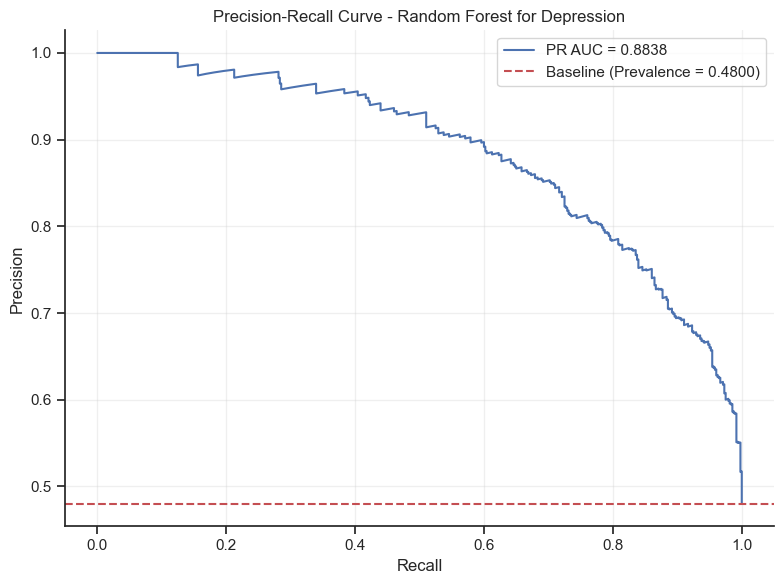

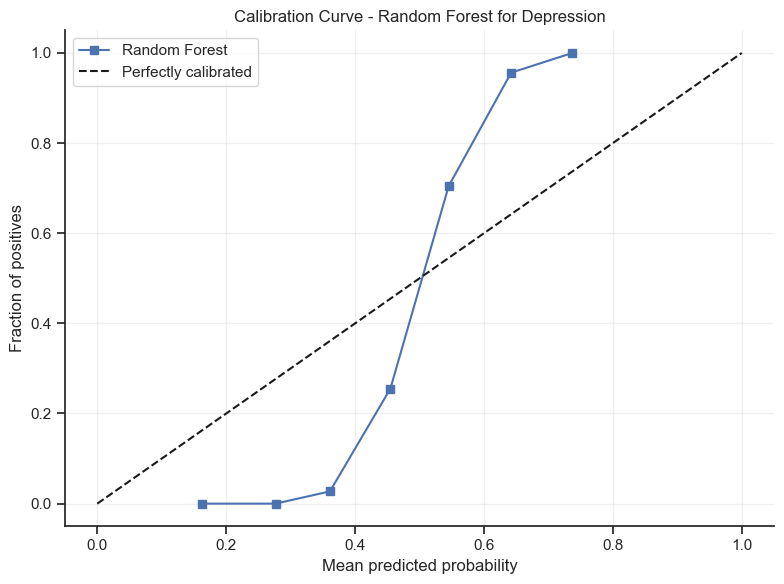

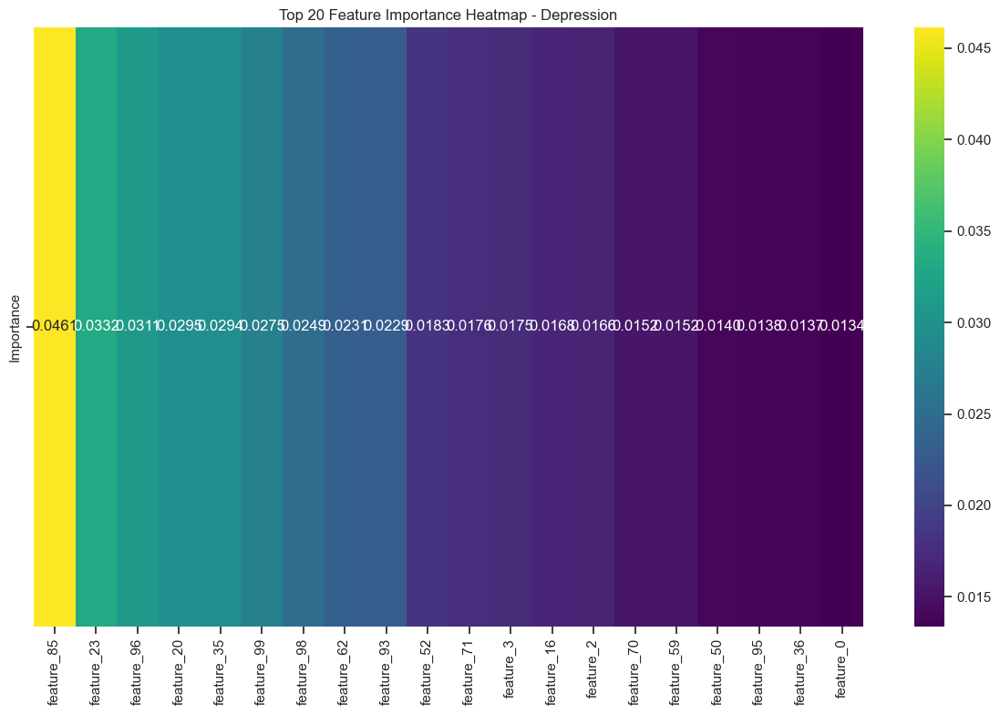


Evaluating Random Forest for ADHD

Random Forest metrics for ADHD:
Accuracy: 0.7790
Precision: 0.8197
Recall (Sensitivity): 0.7360
Specificity: 0.8254
F1 Score: 0.7756
AUC: 0.8800
Avg Precision (PR AUC): 0.8897

Clinical metrics:
Negative Predictive Value (NPV): 0.7434
Positive Likelihood Ratio: 4.2147
Negative Likelihood Ratio: 0.3198
Diagnostic Odds Ratio: 13.1781

Confusion Matrix:
[[397  84]
 [137 382]]

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.83      0.78       481
           1       0.82      0.74      0.78       519

    accuracy                           0.78      1000
   macro avg       0.78      0.78      0.78      1000
weighted avg       0.78      0.78      0.78      1000



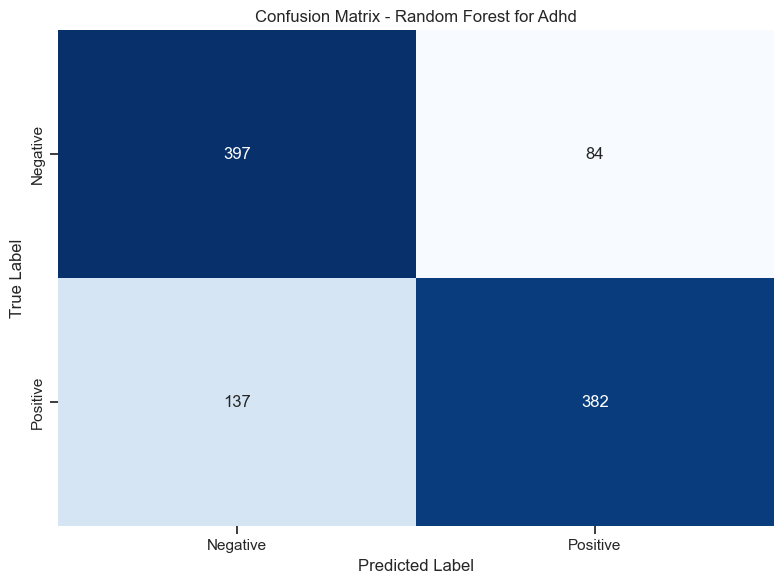

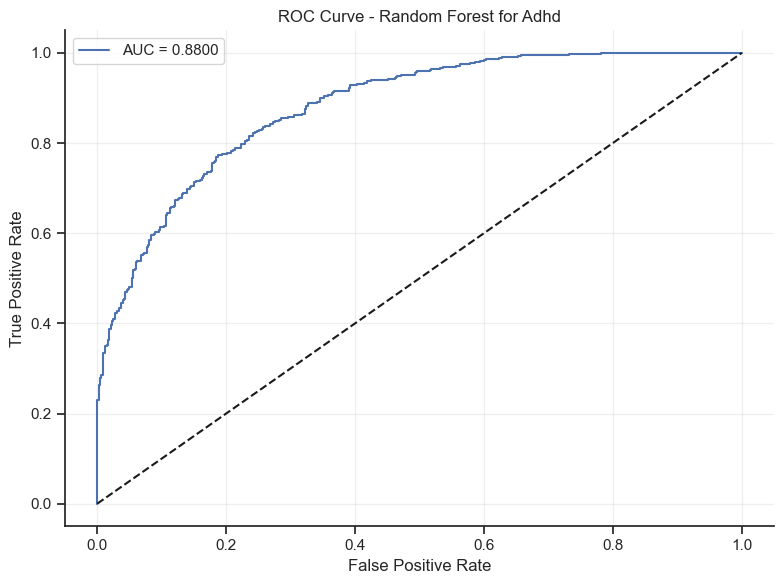

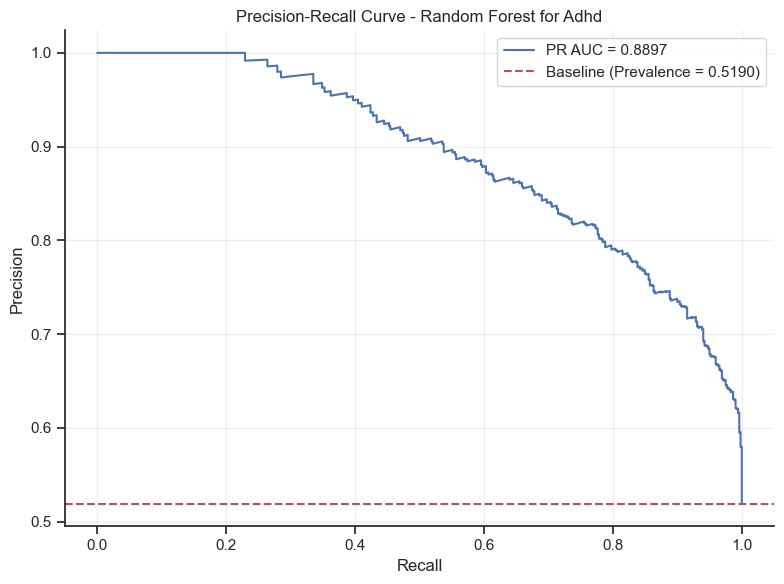

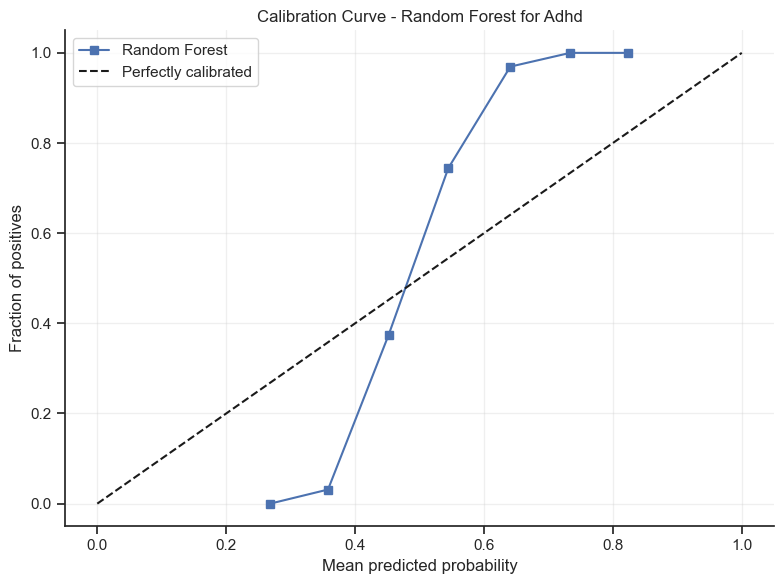

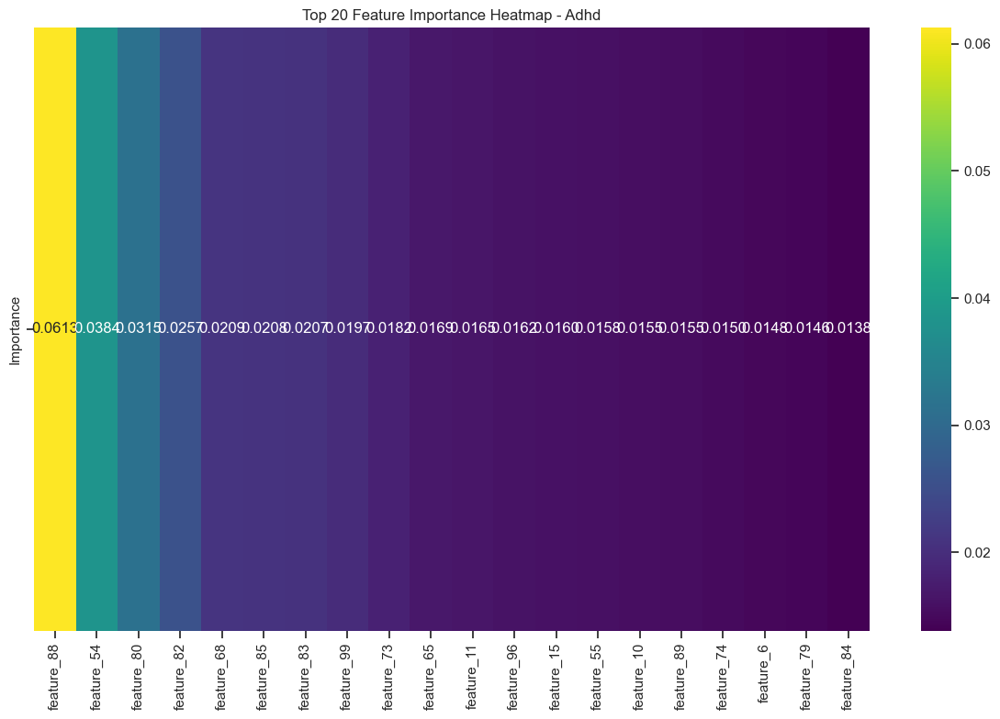


Evaluating Random Forest for APNEA

Random Forest metrics for APNEA:
Accuracy: 0.8060
Precision: 0.8368
Recall (Sensitivity): 0.7474
Specificity: 0.8616
F1 Score: 0.7896
AUC: 0.9009
Avg Precision (PR AUC): 0.8989

Clinical metrics:
Negative Predictive Value (NPV): 0.7823
Positive Likelihood Ratio: 5.4005
Negative Likelihood Ratio: 0.2931
Diagnostic Odds Ratio: 18.4230

Confusion Matrix:
[[442  71]
 [123 364]]

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.86      0.82       513
           1       0.84      0.75      0.79       487

    accuracy                           0.81      1000
   macro avg       0.81      0.80      0.80      1000
weighted avg       0.81      0.81      0.81      1000



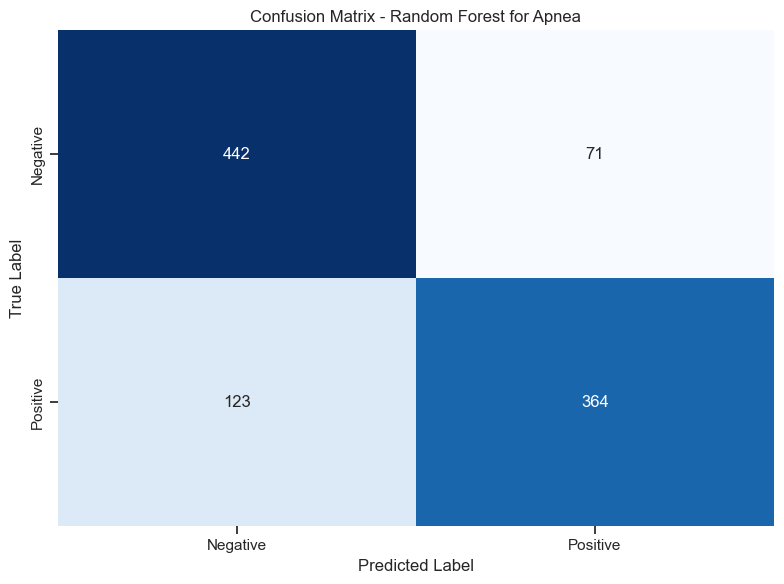

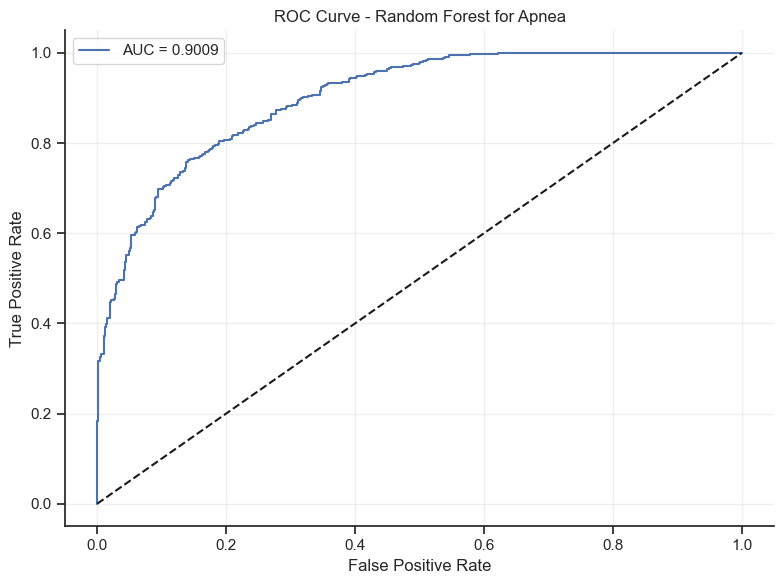

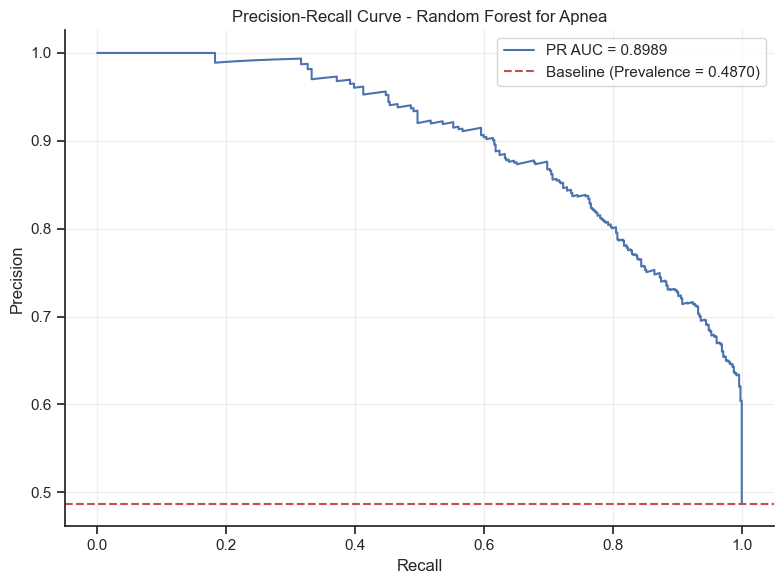

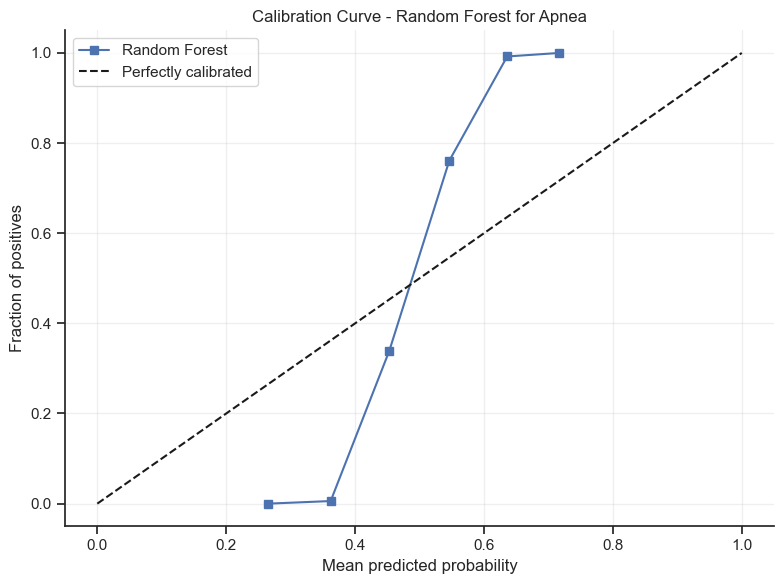

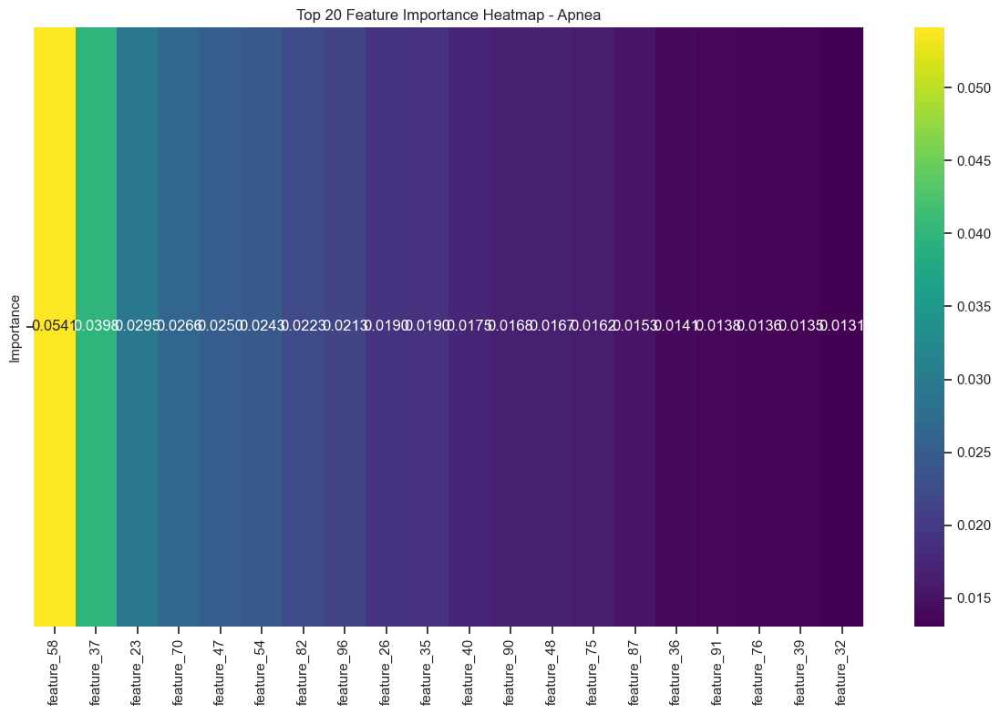


Evaluating Random Forest for COGNITIVE_DECLINE

Random Forest metrics for COGNITIVE_DECLINE:
Accuracy: 0.8130
Precision: 0.8298
Recall (Sensitivity): 0.8158
Specificity: 0.8098
F1 Score: 0.8227
AUC: 0.8884
Avg Precision (PR AUC): 0.9029

Clinical metrics:
Negative Predictive Value (NPV): 0.7945
Positive Likelihood Ratio: 4.2898
Negative Likelihood Ratio: 0.2275
Diagnostic Odds Ratio: 18.8587

Confusion Matrix:
[[379  89]
 [ 98 434]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.81      0.80       468
           1       0.83      0.82      0.82       532

    accuracy                           0.81      1000
   macro avg       0.81      0.81      0.81      1000
weighted avg       0.81      0.81      0.81      1000



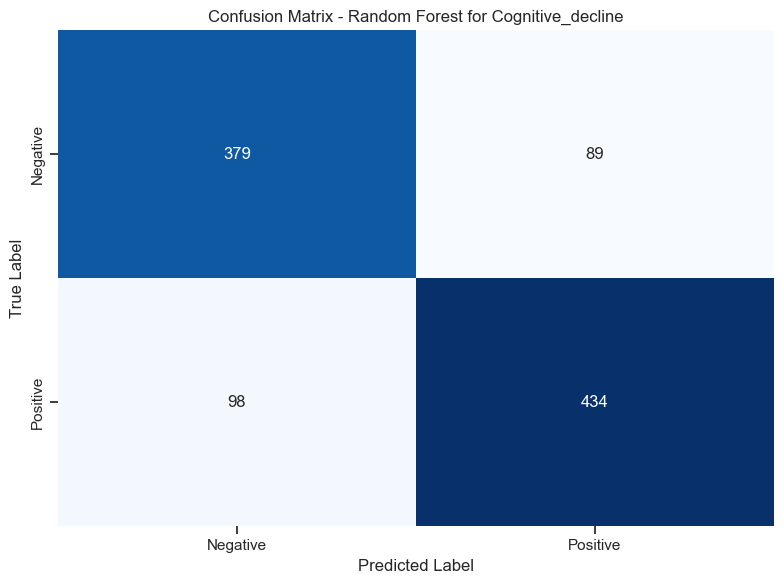

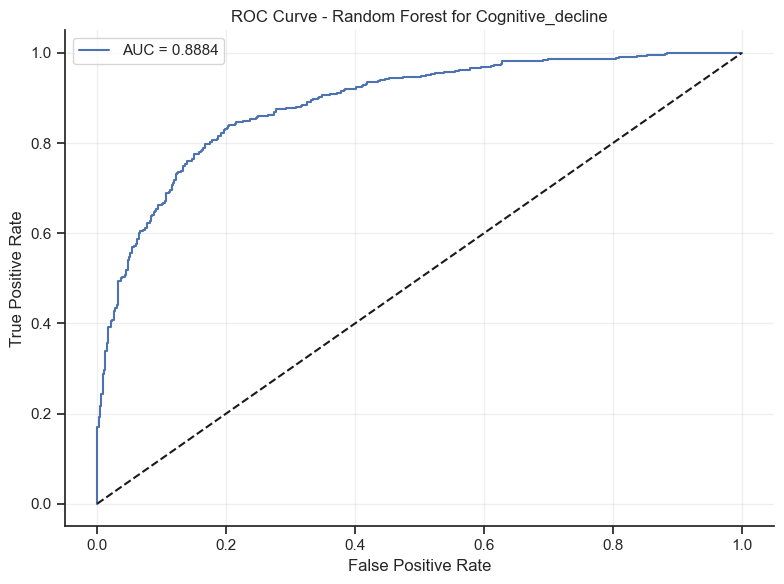

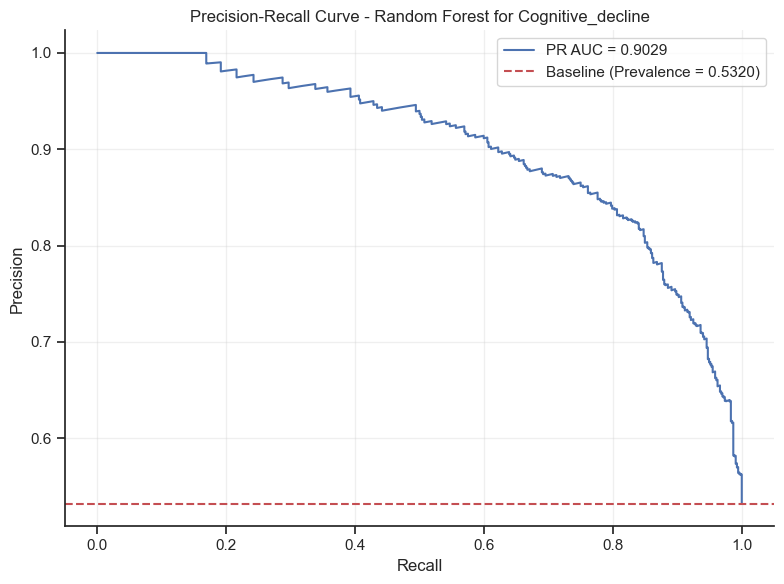

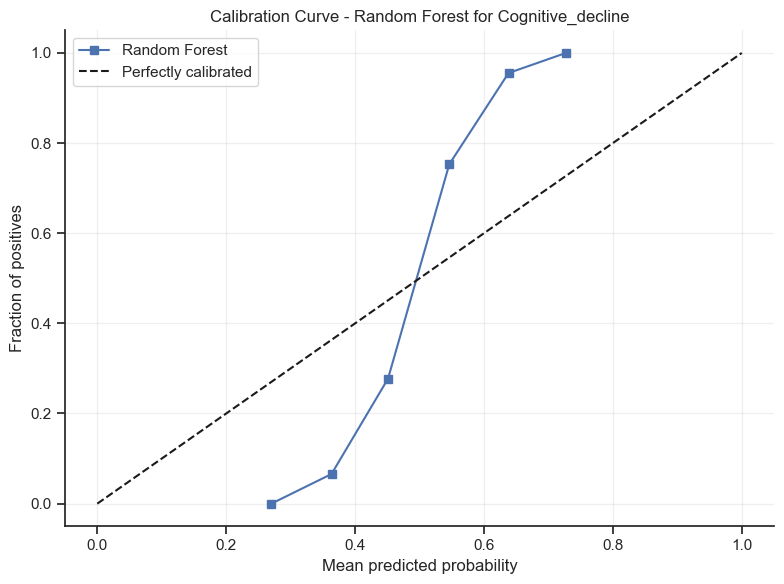

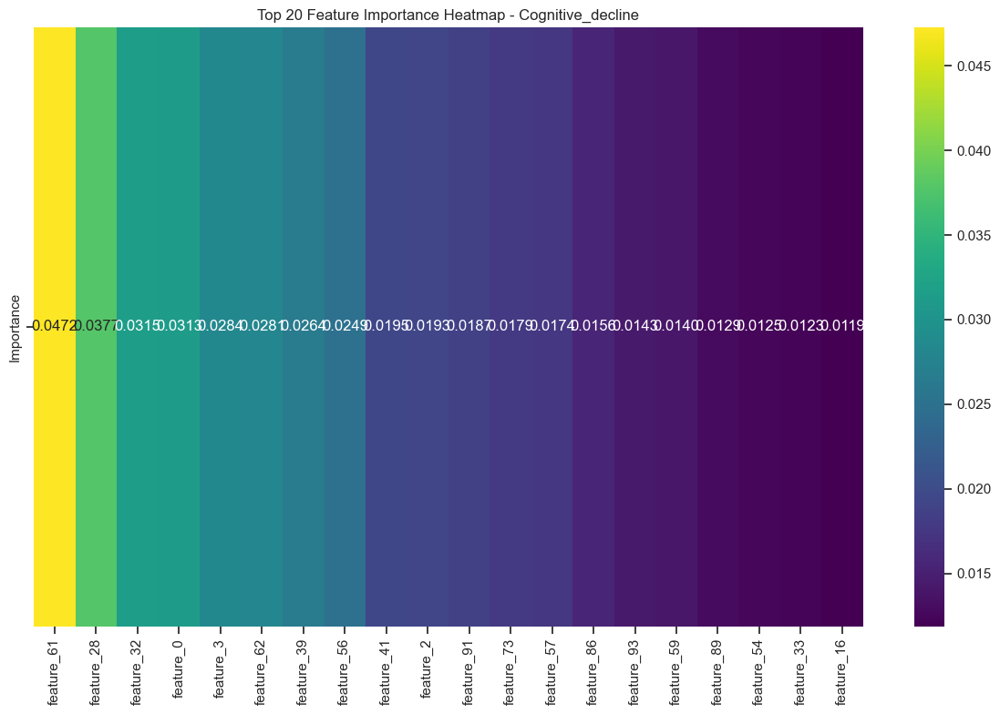


Evaluating Random Forest for HEALTHY

Random Forest metrics for HEALTHY:
Accuracy: 0.7910
Precision: 0.7826
Recall (Sensitivity): 0.8000
Specificity: 0.7822
F1 Score: 0.7912
AUC: 0.8799
Avg Precision (PR AUC): 0.8874

Clinical metrics:
Negative Predictive Value (NPV): 0.7996
Positive Likelihood Ratio: 3.6727
Negative Likelihood Ratio: 0.2557
Diagnostic Odds Ratio: 14.3636

Confusion Matrix:
[[395 110]
 [ 99 396]]

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.78      0.79       505
           1       0.78      0.80      0.79       495

    accuracy                           0.79      1000
   macro avg       0.79      0.79      0.79      1000
weighted avg       0.79      0.79      0.79      1000



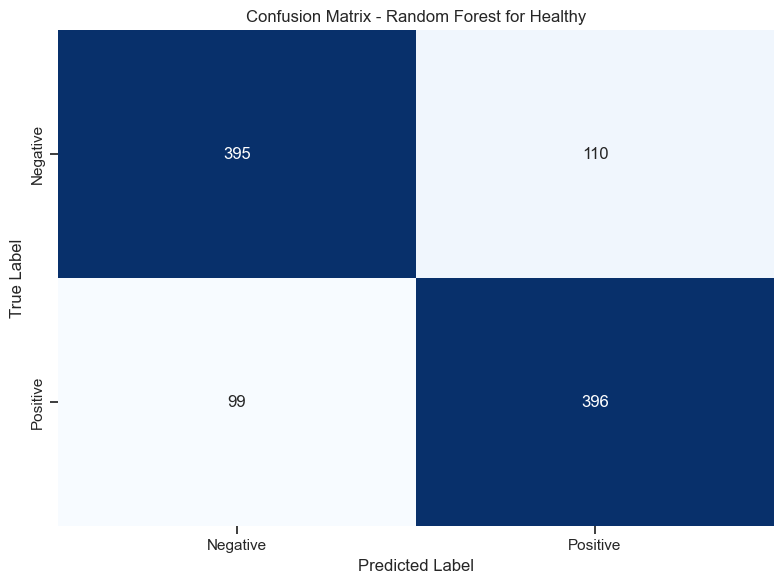

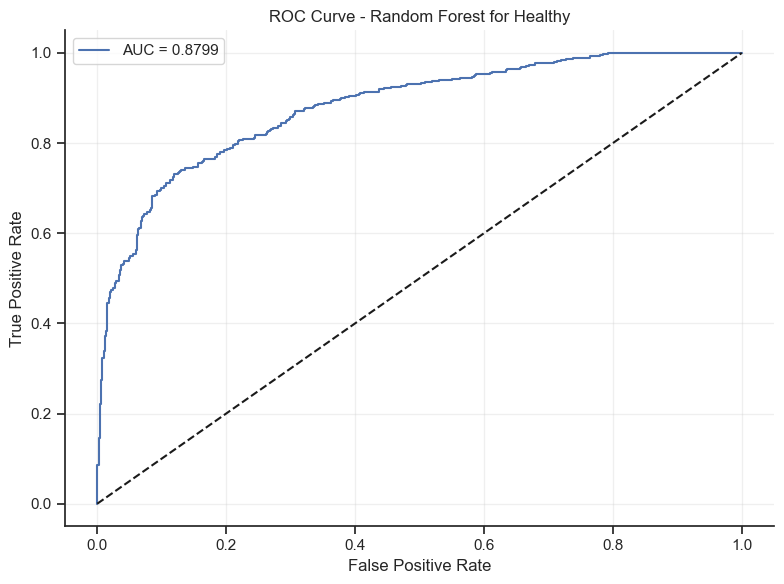

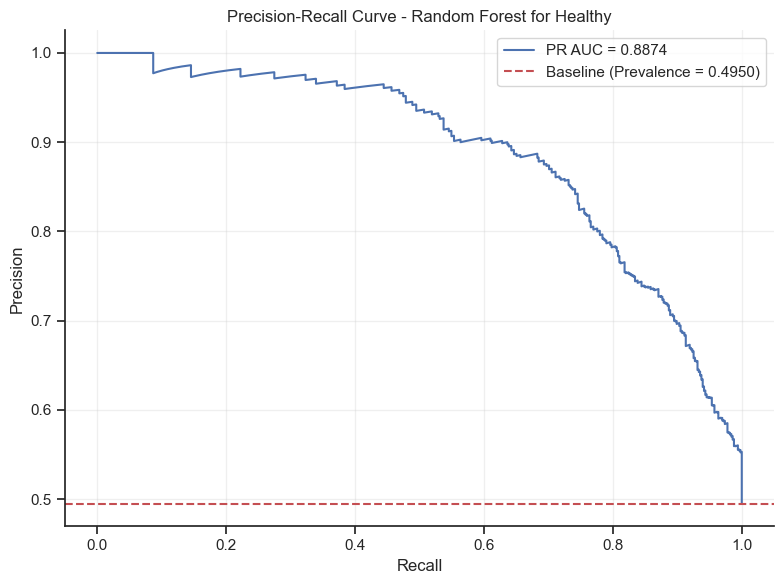

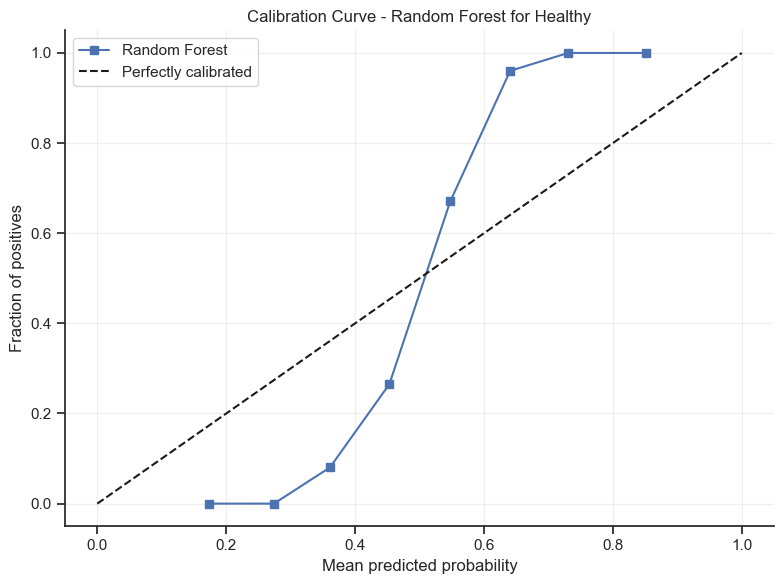

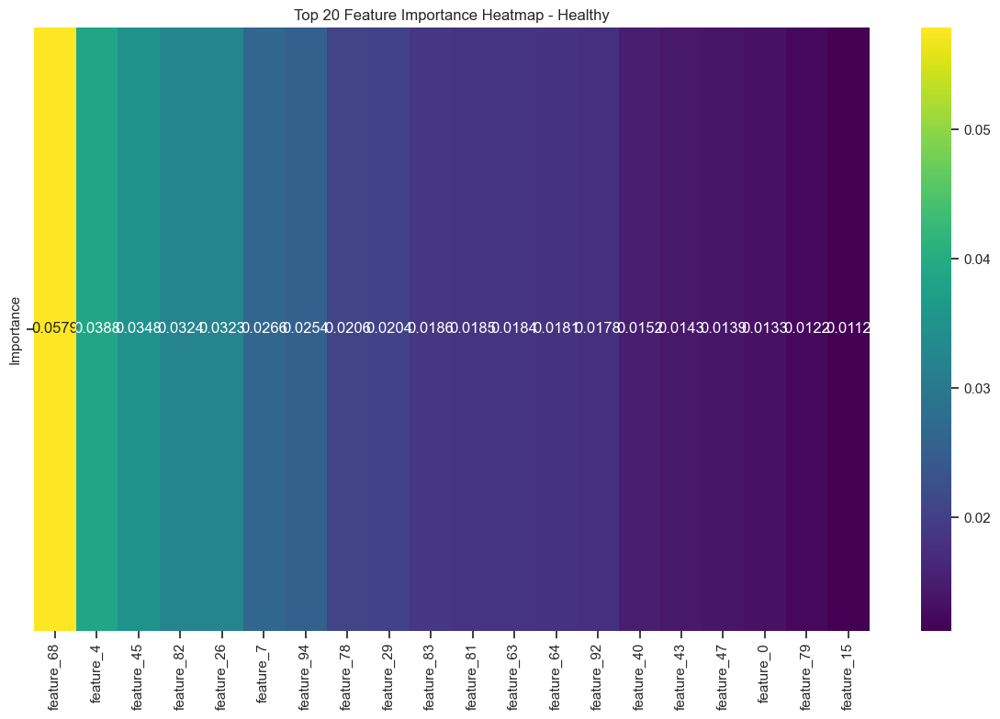

In [20]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)
from sklearn.calibration import calibration_curve


# Cell: Testing and evaluating Random Forest models
print("\nEvaluating Random Forest models...")

# Create a function for comprehensive evaluation
def evaluate_model(y_true, y_pred, y_prob, model_name, condition):
    # Classification metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)  # Sensitivity
    specificity = recall_score(y_true, y_pred, pos_label=0)  # Specificity
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_prob)
    avg_precision = average_precision_score(y_true, y_prob)  # Area under precision-recall curve
    
    # Print metrics
    print(f"\n{model_name} metrics for {condition.upper()}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall (Sensitivity): {recall:.4f}")
    print(f"Specificity: {specificity:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC: {auc:.4f}")
    print(f"Avg Precision (PR AUC): {avg_precision:.4f}")
    
    # Additional medical metrics
    # Positive Predictive Value (PPV) = Precision
    # Negative Predictive Value (NPV)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn) if (tn + fn) > 0 else 0
    
    # Positive and Negative Likelihood Ratios
    sensitivity = recall
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    positive_lr = sensitivity / (1 - specificity) if (1 - specificity) > 0 else float('inf')
    negative_lr = (1 - sensitivity) / specificity if specificity > 0 else float('inf')
    
    # Diagnostic Odds Ratio
    dor = positive_lr / negative_lr if negative_lr > 0 else float('inf')
    
    print("\nClinical metrics:")
    print(f"Negative Predictive Value (NPV): {npv:.4f}")
    print(f"Positive Likelihood Ratio: {positive_lr:.4f}")
    print(f"Negative Likelihood Ratio: {negative_lr:.4f}")
    print(f"Diagnostic Odds Ratio: {dor:.4f}")
    
    # Confusion matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_true, y_pred)
    print(cm)
    
    # Detailed classification report
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred))
    
    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Negative', 'Positive'],
                yticklabels=['Negative', 'Positive'])
    plt.title(f'Confusion Matrix - {model_name} for {condition.capitalize()}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()
    
    # Plot ROC Curve
    plt.figure(figsize=(8, 6))
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    plt.plot(fpr, tpr, label=f'AUC = {auc:.4f}')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name} for {condition.capitalize()}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Plot Precision-Recall Curve
    plt.figure(figsize=(8, 6))
    precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_prob)
    plt.plot(recall_curve, precision_curve, label=f'PR AUC = {avg_precision:.4f}')
    plt.axhline(y=sum(y_true)/len(y_true), color='r', linestyle='--', label=f'Baseline (Prevalence = {sum(y_true)/len(y_true):.4f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name} for {condition.capitalize()}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Calibration curve (for probabilistic predictions)
    plt.figure(figsize=(8, 6))
    fraction_of_positives, mean_predicted_value = calibration_curve(y_true, y_prob, n_bins=10)
    plt.plot(mean_predicted_value, fraction_of_positives, "s-", label=f"{model_name}")
    plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
    plt.xlabel("Mean predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title(f"Calibration Curve - {model_name} for {condition.capitalize()}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Return metrics dictionary
    metrics = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'specificity': specificity,
        'f1': f1,
        'auc': auc,
        'avg_precision': avg_precision,
        'npv': npv,
        'positive_lr': positive_lr,
        'negative_lr': negative_lr,
        'dor': dor
    }
    
    return metrics

# Evaluate Random Forest models
rf_metrics = {}
for condition, results in rf_results.items():
    print(f"\n{'='*50}")
    print(f"Evaluating Random Forest for {condition.upper()}")
    print(f"{'='*50}")
    
    y_test = results['y_test']
    y_pred = results['y_pred']
    y_prob = results['y_prob']
    
    rf_metrics[condition] = evaluate_model(
        y_test, y_pred, y_prob, 
        model_name="Random Forest", 
        condition=condition
    )
    
    # Additional feature importance analysis
    if condition in rf_models:
        model = rf_models[condition]
        X_test = results['X_test']
        
        # Top 10 important features
        feature_importance = pd.DataFrame({
            'feature': X_test.columns,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False)
        
        # Feature importance heat map
        plt.figure(figsize=(12, 8))
        importance_pivot = pd.DataFrame(index=X_test.columns, data=model.feature_importances_, columns=['Importance'])
        importance_pivot = importance_pivot.sort_values('Importance', ascending=False).head(20)
        sns.heatmap(importance_pivot.T, cmap='viridis', annot=True, fmt='.4f')
        plt.title(f'Top 20 Feature Importance Heatmap - {condition.capitalize()}')
        plt.tight_layout()
        plt.show()




Evaluating CNN-LSTM models...

Evaluating CNN-LSTM for INSOMNIA

CNN-LSTM metrics for INSOMNIA:
Accuracy: 0.9470
Precision: 0.9304
Recall (Sensitivity): 0.9630
Specificity: 0.9319
F1 Score: 0.9464
AUC: 0.9914
Avg Precision (PR AUC): 0.9911

Clinical metrics:
Negative Predictive Value (NPV): 0.9638
Positive Likelihood Ratio: 14.1418
Negative Likelihood Ratio: 0.0397
Diagnostic Odds Ratio: 355.8286

Confusion Matrix:
[[479  35]
 [ 18 468]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95       514
           1       0.93      0.96      0.95       486

    accuracy                           0.95      1000
   macro avg       0.95      0.95      0.95      1000
weighted avg       0.95      0.95      0.95      1000



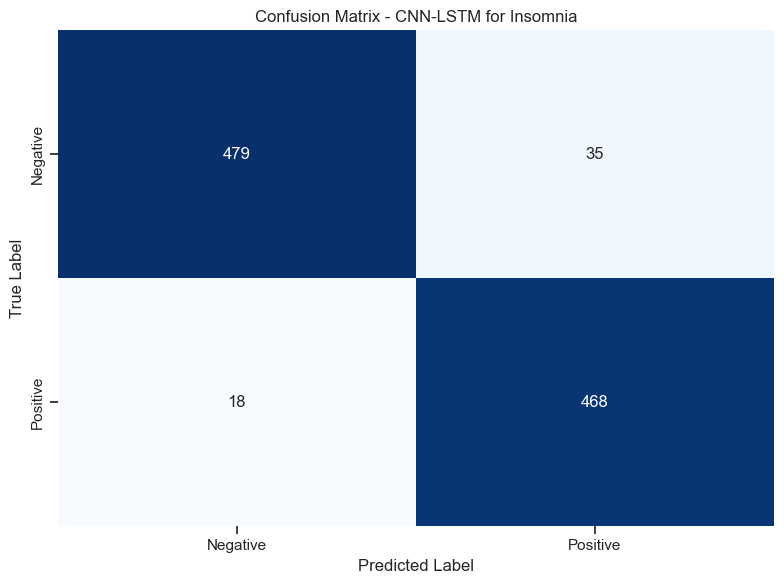

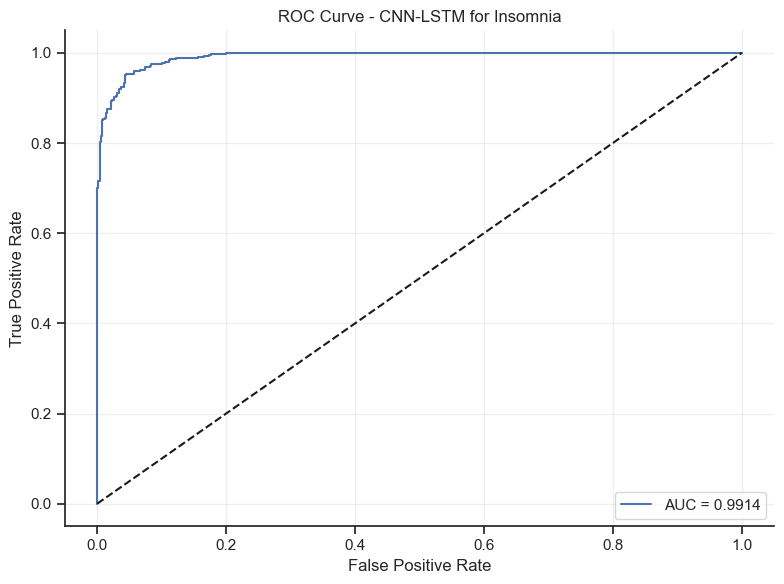

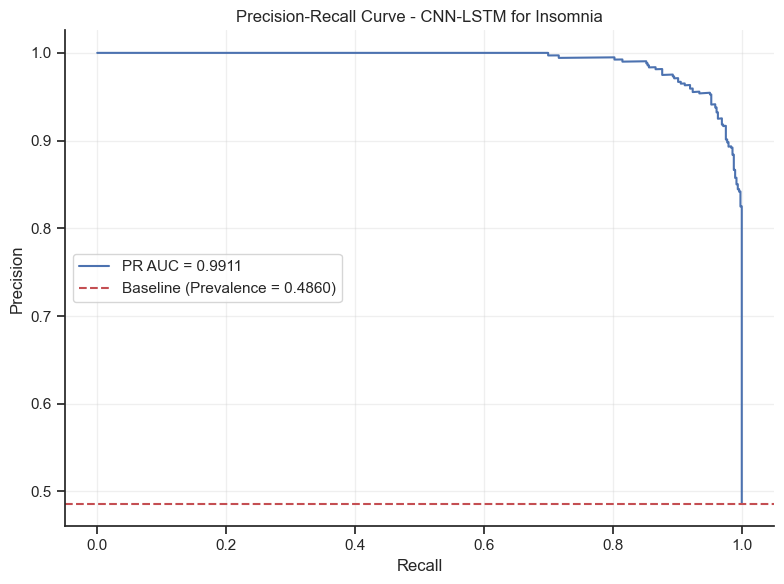

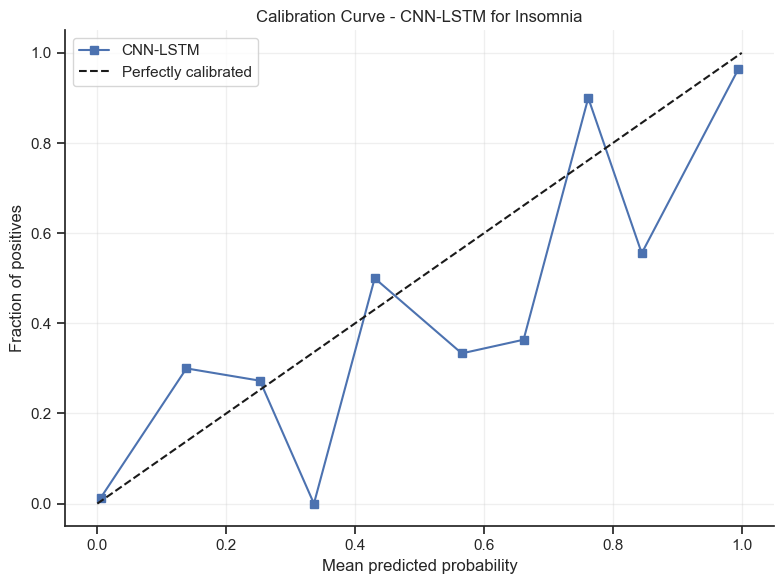


Evaluating CNN-LSTM for ANXIETY

CNN-LSTM metrics for ANXIETY:
Accuracy: 0.9450
Precision: 0.9328
Recall (Sensitivity): 0.9574
Specificity: 0.9329
F1 Score: 0.9449
AUC: 0.9904
Avg Precision (PR AUC): 0.9905

Clinical metrics:
Negative Predictive Value (NPV): 0.9575
Positive Likelihood Ratio: 14.2766
Negative Likelihood Ratio: 0.0457
Diagnostic Odds Ratio: 312.6835

Confusion Matrix:
[[473  34]
 [ 21 472]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95       507
           1       0.93      0.96      0.94       493

    accuracy                           0.94      1000
   macro avg       0.95      0.95      0.94      1000
weighted avg       0.95      0.94      0.95      1000



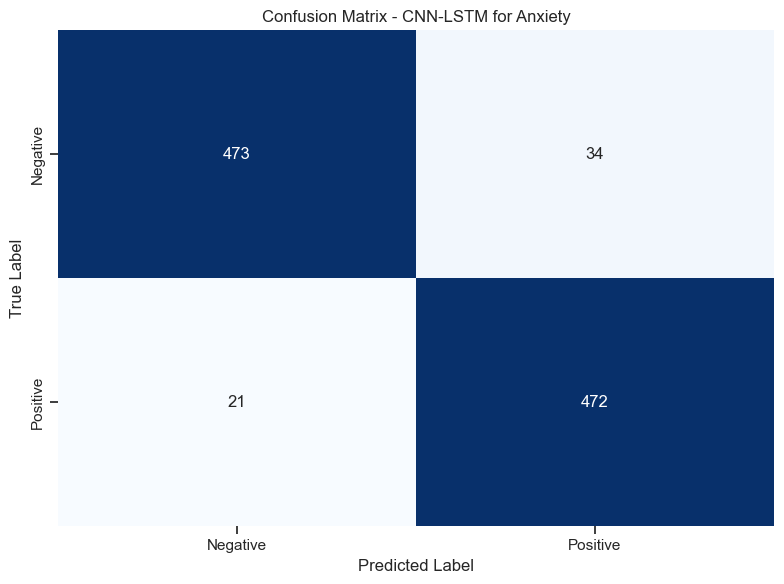

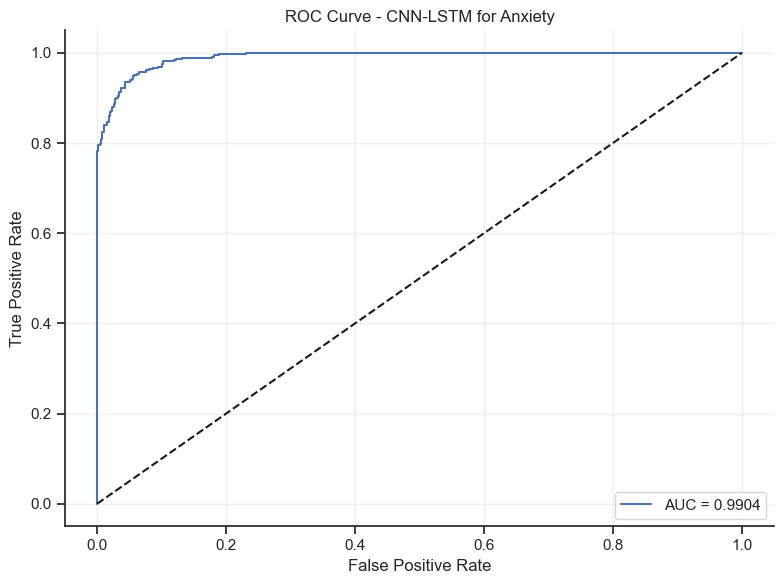

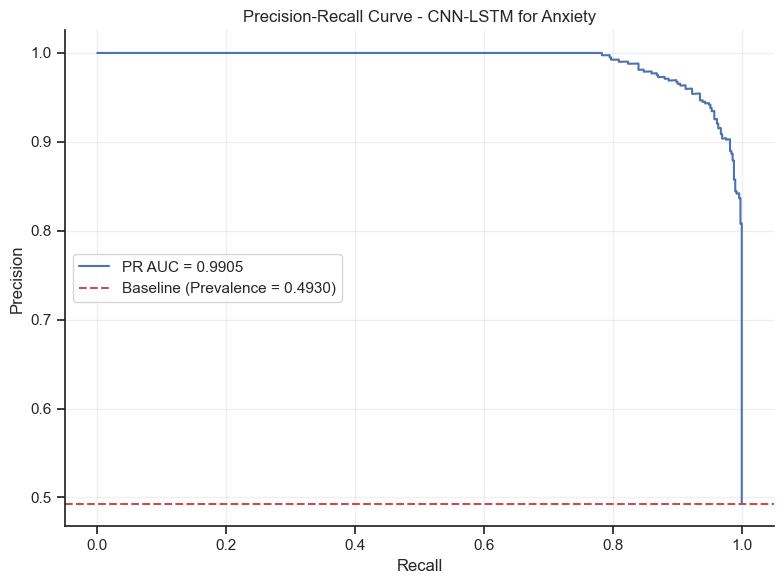

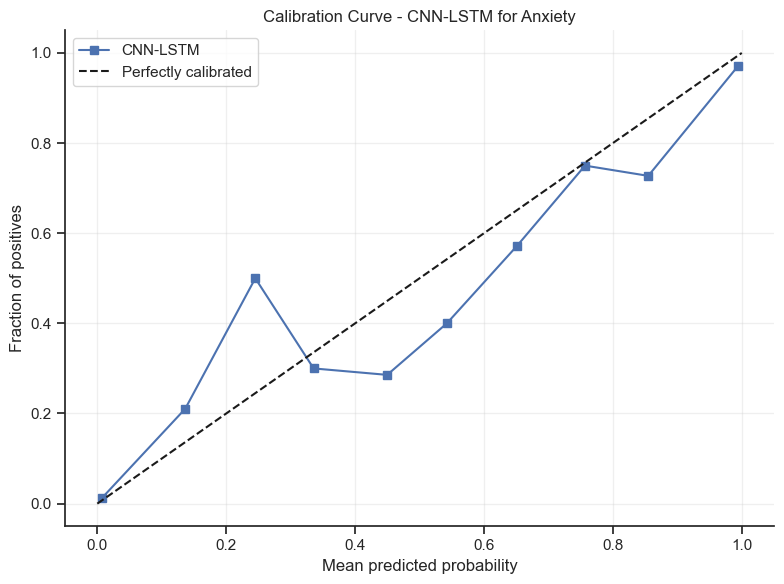


Evaluating CNN-LSTM for DEPRESSION

CNN-LSTM metrics for DEPRESSION:
Accuracy: 0.9390
Precision: 0.9525
Recall (Sensitivity): 0.9187
Specificity: 0.9577
F1 Score: 0.9353
AUC: 0.9893
Avg Precision (PR AUC): 0.9887

Clinical metrics:
Negative Predictive Value (NPV): 0.9274
Positive Likelihood Ratio: 21.7159
Negative Likelihood Ratio: 0.0848
Diagnostic Odds Ratio: 255.9650

Confusion Matrix:
[[498  22]
 [ 39 441]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       520
           1       0.95      0.92      0.94       480

    accuracy                           0.94      1000
   macro avg       0.94      0.94      0.94      1000
weighted avg       0.94      0.94      0.94      1000



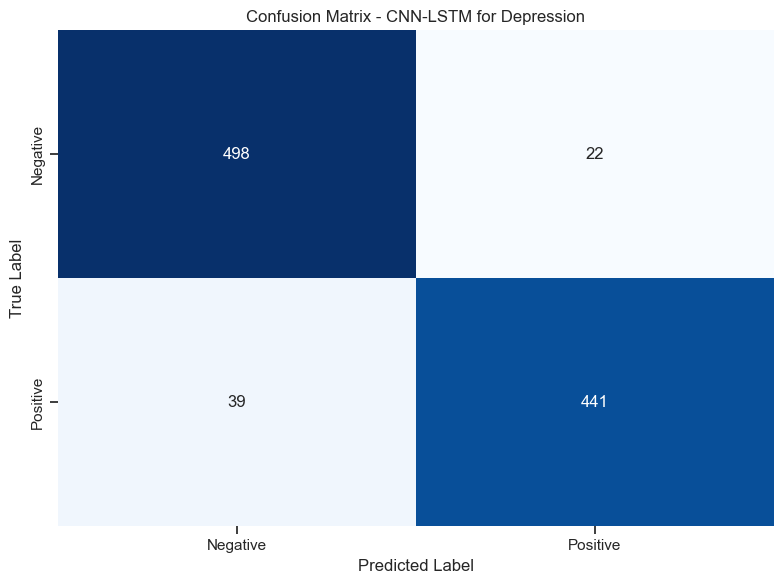

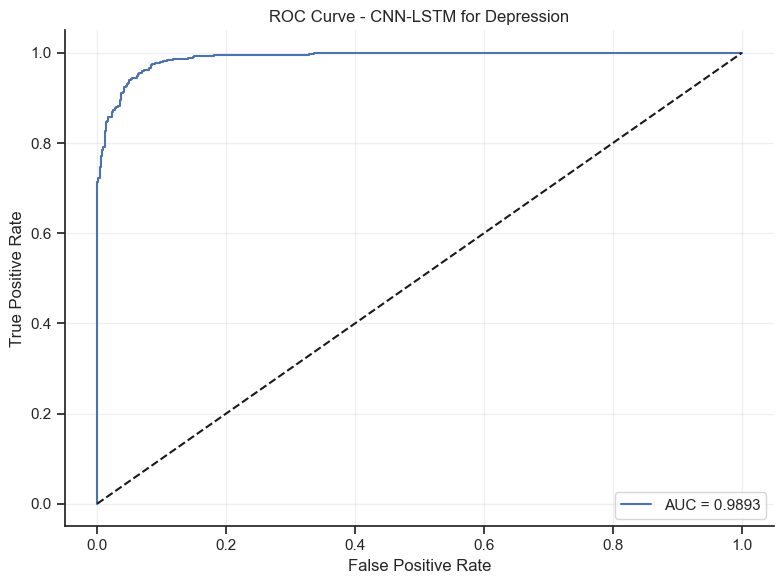

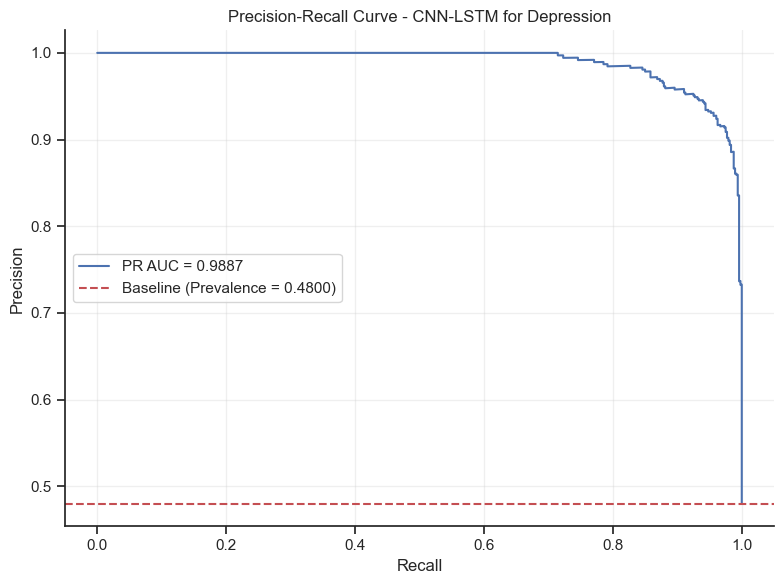

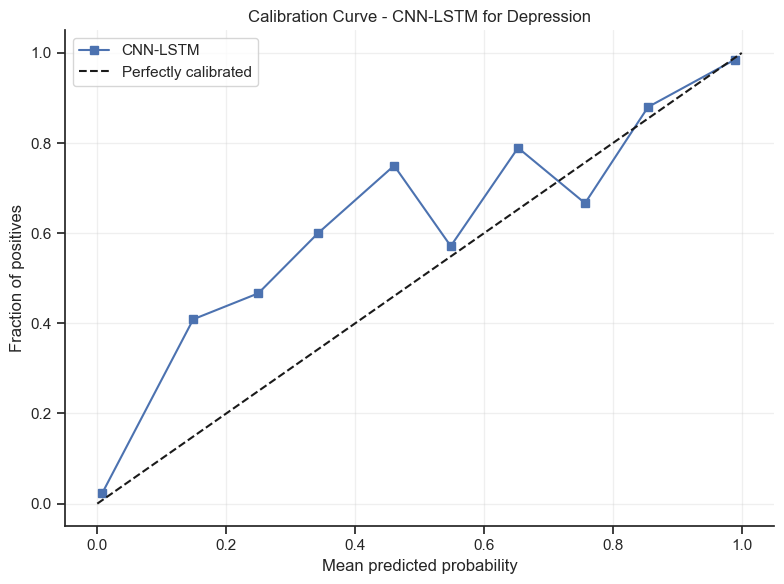


Evaluating CNN-LSTM for ADHD

CNN-LSTM metrics for ADHD:
Accuracy: 0.9460
Precision: 0.9379
Recall (Sensitivity): 0.9595
Specificity: 0.9314
F1 Score: 0.9486
AUC: 0.9904
Avg Precision (PR AUC): 0.9912

Clinical metrics:
Negative Predictive Value (NPV): 0.9552
Positive Likelihood Ratio: 13.9860
Negative Likelihood Ratio: 0.0434
Diagnostic Odds Ratio: 321.9394

Confusion Matrix:
[[448  33]
 [ 21 498]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       481
           1       0.94      0.96      0.95       519

    accuracy                           0.95      1000
   macro avg       0.95      0.95      0.95      1000
weighted avg       0.95      0.95      0.95      1000



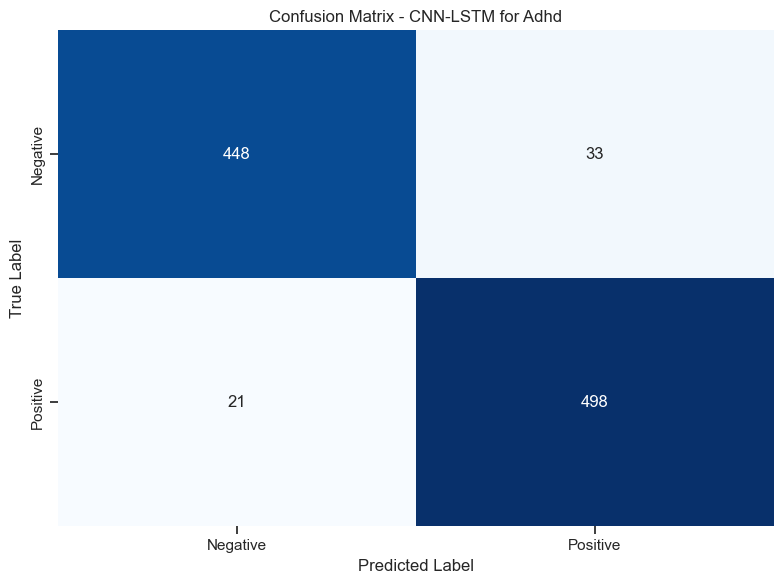

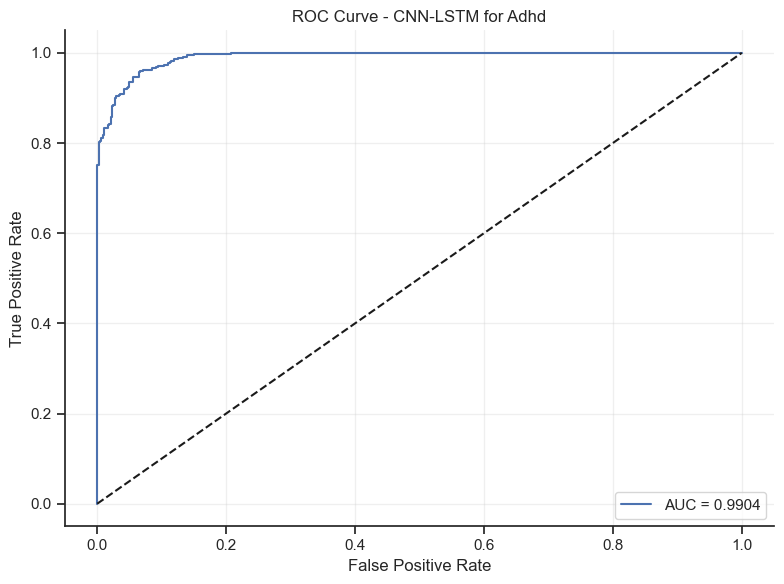

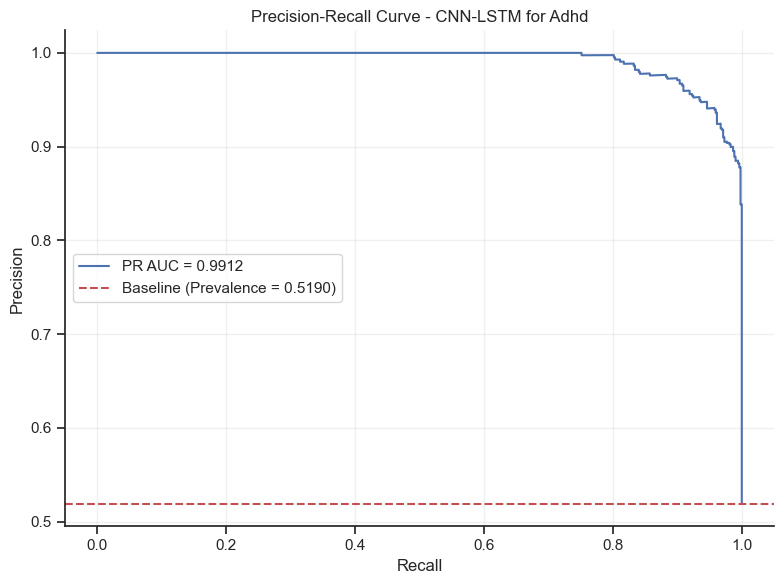

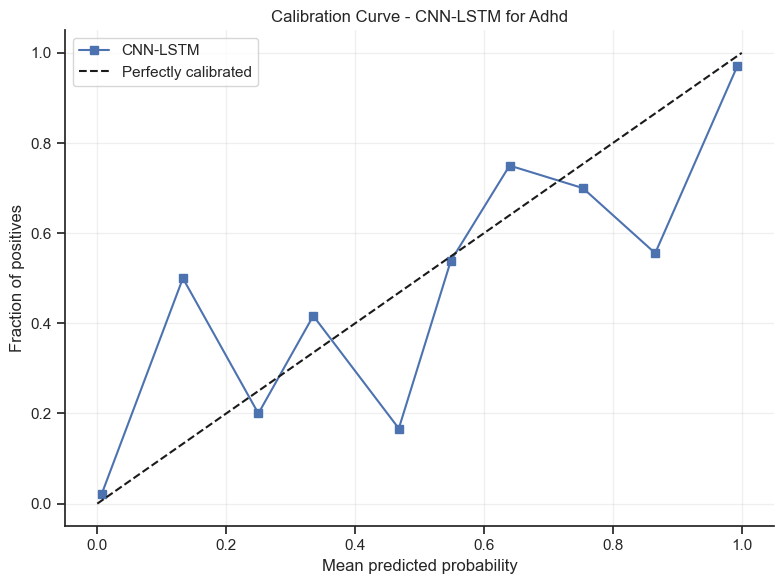


Evaluating CNN-LSTM for APNEA

CNN-LSTM metrics for APNEA:
Accuracy: 0.9480
Precision: 0.9541
Recall (Sensitivity): 0.9384
Specificity: 0.9571
F1 Score: 0.9462
AUC: 0.9917
Avg Precision (PR AUC): 0.9914

Clinical metrics:
Negative Predictive Value (NPV): 0.9424
Positive Likelihood Ratio: 21.8817
Negative Likelihood Ratio: 0.0644
Diagnostic Odds Ratio: 339.9803

Confusion Matrix:
[[491  22]
 [ 30 457]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       513
           1       0.95      0.94      0.95       487

    accuracy                           0.95      1000
   macro avg       0.95      0.95      0.95      1000
weighted avg       0.95      0.95      0.95      1000



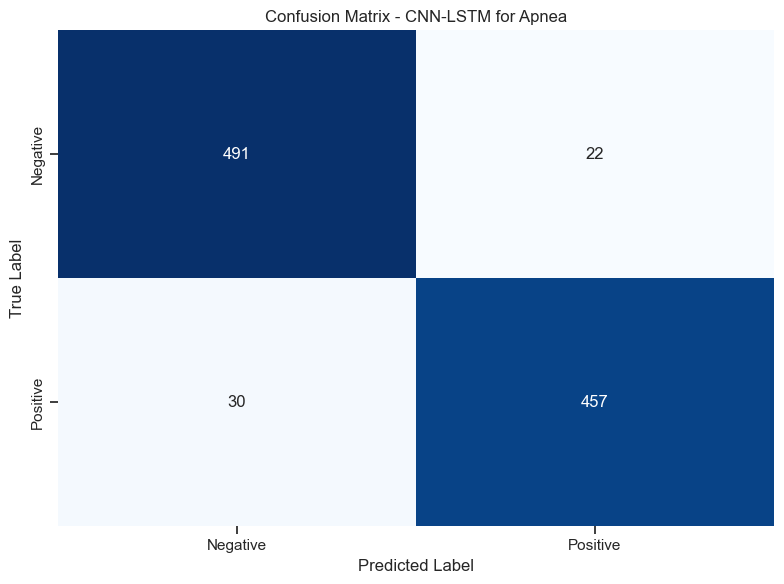

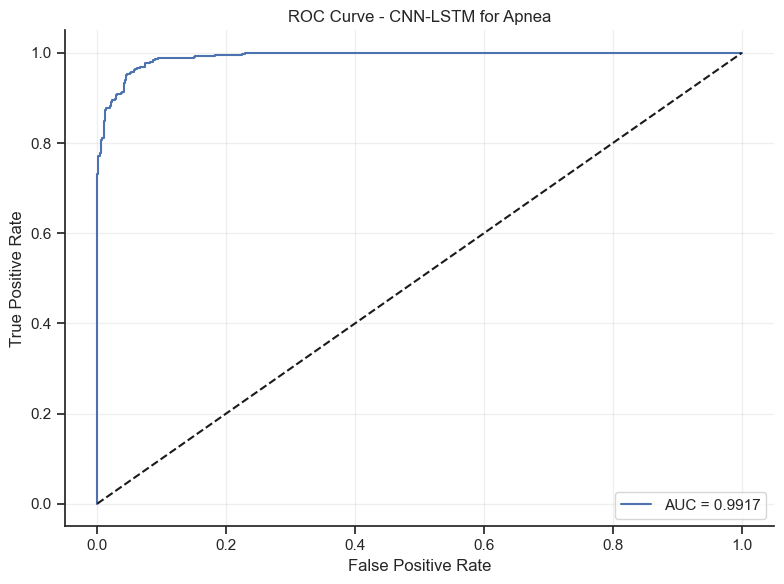

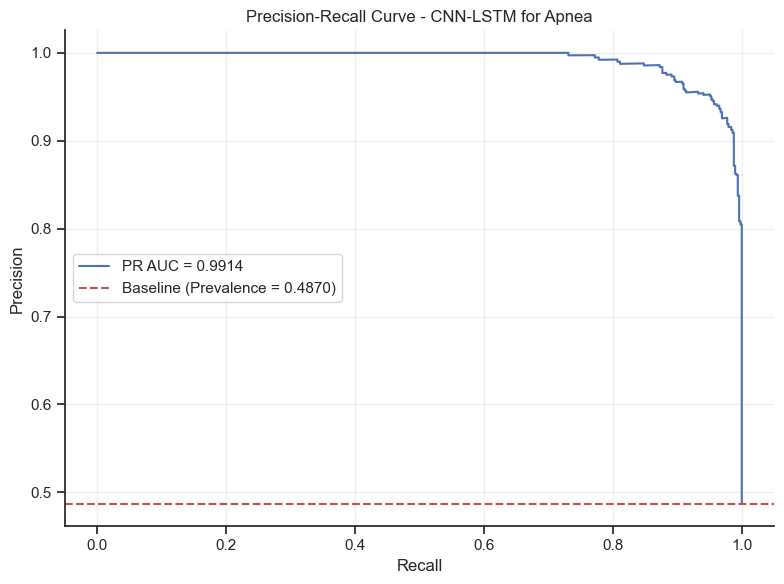

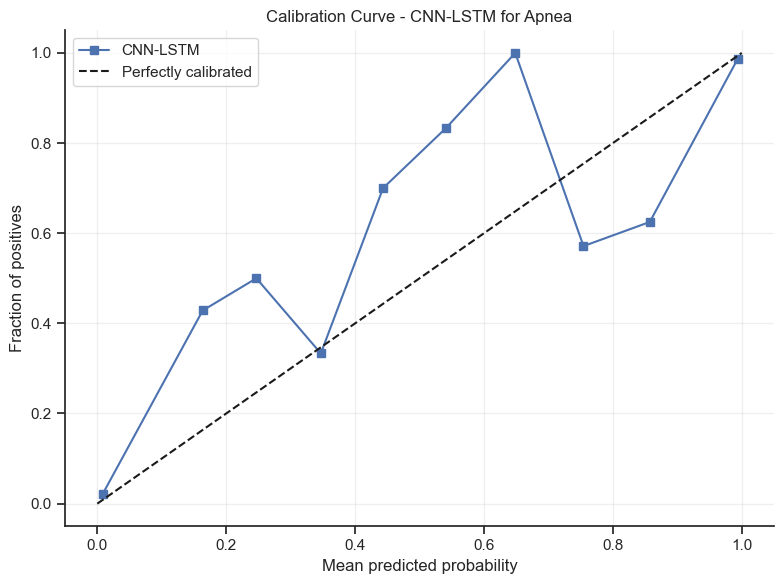


Evaluating CNN-LSTM for COGNITIVE_DECLINE

CNN-LSTM metrics for COGNITIVE_DECLINE:
Accuracy: 0.9530
Precision: 0.9482
Recall (Sensitivity): 0.9643
Specificity: 0.9402
F1 Score: 0.9562
AUC: 0.9921
Avg Precision (PR AUC): 0.9932

Clinical metrics:
Negative Predictive Value (NPV): 0.9586
Positive Likelihood Ratio: 16.1173
Negative Likelihood Ratio: 0.0380
Diagnostic Odds Ratio: 424.2857

Confusion Matrix:
[[440  28]
 [ 19 513]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       468
           1       0.95      0.96      0.96       532

    accuracy                           0.95      1000
   macro avg       0.95      0.95      0.95      1000
weighted avg       0.95      0.95      0.95      1000



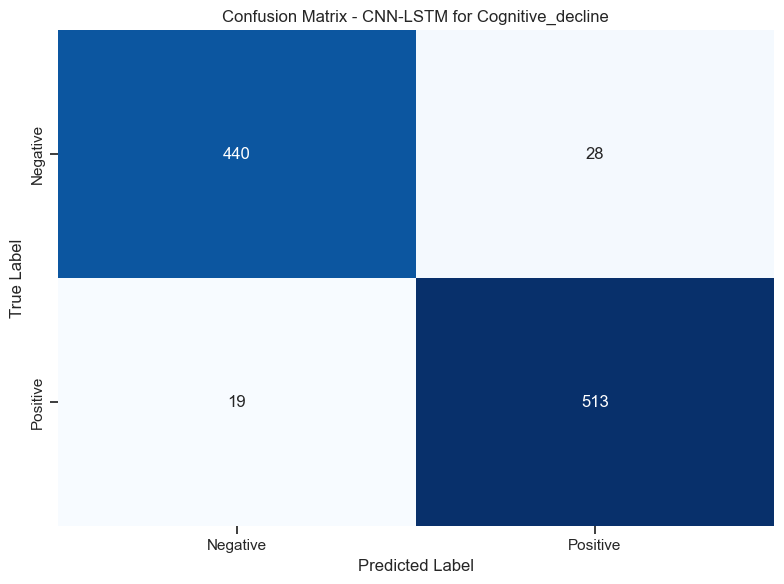

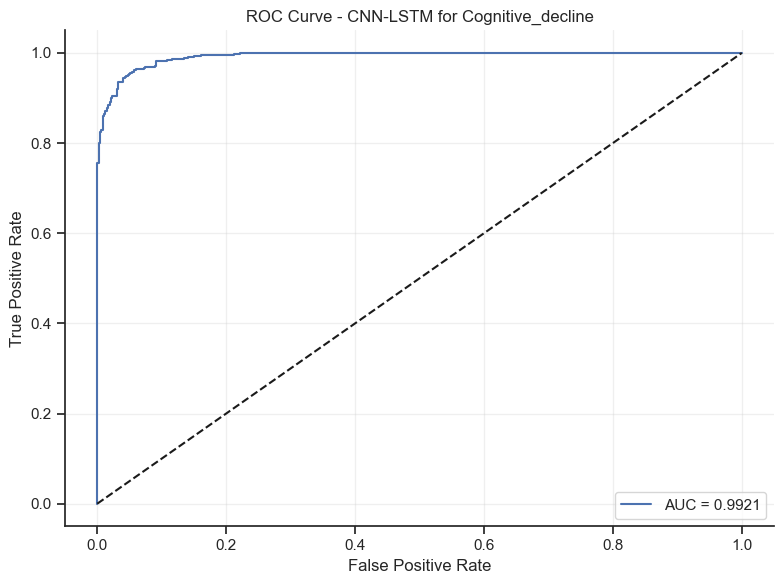

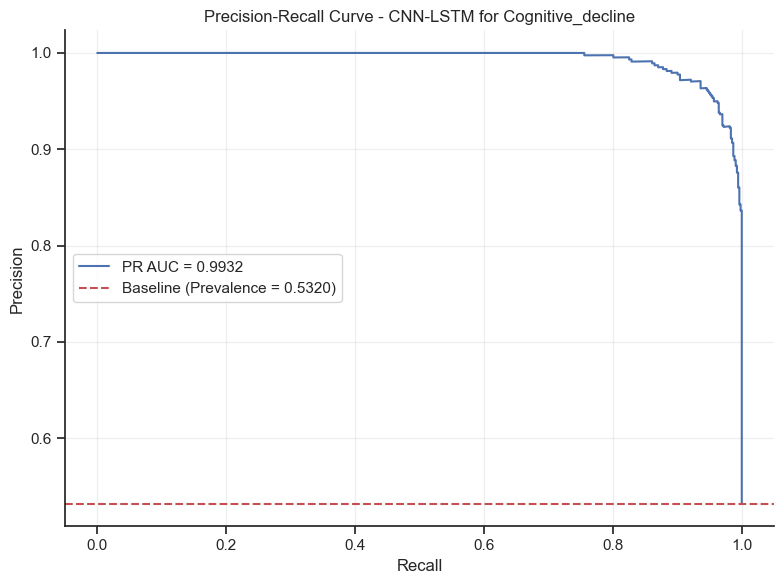

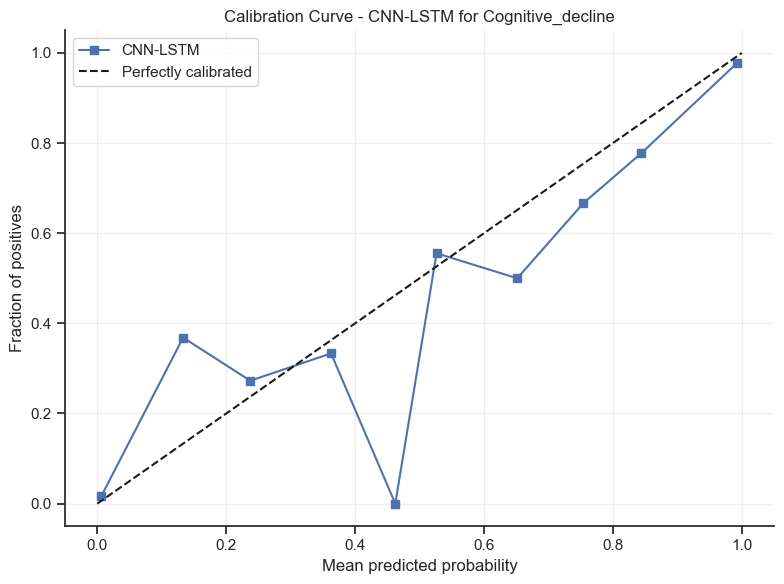


Evaluating CNN-LSTM for HEALTHY

CNN-LSTM metrics for HEALTHY:
Accuracy: 0.9490
Precision: 0.9531
Recall (Sensitivity): 0.9434
Specificity: 0.9545
F1 Score: 0.9482
AUC: 0.9926
Avg Precision (PR AUC): 0.9924

Clinical metrics:
Negative Predictive Value (NPV): 0.9451
Positive Likelihood Ratio: 20.7145
Negative Likelihood Ratio: 0.0593
Diagnostic Odds Ratio: 349.5248

Confusion Matrix:
[[482  23]
 [ 28 467]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       505
           1       0.95      0.94      0.95       495

    accuracy                           0.95      1000
   macro avg       0.95      0.95      0.95      1000
weighted avg       0.95      0.95      0.95      1000



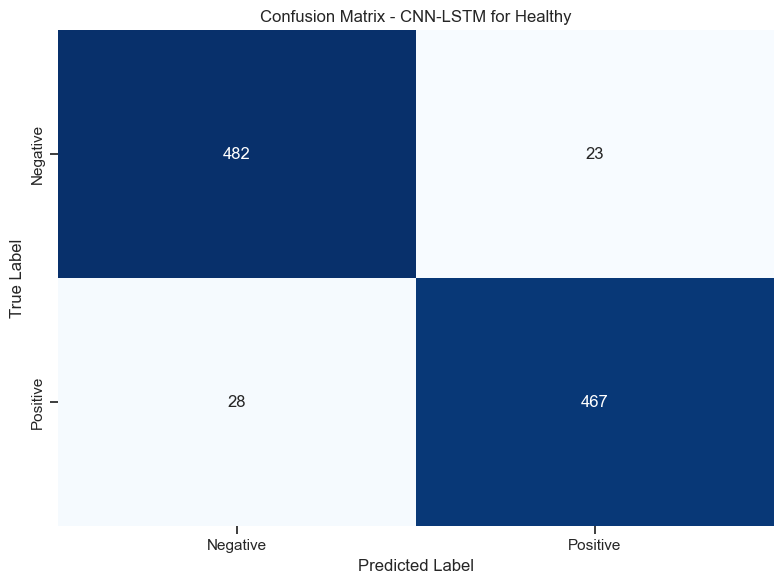

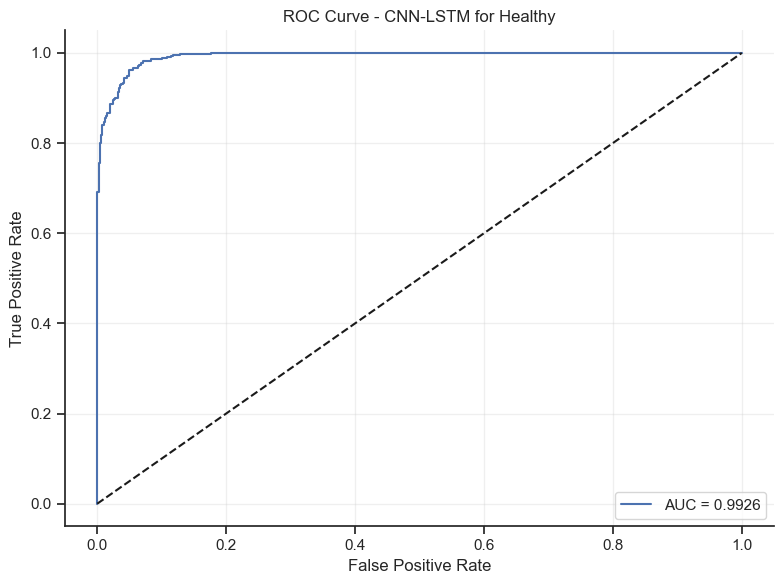

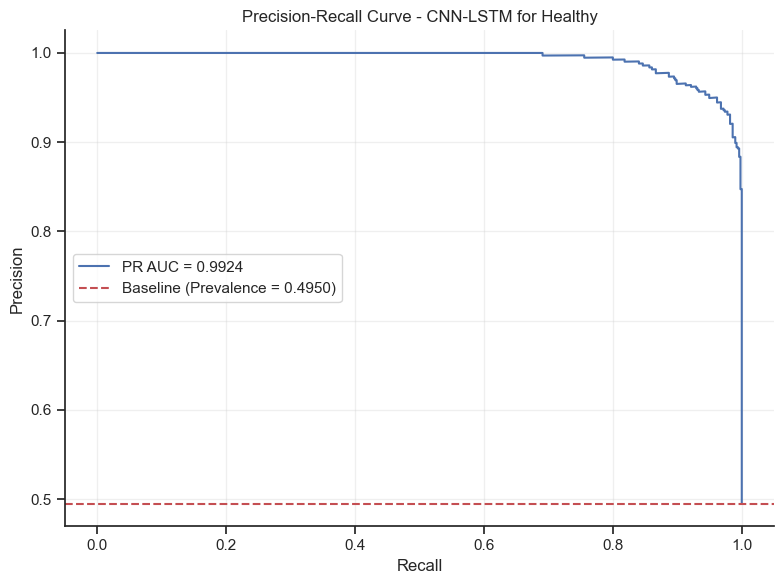

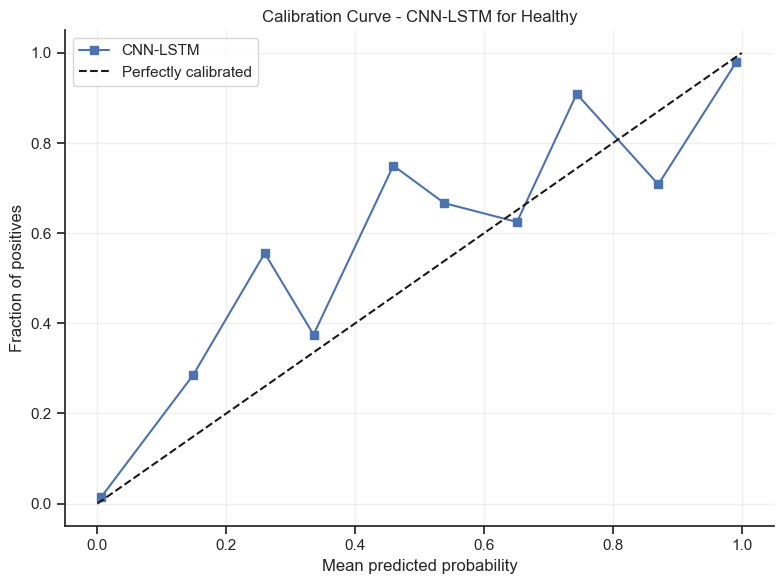

In [22]:
# Cell: Testing and evaluating CNN-LSTM models
print("\nEvaluating CNN-LSTM models...")

# Evaluate CNN-LSTM models
cnn_lstm_metrics = {}
for condition, results in cnn_lstm_results.items():
    print(f"\n{'='*50}")
    print(f"Evaluating CNN-LSTM for {condition.upper()}")
    print(f"{'='*50}")
    
    y_test = results['y_test']
    y_pred = results['y_pred']
    y_prob = results['y_prob']
    
    cnn_lstm_metrics[condition] = evaluate_model(
        y_test, y_pred, y_prob, 
        model_name="CNN-LSTM", 
        condition=condition
    )




Comparing model performance across all conditions...
Full model comparison table:
            Condition          Model  Accuracy  Precision    Recall  Specificity  F1 Score       AUC    PR AUC       NPV     Pos LR    Neg LR         DOR
0            insomnia  Random Forest     0.787   0.779141  0.783951     0.789883  0.781538  0.875326  0.869153  0.794521   3.731024  0.273521   13.640741
1            insomnia       CNN-LSTM     0.947   0.930417  0.962963     0.931907  0.946411  0.991385  0.991051  0.963783  14.141799  0.039743  355.828571
2             anxiety  Random Forest     0.794   0.814004  0.754564     0.832347  0.783158  0.890066  0.892574  0.777164   4.500752  0.294872   15.263393
3             anxiety       CNN-LSTM     0.945   0.932806  0.957404     0.932939  0.944945  0.990434  0.990473  0.957490  14.276578  0.045658  312.683473
4          depression  Random Forest     0.802   0.785425  0.808333     0.796154  0.796715  0.888045  0.883776  0.818182   3.965409  0.240741   16.

<Figure size 1400x800 with 0 Axes>

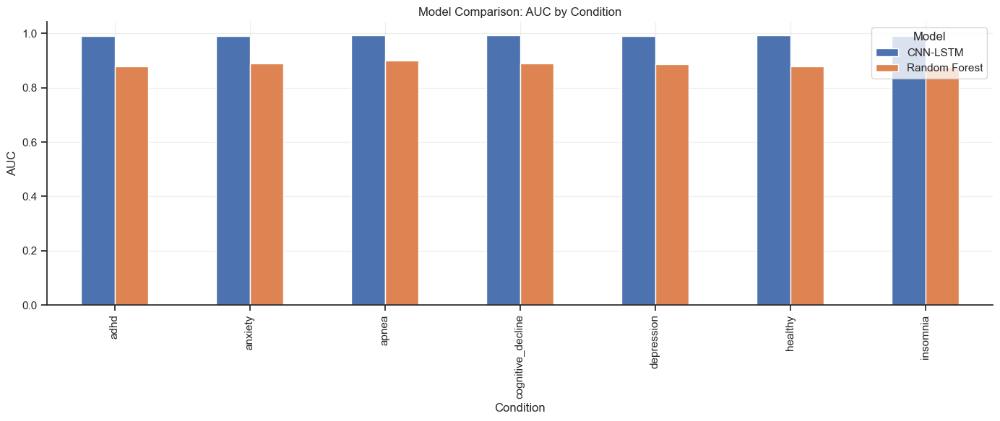

<Figure size 1400x600 with 0 Axes>

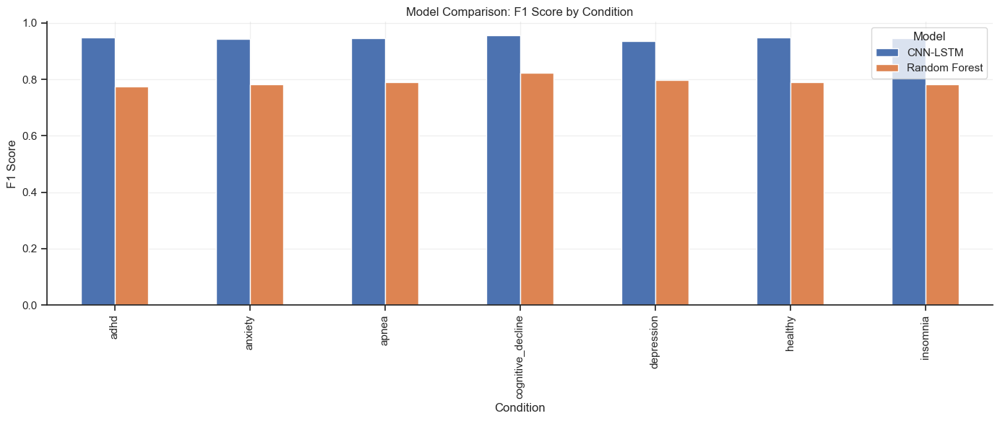

<Figure size 1400x600 with 0 Axes>

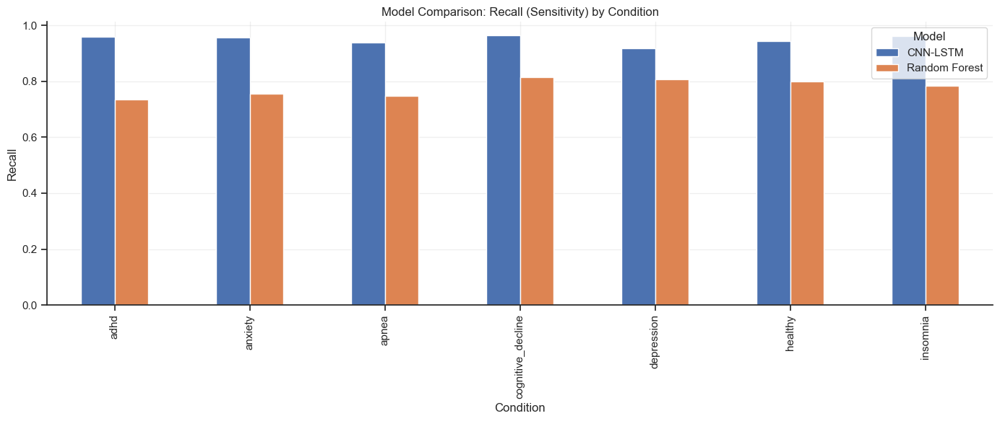

<Figure size 1400x600 with 0 Axes>

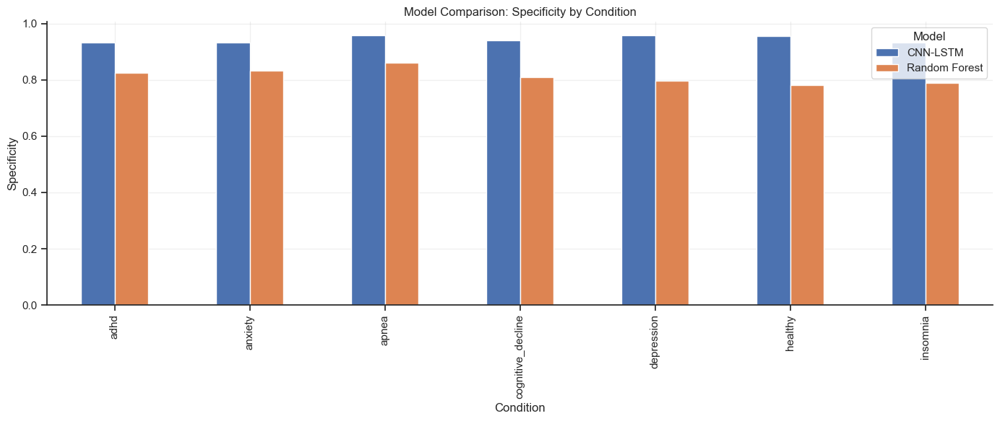

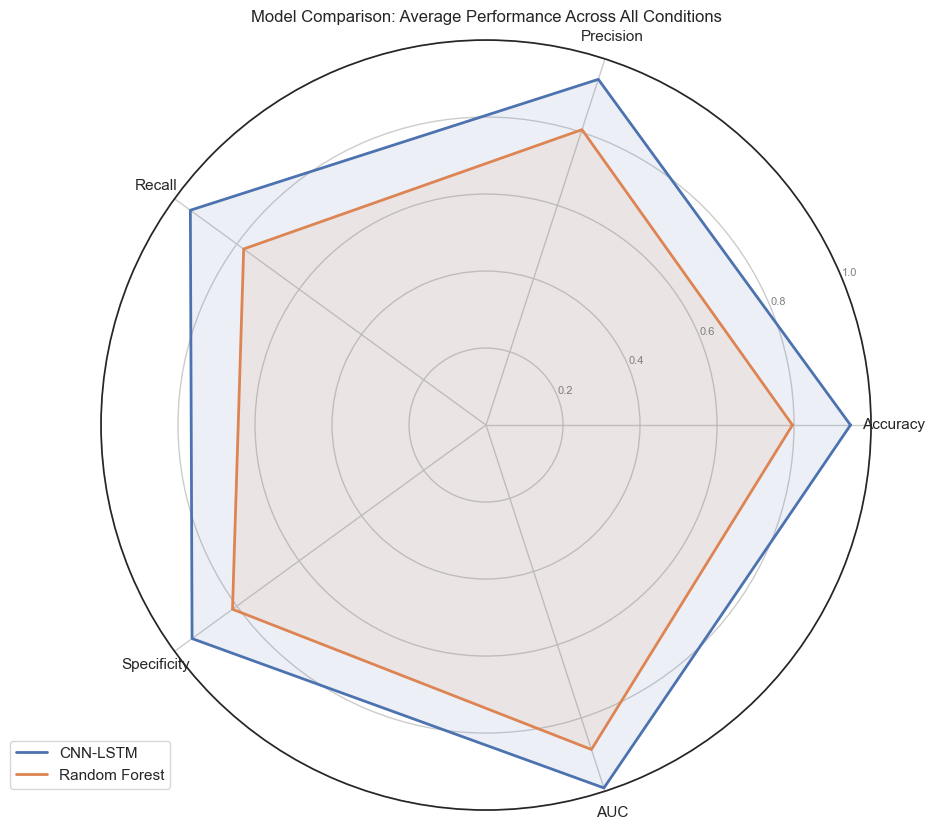

In [24]:
print("\nComparing model performance across all conditions...")

# Create a DataFrame to compare metrics across models and conditions
comparison_data = []

for condition in conditions:
    if condition in rf_metrics and condition in cnn_lstm_metrics:
        rf_data = rf_metrics[condition]
        cnn_lstm_data = cnn_lstm_metrics[condition]
        
        comparison_data.append({
            'Condition': condition,
            'Model': 'Random Forest',
            'Accuracy': rf_data['accuracy'],
            'Precision': rf_data['precision'],
            'Recall': rf_data['recall'],
            'Specificity': rf_data['specificity'],
            'F1 Score': rf_data['f1'],
            'AUC': rf_data['auc'],
            'PR AUC': rf_data['avg_precision'],
            'NPV': rf_data['npv'],
            'Pos LR': rf_data['positive_lr'],
            'Neg LR': rf_data['negative_lr'],
            'DOR': rf_data['dor']
        })
        
        comparison_data.append({
            'Condition': condition,
            'Model': 'CNN-LSTM',
            'Accuracy': cnn_lstm_data['accuracy'],
            'Precision': cnn_lstm_data['precision'],
            'Recall': cnn_lstm_data['recall'],
            'Specificity': cnn_lstm_data['specificity'],
            'F1 Score': cnn_lstm_data['f1'],
            'AUC': cnn_lstm_data['auc'],
            'PR AUC': cnn_lstm_data['avg_precision'],
            'NPV': cnn_lstm_data['npv'],
            'Pos LR': cnn_lstm_data['positive_lr'],
            'Neg LR': cnn_lstm_data['negative_lr'],
            'DOR': cnn_lstm_data['dor']
        })

# Create comparison DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Display full comparison table
print("Full model comparison table:")
print(comparison_df.to_string())

# Calculate average metrics across all conditions for each model
# Exclude the 'Condition' column when calculating mean
numeric_columns = comparison_df.select_dtypes(include=['number']).columns.tolist()
model_avg = comparison_df.groupby('Model')[numeric_columns].mean().reset_index()
print("\nAverage metrics across all conditions:")
print(model_avg.to_string())

# Identify best model for each condition based on AUC
best_models = {}
for condition in conditions:
    condition_df = comparison_df[comparison_df['Condition'] == condition]
    if not condition_df.empty:
        best_model = condition_df.loc[condition_df['AUC'].idxmax()]
        best_models[condition] = best_model['Model']

print("\nBest model for each condition based on AUC:")
for condition, model in best_models.items():
    print(f"{condition.capitalize()}: {model}")

# Visualize model comparison
# AUC comparison
plt.figure(figsize=(14, 8))
comparison_pivot = comparison_df.pivot(index='Condition', columns='Model', values='AUC')
comparison_pivot.plot(kind='bar', figsize=(14, 6))
plt.title('Model Comparison: AUC by Condition')
plt.ylabel('AUC')
plt.xlabel('Condition')
plt.legend(title='Model')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# F1 Score comparison
plt.figure(figsize=(14, 6))
comparison_pivot = comparison_df.pivot(index='Condition', columns='Model', values='F1 Score')
comparison_pivot.plot(kind='bar', figsize=(14, 6))
plt.title('Model Comparison: F1 Score by Condition')
plt.ylabel('F1 Score')
plt.xlabel('Condition')
plt.legend(title='Model')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Recall (Sensitivity) comparison
plt.figure(figsize=(14, 6))
comparison_pivot = comparison_df.pivot(index='Condition', columns='Model', values='Recall')
comparison_pivot.plot(kind='bar', figsize=(14, 6))
plt.title('Model Comparison: Recall (Sensitivity) by Condition')
plt.ylabel('Recall')
plt.xlabel('Condition')
plt.legend(title='Model')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Specificity comparison
plt.figure(figsize=(14, 6))
comparison_pivot = comparison_df.pivot(index='Condition', columns='Model', values='Specificity')
comparison_pivot.plot(kind='bar', figsize=(14, 6))
plt.title('Model Comparison: Specificity by Condition')
plt.ylabel('Specificity')
plt.xlabel('Condition')
plt.legend(title='Model')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Radar plot for overall model comparison
plt.figure(figsize=(10, 10))
# Select metrics for radar plot
radar_metrics = ['Accuracy', 'Precision', 'Recall', 'Specificity', 'AUC']
# Get average metrics for radar plot
radar_data = model_avg[['Model'] + radar_metrics].set_index('Model')

# Number of variables
categories = radar_metrics
N = len(categories)

# Create angle for each category
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]  # Close the loop

# Plot for each model
ax = plt.subplot(111, polar=True)
for model in radar_data.index:
    values = radar_data.loc[model].values.flatten().tolist()
    values += values[:1]  # Close the loop
    ax.plot(angles, values, linewidth=2, label=model)
    ax.fill(angles, values, alpha=0.1)

# Add category labels
plt.xticks(angles[:-1], categories)
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], ['0.2', '0.4', '0.6', '0.8', '1.0'], color='grey', size=8)
plt.ylim(0, 1)
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.title('Model Comparison: Average Performance Across All Conditions')
plt.show()